# 17-13. 프로젝트 : Segmentation map으로 도로 이미지 만들기
이전 Pix2Pix 논문에서 제시한 결과 중에 아래와 같은 실험 결과가 있었습니다. 도로의 레이블 정보를 활용해 이미지를 생성해낸 결과입니다.

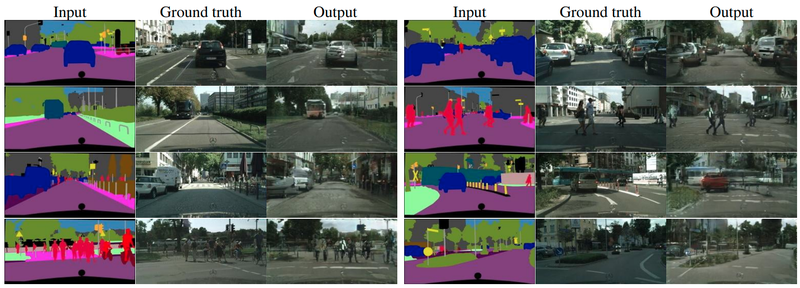

이번 프로젝트는 위와 같은 데이터셋을 이용해 Pix2Pix를 학습시켜보는 것입니다. 데이터셋은 아래에서 다운로드할 수 있습니다.
1000개의 학습용 이미지 및 5개의 평가 이미지를 포함합니다.

[cityscapes.zip](https://d3s0tskafalll9.cloudfront.net/media/documents/cityscapes.zip)

이전 포켓몬 데이터에서 사용했던 스케치와는 조금 다른 레이블 정보 이미지를 입력으로 사용하기 때문에, 전처리 과정에 대해 약간의 혼란이 있을 수 있지만 크게 다른 과정은 없습니다.
아래 Tensroflow에서 제공하는 Pix2Pix 튜토리얼은 위 이미지와 비슷한 레이블 정보 이미지를 사용하기 때문에 좋은 참고 자료가 될 수 있을 것 같습니다.

프로젝트 시작에 어려움이 있다면 아래 튜토리얼을 참고하시면서 이번 프로젝트를 수행해 봅시다.
(아래 튜토리얼은 Pix2Pix 구조를 Functional API를 이용해 구현하기 때문에 이번에 진행한 Subclassing 방법을 이용한 모델 구현과 비교하면서 구현 방법에 대해서도 공부해 보시길 추천드립니다)

- [Tensorflow Pix2Pix Tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ko)

프로젝트를 수행하기 전에 주요 라이브러리 버전을 살펴 봅시다.

In [1]:
import numpy
import tensorflow

print(numpy.__version__)
print(tensorflow.__version__)

1.21.4
2.6.0


### 프로젝트를 진행하면서 필수로 수행해야 할 사항은 다음과 같습니다.

1. 데이터에 한 가지 이상의 **augmentation 방법을 적용**하여 학습해 주세요.
(어떠한 방법을 사용했는지 적어주세요.)

  - (사용된 방법: 1-4 부분 참고) 스케치 및 채색된 2개 이미지를 입력으로 받아 여러 가지 연산을 두 이미지에 동일하게 적용
    1. 두 이미지를 채널 축으로 연결(tf.concat)
    2. 1.의 결과에 각 50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼 적용 (tf.pad)
    3. 2.의 결과에서 (256,256,6) 크기를 가진 이미지를 임의로 잘라냄 (tf.image.random_crop)
    4. 3.의 결과를 50% 확률로 가로로 뒤집기 (tf.image.random_flip_left_right)
    5. 4.의 결과를 50% 확률로 세로로 뒤집기 (tf.image.random_flip_up_down)
    6. 5.의 결과를 50% 확률로 회전 (tf.image.rot90) <br> <br>
2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 **U-Net Generator를 사용**해 주세요.
3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운로드했던 "val" 폴더 내 이미지를 사용해 주세요.
4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 **스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화**해 주세요.
5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 **중간 손실 값에 대한 로그**를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.


# ※ 프로젝트 수행 시작

## 1. 데이터 준비 및 전처리

### 1-1. 데이터 준비 및 개수 확인

- 아래 명령어로 데이터 준비
  - \$ cd ~/aiffel/conditional_generation/data && unzip cityscapes.zip

In [2]:
import os

data_path = os.getenv('HOME')+'/aiffel/conditional_generation/data/cityscapes/train/'
print("number of train examples :", len(os.listdir(data_path)))

number of train examples : 1000


- 학습용 데이터: 1,000개 이미지

In [3]:
data_path2 = os.getenv('HOME')+'/aiffel/conditional_generation/data/cityscapes/val/'
print("number of train examples :", len(os.listdir(data_path2)))

number of train examples : 5


- 테스트 데이터: 5개 이미지

### 1-2. 데이터 시각화 및 이미지 크기 확인
- 각각의 이미지 확인: 학습용 데이터셋에서 임의로 6장 선택 시각화

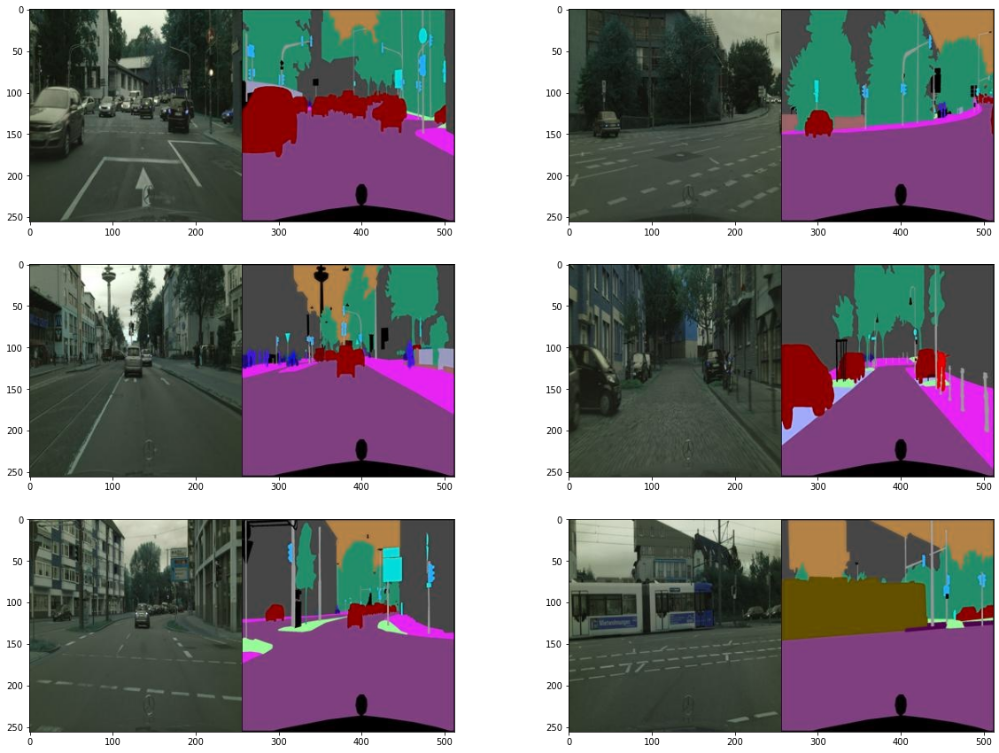

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

- 하나의 이미지에 도로의 실제 이미지와 스케치 이미지가 함께 포함되어 있음
<br> <br>
#### [이미지 크기 확인]

In [5]:
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


- 이미지 크기: (256, 512, 3)
- (256, 256, 3) 크기 이미지를 2개 이미지로 분할하여 학습에 사용

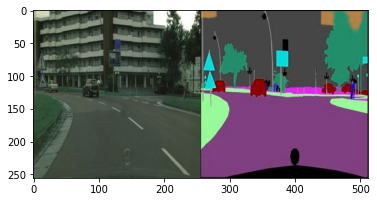

In [6]:
plt.imshow(img)

### 1-3. 이미지 분할

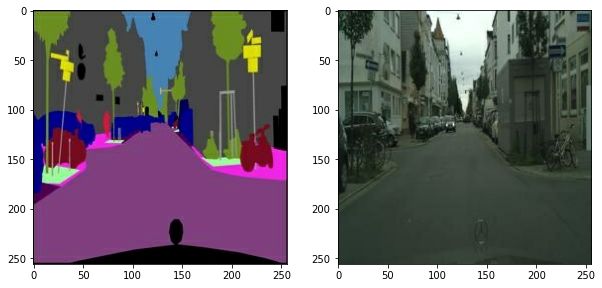

In [7]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    #sketch = img[:, :w, :] 
    #sketch = tf.cast(sketch, tf.float32)
    #colored = img[:, w:, :] 
    #colored = tf.cast(colored, tf.float32)
    colored = img[:, :w, :] 
    colored = tf.cast(colored, tf.float32)
    sketch = img[:, w:, :] 
    sketch = tf.cast(sketch, tf.float32)
    return normalize(sketch), normalize(colored)

f = data_path + os.listdir(data_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

### 1-4. 데이터 Augmentation
- 학습에 사용하는 데이터의 다양성을 높이기 위해 여러 augmentation 방법 적용

In [8]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


- apply_augmentation 함수
  - 스케치 이미지와 채색된 이미지를 입력으로 받아 여러 가지 연산을 두 이미지에 동일하게 적용  

#### [사용된 방법]
1. 두 이미지를 채널 축으로 연결(tf.concat): 두 이미지가 각각 3채널인 경우 6채널이 됨
2. 1.의 결과에 각 50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼 적용 (tf.pad)
3. 2.의 결과에서 (256,256,6) 크기를 가진 이미지를 임의로 잘라냄 (tf.image.random_crop)
4. 3.의 결과를 50% 확률로 가로로 뒤집기 (tf.image.random_flip_left_right)
5. 4.의 결과를 50% 확률로 세로로 뒤집기 (tf.image.random_flip_up_down)
6. 5.의 결과를 50% 확률로 회전 (tf.image.rot90)

#### [적용 결과 확인 - 시각화]

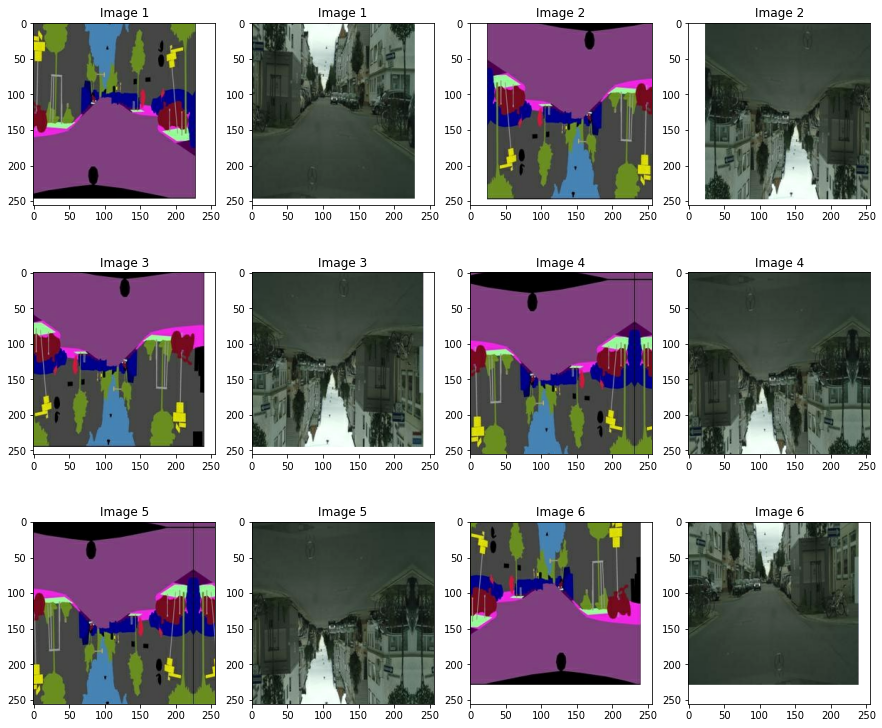

In [9]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

- **적용된 결과 검토** (확률적으로 변형을 시도하므로 실행할 때마다 결과가 다름)
  - Image 1: 왼쪽, 위쪽으로 옮겨짐 (tf.pad)
  - Image 2: Image1이 세로로 뒤집기 적용됨 (tf.image.random_flip_up_down)
  - Image 3: 왼쪽, 위쪽으로 옮겨짐 (tf.pad) + 세로로 뒤집기 적용됨 (tf.image.random_flip_up_down)
  - Image 4: 세로로 뒤집기 적용됨 (tf.image.random_flip_up_down)
  - Image 5: Reflection 패딩 (tf.pad) + 세로로 뒤집기 적용됨 (tf.image.random_flip_up_down)
  - Image 6: 왼쪽, 위쪽으로 옮겨짐 (tf.pad) 

#### [전체 적용]
- 학습 데이터 전체에 Augmentation 적용 및 결과 확인 (하나의 이미지만 시각화)

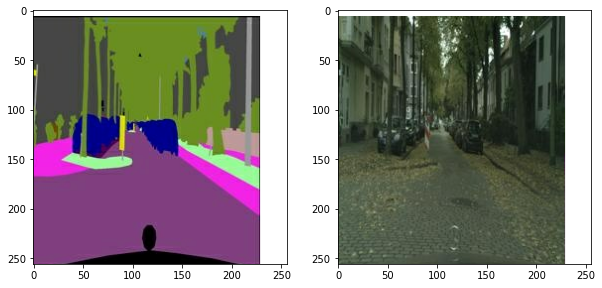

In [10]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

## 2. Pix2Pix Generator 구성
- Tensorflow의 Subclassing 방법 이용

### 2-1. Encode Block 구현
  - "Convolution → BatchNorm → LeakyReLU"의 3개 레이어로 구성된 기본적인 블록을 하나의 레이어로 구현

In [11]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

print("✅")

✅


### 2-2. Encoder 구현

In [12]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i == 0:
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


### 2-3. Encoder 모델 확인
- 레이어가 제대로 구성되었는지 확인
  - Encoder에 (256,256,3) 크기의 데이터를 입력했을 때, 어떤 크기의 데이터가 출력되는지 확인

In [13]:
Encoder().get_summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encode_block (EncodeBlock)   (None, 128, 128, 64)      3072      
_________________________________________________________________
encode_block_1 (EncodeBlock) (None, 64, 64, 128)       131584    
_________________________________________________________________
encode_block_2 (EncodeBlock) (None, 32, 32, 256)       525312    
_________________________________________________________________
encode_block_3 (EncodeBlock) (None, 16, 16, 512)       2099200   
_________________________________________________________________
encode_block_4 (EncodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
encode_block_5 (EncodeBlock) (None, 4, 4, 512)         419635

### 2-4. Decode Block 및 Decoder 구현

In [14]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

    
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                self.blocks.append(DecodeBlock(f))
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False))
        
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,512)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
print("✅")

✅


- 처음 세 개의 블록에서만 Dropout 사용
- 마지막 convolution에는 3개의 필터를 사용해 출력

### 2-5. Decoder 모델 확인
- 레이어가 제대로 구성되었는지 확인
  - Decoder에 (1,1,512) 크기의 데이터가 입력되었을 때, 어떤 크기가 출력되는지 확인

In [15]:
Decoder().get_summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1, 1, 512)]       0         
_________________________________________________________________
decode_block (DecodeBlock)   (None, 2, 2, 512)         4196352   
_________________________________________________________________
decode_block_1 (DecodeBlock) (None, 4, 4, 512)         4196352   
_________________________________________________________________
decode_block_2 (DecodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
decode_block_3 (DecodeBlock) (None, 16, 16, 512)       4196352   
_________________________________________________________________
decode_block_4 (DecodeBlock) (None, 32, 32, 256)       2098176   
_________________________________________________________________
decode_block_5 (DecodeBlock) (None, 64, 64, 128)       5248

- (width, height) 크기가 점점 늘어나고 사용 필터의 수는 점점 줄어들어 최종 (256,256,3) 크기로 출력

### 2-6. Plain Generator 구현
- Encoder와 Decoder를 연결
  - Encoder에서 (256,256,3) 입력이 (1,1,512)로 변환
  - Decoder를 통과해 다시 원래 입력 크기와 같은 (256,256,3)의 결과를 얻을 수 있음
  - 스케치를 입력으로 이런 연산 과정을 통해 채색된 이미지 출력

In [16]:
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def call(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        

EncoderDecoderGenerator().get_summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encoder_1 (Encoder)          (None, 1, 1, 512)         19544576  
_________________________________________________________________
decoder_1 (Decoder)          (None, 256, 256, 3)       19542784  
Total params: 39,087,360
Trainable params: 39,076,480
Non-trainable params: 10,880
_________________________________________________________________


- Generator: 약 4000만 개의 파라미터(Trainable params: 39,076,480)

###  2-7. U-Net Generator 구현
- 이전 단계에서 구현했던 Plain Generator를 수정하여 U-Net 구조 구현
  - \_\_init\_\_() 메서드에서 Encoder 및 Decoder에서 사용할 모든 블록 정의
  - call()에서 forward propagation
    - skip connection 구현

In [17]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


### 2-8. U-Net Generator 모델 확인

In [18]:
UNetGenerator().get_summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block_16 (EncodeBlock)   (None, 128, 128, 64) 3072        input_4[0][0]                    
__________________________________________________________________________________________________
encode_block_17 (EncodeBlock)   (None, 64, 64, 128)  131584      encode_block_16[0][0]            
__________________________________________________________________________________________________
encode_block_18 (EncodeBlock)   (None, 32, 32, 256)  525312      encode_block_17[0][0]            
____________________________________________________________________________________________

- Skip connection을 추가한 U-Net Generator의 파라미터 약 5,500만 개
  - Plain Generator 파라미터는 약 4,000만 개

## 3. Pix2Pix Discriminator 구현

### 3-1. Discriminator Block구현

In [19]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


### 3-2. Discriminator 구현

In [20]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


- 첫 번째 블록은 단순한 연결(concat) 수행
- Discriminator의 최종 출력은 sigmoid 활성화 사용

### 3-3. Discriminator 모델 확인

In [21]:
Discriminator().get_summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_5[0][0]                    
                                                                 input_6[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

- 임의의 (256,256,3) 크기의 입력을 넣어 나오는 (30,30) 출력 시각화해

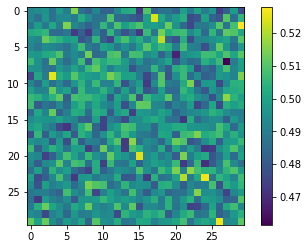

In [22]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

## 4. 모델 학습

### 4-1. 손실함수 구현
- 두 가지 손실 함수(L1 손실함수, cGAN 손실함수) 모두 사용

In [23]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


### 4-2. Optimizer 구현

In [24]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


### 4-3. Train Step 구현
- 하나의 배치 크기만큼 데이터를 입력했을 때 가중치를 1회 업데이트하는 과정 구현

In [25]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


- gene_total_loss 계산 라인에서 최종 Generator 손실을 계산할 때, L1 손실에 100(=λ)을 곱함
  - λ는 학습 과정에서 L1 손실을 얼마나 반영할 것인지를 나타내며 논문에서는 λ=100을 사용

### 4-4. 학습 실행

In [26]:
EPOCHS = 500

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:0.9305                     
L1_loss:0.3551                     
Discriminator_loss:1.3430

EPOCH[1] - STEP[20]                     
Generator_loss:0.7751                     
L1_loss:0.2500                     
Discriminator_loss:1.3444

EPOCH[1] - STEP[30]                     
Generator_loss:0.8121                     
L1_loss:0.2263                     
Discriminator_loss:1.3400

EPOCH[1] - STEP[40]                     
Generator_loss:0.9409                     
L1_loss:0.1912                     
Discriminator_loss:1.3631

EPOCH[1] - STEP[50]                     
Generator_loss:0.8401                     
L1_loss:0.1862                     
Discriminator_loss:1.1916

EPOCH[1] - STEP[60]                     
Generator_loss:0.7565                     
L1_loss:0.1856                     
Discriminator_loss:1.3992

EPOCH[1] - STEP[70]                     
Generator_loss:0.8606                     
L1_loss:0.1659                    

EPOCH[3] - STEP[70]                     
Generator_loss:1.5144                     
L1_loss:0.1622                     
Discriminator_loss:0.7233

EPOCH[3] - STEP[80]                     
Generator_loss:0.7686                     
L1_loss:0.1496                     
Discriminator_loss:1.2455

EPOCH[3] - STEP[90]                     
Generator_loss:2.2190                     
L1_loss:0.1626                     
Discriminator_loss:1.8249

EPOCH[3] - STEP[100]                     
Generator_loss:2.5360                     
L1_loss:0.1928                     
Discriminator_loss:0.5891

EPOCH[3] - STEP[110]                     
Generator_loss:2.8143                     
L1_loss:0.1571                     
Discriminator_loss:0.6060

EPOCH[3] - STEP[120]                     
Generator_loss:1.3767                     
L1_loss:0.2011                     
Discriminator_loss:0.7848

EPOCH[3] - STEP[130]                     
Generator_loss:1.3154                     
L1_loss:0.1787                

EPOCH[5] - STEP[130]                     
Generator_loss:2.1765                     
L1_loss:0.1971                     
Discriminator_loss:0.2152

EPOCH[5] - STEP[140]                     
Generator_loss:1.8944                     
L1_loss:0.1852                     
Discriminator_loss:0.3693

EPOCH[5] - STEP[150]                     
Generator_loss:1.7907                     
L1_loss:0.1776                     
Discriminator_loss:0.6283

EPOCH[5] - STEP[160]                     
Generator_loss:1.1758                     
L1_loss:0.1811                     
Discriminator_loss:0.6920

EPOCH[5] - STEP[170]                     
Generator_loss:0.7256                     
L1_loss:0.1990                     
Discriminator_loss:0.7535

EPOCH[5] - STEP[180]                     
Generator_loss:1.6541                     
L1_loss:0.1546                     
Discriminator_loss:0.6848

EPOCH[5] - STEP[190]                     
Generator_loss:0.5403                     
L1_loss:0.1639             

EPOCH[7] - STEP[190]                     
Generator_loss:0.5640                     
L1_loss:0.1848                     
Discriminator_loss:1.5456

EPOCH[7] - STEP[200]                     
Generator_loss:1.0216                     
L1_loss:0.1665                     
Discriminator_loss:0.6289

EPOCH[7] - STEP[210]                     
Generator_loss:1.6469                     
L1_loss:0.1839                     
Discriminator_loss:0.5282

EPOCH[7] - STEP[220]                     
Generator_loss:1.0499                     
L1_loss:0.1631                     
Discriminator_loss:1.1193

EPOCH[7] - STEP[230]                     
Generator_loss:1.8169                     
L1_loss:0.2094                     
Discriminator_loss:0.5323

EPOCH[7] - STEP[240]                     
Generator_loss:1.9001                     
L1_loss:0.1906                     
Discriminator_loss:0.3196

EPOCH[7] - STEP[250]                     
Generator_loss:1.1920                     
L1_loss:0.1895             

EPOCH[9] - STEP[250]                     
Generator_loss:1.2450                     
L1_loss:0.1768                     
Discriminator_loss:0.9403

EPOCH[10] - STEP[10]                     
Generator_loss:1.9714                     
L1_loss:0.1915                     
Discriminator_loss:0.7007

EPOCH[10] - STEP[20]                     
Generator_loss:2.0988                     
L1_loss:0.1679                     
Discriminator_loss:1.1413

EPOCH[10] - STEP[30]                     
Generator_loss:1.1106                     
L1_loss:0.1906                     
Discriminator_loss:0.5423

EPOCH[10] - STEP[40]                     
Generator_loss:0.9181                     
L1_loss:0.2108                     
Discriminator_loss:0.5947

EPOCH[10] - STEP[50]                     
Generator_loss:0.6668                     
L1_loss:0.1658                     
Discriminator_loss:1.1419

EPOCH[10] - STEP[60]                     
Generator_loss:1.0655                     
L1_loss:0.1925             

EPOCH[12] - STEP[60]                     
Generator_loss:0.3749                     
L1_loss:0.1661                     
Discriminator_loss:1.5678

EPOCH[12] - STEP[70]                     
Generator_loss:1.4357                     
L1_loss:0.2048                     
Discriminator_loss:0.3425

EPOCH[12] - STEP[80]                     
Generator_loss:0.8104                     
L1_loss:0.2049                     
Discriminator_loss:0.6984

EPOCH[12] - STEP[90]                     
Generator_loss:2.3222                     
L1_loss:0.2131                     
Discriminator_loss:0.4564

EPOCH[12] - STEP[100]                     
Generator_loss:1.9977                     
L1_loss:0.1517                     
Discriminator_loss:1.5661

EPOCH[12] - STEP[110]                     
Generator_loss:1.8826                     
L1_loss:0.1521                     
Discriminator_loss:0.7537

EPOCH[12] - STEP[120]                     
Generator_loss:2.1420                     
L1_loss:0.2011          

EPOCH[14] - STEP[120]                     
Generator_loss:2.4133                     
L1_loss:0.1886                     
Discriminator_loss:0.3667

EPOCH[14] - STEP[130]                     
Generator_loss:2.5006                     
L1_loss:0.1907                     
Discriminator_loss:0.4769

EPOCH[14] - STEP[140]                     
Generator_loss:1.1421                     
L1_loss:0.1603                     
Discriminator_loss:1.2445

EPOCH[14] - STEP[150]                     
Generator_loss:1.0178                     
L1_loss:0.2266                     
Discriminator_loss:0.7218

EPOCH[14] - STEP[160]                     
Generator_loss:2.0490                     
L1_loss:0.1686                     
Discriminator_loss:0.2280

EPOCH[14] - STEP[170]                     
Generator_loss:2.2097                     
L1_loss:0.1538                     
Discriminator_loss:0.9771

EPOCH[14] - STEP[180]                     
Generator_loss:0.6838                     
L1_loss:0.2156      

EPOCH[16] - STEP[180]                     
Generator_loss:1.3182                     
L1_loss:0.1796                     
Discriminator_loss:0.7671

EPOCH[16] - STEP[190]                     
Generator_loss:1.0623                     
L1_loss:0.1596                     
Discriminator_loss:0.8013

EPOCH[16] - STEP[200]                     
Generator_loss:2.7388                     
L1_loss:0.1667                     
Discriminator_loss:1.1055

EPOCH[16] - STEP[210]                     
Generator_loss:0.9374                     
L1_loss:0.1851                     
Discriminator_loss:0.7419

EPOCH[16] - STEP[220]                     
Generator_loss:0.6881                     
L1_loss:0.2189                     
Discriminator_loss:0.8266

EPOCH[16] - STEP[230]                     
Generator_loss:0.6493                     
L1_loss:0.1755                     
Discriminator_loss:0.8800

EPOCH[16] - STEP[240]                     
Generator_loss:2.1047                     
L1_loss:0.2051      

EPOCH[18] - STEP[240]                     
Generator_loss:1.3848                     
L1_loss:0.1711                     
Discriminator_loss:0.4341

EPOCH[18] - STEP[250]                     
Generator_loss:0.9455                     
L1_loss:0.1891                     
Discriminator_loss:0.7706

EPOCH[19] - STEP[10]                     
Generator_loss:1.5235                     
L1_loss:0.1728                     
Discriminator_loss:0.4238

EPOCH[19] - STEP[20]                     
Generator_loss:2.6813                     
L1_loss:0.1633                     
Discriminator_loss:2.1049

EPOCH[19] - STEP[30]                     
Generator_loss:1.2162                     
L1_loss:0.1887                     
Discriminator_loss:0.5570

EPOCH[19] - STEP[40]                     
Generator_loss:1.2496                     
L1_loss:0.1887                     
Discriminator_loss:0.3913

EPOCH[19] - STEP[50]                     
Generator_loss:2.0666                     
L1_loss:0.1510           

EPOCH[21] - STEP[50]                     
Generator_loss:1.2964                     
L1_loss:0.1608                     
Discriminator_loss:0.9435

EPOCH[21] - STEP[60]                     
Generator_loss:2.0509                     
L1_loss:0.2066                     
Discriminator_loss:0.1930

EPOCH[21] - STEP[70]                     
Generator_loss:1.4313                     
L1_loss:0.1582                     
Discriminator_loss:0.5807

EPOCH[21] - STEP[80]                     
Generator_loss:1.0023                     
L1_loss:0.1881                     
Discriminator_loss:0.6512

EPOCH[21] - STEP[90]                     
Generator_loss:1.3393                     
L1_loss:0.1956                     
Discriminator_loss:0.3879

EPOCH[21] - STEP[100]                     
Generator_loss:1.1921                     
L1_loss:0.1754                     
Discriminator_loss:0.9151

EPOCH[21] - STEP[110]                     
Generator_loss:1.3282                     
L1_loss:0.2026           

EPOCH[23] - STEP[110]                     
Generator_loss:1.0000                     
L1_loss:0.1500                     
Discriminator_loss:2.1649

EPOCH[23] - STEP[120]                     
Generator_loss:0.9805                     
L1_loss:0.1602                     
Discriminator_loss:0.8389

EPOCH[23] - STEP[130]                     
Generator_loss:1.1981                     
L1_loss:0.1755                     
Discriminator_loss:0.4707

EPOCH[23] - STEP[140]                     
Generator_loss:2.2834                     
L1_loss:0.1658                     
Discriminator_loss:0.8864

EPOCH[23] - STEP[150]                     
Generator_loss:1.9243                     
L1_loss:0.1674                     
Discriminator_loss:0.9025

EPOCH[23] - STEP[160]                     
Generator_loss:2.1663                     
L1_loss:0.1282                     
Discriminator_loss:1.7562

EPOCH[23] - STEP[170]                     
Generator_loss:1.8968                     
L1_loss:0.1780      

EPOCH[25] - STEP[170]                     
Generator_loss:2.7339                     
L1_loss:0.1808                     
Discriminator_loss:1.0607

EPOCH[25] - STEP[180]                     
Generator_loss:2.4900                     
L1_loss:0.1458                     
Discriminator_loss:1.3015

EPOCH[25] - STEP[190]                     
Generator_loss:1.2698                     
L1_loss:0.1712                     
Discriminator_loss:0.6280

EPOCH[25] - STEP[200]                     
Generator_loss:0.9817                     
L1_loss:0.1551                     
Discriminator_loss:0.8991

EPOCH[25] - STEP[210]                     
Generator_loss:2.6056                     
L1_loss:0.1554                     
Discriminator_loss:0.7323

EPOCH[25] - STEP[220]                     
Generator_loss:1.2899                     
L1_loss:0.1812                     
Discriminator_loss:0.4767

EPOCH[25] - STEP[230]                     
Generator_loss:1.7658                     
L1_loss:0.1736      

EPOCH[27] - STEP[230]                     
Generator_loss:1.3244                     
L1_loss:0.1935                     
Discriminator_loss:0.5062

EPOCH[27] - STEP[240]                     
Generator_loss:0.6711                     
L1_loss:0.1660                     
Discriminator_loss:2.1735

EPOCH[27] - STEP[250]                     
Generator_loss:2.1022                     
L1_loss:0.1704                     
Discriminator_loss:0.3994

EPOCH[28] - STEP[10]                     
Generator_loss:0.3261                     
L1_loss:0.1559                     
Discriminator_loss:1.5003

EPOCH[28] - STEP[20]                     
Generator_loss:0.9138                     
L1_loss:0.1729                     
Discriminator_loss:1.2345

EPOCH[28] - STEP[30]                     
Generator_loss:0.3536                     
L1_loss:0.1649                     
Discriminator_loss:2.5458

EPOCH[28] - STEP[40]                     
Generator_loss:2.8661                     
L1_loss:0.1554          

EPOCH[30] - STEP[40]                     
Generator_loss:1.4039                     
L1_loss:0.1712                     
Discriminator_loss:1.0827

EPOCH[30] - STEP[50]                     
Generator_loss:3.1959                     
L1_loss:0.1795                     
Discriminator_loss:0.6530

EPOCH[30] - STEP[60]                     
Generator_loss:1.3314                     
L1_loss:0.1815                     
Discriminator_loss:0.4595

EPOCH[30] - STEP[70]                     
Generator_loss:0.6155                     
L1_loss:0.1972                     
Discriminator_loss:0.9258

EPOCH[30] - STEP[80]                     
Generator_loss:1.7464                     
L1_loss:0.1659                     
Discriminator_loss:0.6065

EPOCH[30] - STEP[90]                     
Generator_loss:1.6181                     
L1_loss:0.1517                     
Discriminator_loss:0.4107

EPOCH[30] - STEP[100]                     
Generator_loss:2.5828                     
L1_loss:0.1866            

EPOCH[32] - STEP[100]                     
Generator_loss:1.5578                     
L1_loss:0.1639                     
Discriminator_loss:0.7109

EPOCH[32] - STEP[110]                     
Generator_loss:1.2173                     
L1_loss:0.1676                     
Discriminator_loss:2.0610

EPOCH[32] - STEP[120]                     
Generator_loss:0.9703                     
L1_loss:0.1575                     
Discriminator_loss:0.7564

EPOCH[32] - STEP[130]                     
Generator_loss:0.9731                     
L1_loss:0.1830                     
Discriminator_loss:0.7630

EPOCH[32] - STEP[140]                     
Generator_loss:0.9154                     
L1_loss:0.1625                     
Discriminator_loss:1.7965

EPOCH[32] - STEP[150]                     
Generator_loss:2.1957                     
L1_loss:0.1622                     
Discriminator_loss:0.7640

EPOCH[32] - STEP[160]                     
Generator_loss:2.0794                     
L1_loss:0.1765      

EPOCH[34] - STEP[160]                     
Generator_loss:1.5521                     
L1_loss:0.1751                     
Discriminator_loss:0.4735

EPOCH[34] - STEP[170]                     
Generator_loss:1.9626                     
L1_loss:0.1534                     
Discriminator_loss:1.1355

EPOCH[34] - STEP[180]                     
Generator_loss:3.1604                     
L1_loss:0.1700                     
Discriminator_loss:2.7371

EPOCH[34] - STEP[190]                     
Generator_loss:1.2934                     
L1_loss:0.1819                     
Discriminator_loss:0.5676

EPOCH[34] - STEP[200]                     
Generator_loss:0.7161                     
L1_loss:0.1835                     
Discriminator_loss:1.1625

EPOCH[34] - STEP[210]                     
Generator_loss:0.9210                     
L1_loss:0.1733                     
Discriminator_loss:0.7536

EPOCH[34] - STEP[220]                     
Generator_loss:2.3603                     
L1_loss:0.1470      

EPOCH[36] - STEP[220]                     
Generator_loss:2.0377                     
L1_loss:0.1437                     
Discriminator_loss:1.6821

EPOCH[36] - STEP[230]                     
Generator_loss:1.3131                     
L1_loss:0.1653                     
Discriminator_loss:0.6614

EPOCH[36] - STEP[240]                     
Generator_loss:1.2083                     
L1_loss:0.2179                     
Discriminator_loss:0.8223

EPOCH[36] - STEP[250]                     
Generator_loss:1.5954                     
L1_loss:0.1885                     
Discriminator_loss:0.4451

EPOCH[37] - STEP[10]                     
Generator_loss:1.2485                     
L1_loss:0.1996                     
Discriminator_loss:0.4483

EPOCH[37] - STEP[20]                     
Generator_loss:2.4619                     
L1_loss:0.1373                     
Discriminator_loss:1.7371

EPOCH[37] - STEP[30]                     
Generator_loss:1.4099                     
L1_loss:0.1611         

EPOCH[39] - STEP[30]                     
Generator_loss:1.5771                     
L1_loss:0.1915                     
Discriminator_loss:0.5353

EPOCH[39] - STEP[40]                     
Generator_loss:1.3913                     
L1_loss:0.1896                     
Discriminator_loss:0.6148

EPOCH[39] - STEP[50]                     
Generator_loss:0.7947                     
L1_loss:0.1584                     
Discriminator_loss:1.8550

EPOCH[39] - STEP[60]                     
Generator_loss:1.1508                     
L1_loss:0.1819                     
Discriminator_loss:0.6094

EPOCH[39] - STEP[70]                     
Generator_loss:0.5322                     
L1_loss:0.1443                     
Discriminator_loss:1.6021

EPOCH[39] - STEP[80]                     
Generator_loss:0.1390                     
L1_loss:0.1631                     
Discriminator_loss:2.5216

EPOCH[39] - STEP[90]                     
Generator_loss:1.7402                     
L1_loss:0.1624             

EPOCH[41] - STEP[90]                     
Generator_loss:0.8771                     
L1_loss:0.1787                     
Discriminator_loss:0.6946

EPOCH[41] - STEP[100]                     
Generator_loss:0.8826                     
L1_loss:0.1842                     
Discriminator_loss:0.8159

EPOCH[41] - STEP[110]                     
Generator_loss:2.0830                     
L1_loss:0.2055                     
Discriminator_loss:0.5118

EPOCH[41] - STEP[120]                     
Generator_loss:1.5488                     
L1_loss:0.1797                     
Discriminator_loss:0.4657

EPOCH[41] - STEP[130]                     
Generator_loss:1.1765                     
L1_loss:0.1644                     
Discriminator_loss:0.5822

EPOCH[41] - STEP[140]                     
Generator_loss:1.0218                     
L1_loss:0.1581                     
Discriminator_loss:1.8696

EPOCH[41] - STEP[150]                     
Generator_loss:1.3344                     
L1_loss:0.1713       

EPOCH[43] - STEP[150]                     
Generator_loss:1.5815                     
L1_loss:0.1780                     
Discriminator_loss:0.3592

EPOCH[43] - STEP[160]                     
Generator_loss:1.5152                     
L1_loss:0.1573                     
Discriminator_loss:0.6778

EPOCH[43] - STEP[170]                     
Generator_loss:1.7394                     
L1_loss:0.1605                     
Discriminator_loss:0.8012

EPOCH[43] - STEP[180]                     
Generator_loss:1.4767                     
L1_loss:0.1598                     
Discriminator_loss:1.1904

EPOCH[43] - STEP[190]                     
Generator_loss:1.5187                     
L1_loss:0.1759                     
Discriminator_loss:0.4132

EPOCH[43] - STEP[200]                     
Generator_loss:2.3700                     
L1_loss:0.1649                     
Discriminator_loss:1.0814

EPOCH[43] - STEP[210]                     
Generator_loss:1.1325                     
L1_loss:0.1702      

EPOCH[45] - STEP[210]                     
Generator_loss:1.2562                     
L1_loss:0.2128                     
Discriminator_loss:0.4139

EPOCH[45] - STEP[220]                     
Generator_loss:0.4426                     
L1_loss:0.1635                     
Discriminator_loss:1.3983

EPOCH[45] - STEP[230]                     
Generator_loss:1.2112                     
L1_loss:0.1410                     
Discriminator_loss:1.0257

EPOCH[45] - STEP[240]                     
Generator_loss:2.2537                     
L1_loss:0.1933                     
Discriminator_loss:0.2109

EPOCH[45] - STEP[250]                     
Generator_loss:1.6220                     
L1_loss:0.1979                     
Discriminator_loss:0.2794

EPOCH[46] - STEP[10]                     
Generator_loss:2.0854                     
L1_loss:0.1708                     
Discriminator_loss:0.6296

EPOCH[46] - STEP[20]                     
Generator_loss:1.8805                     
L1_loss:0.1646        

EPOCH[48] - STEP[20]                     
Generator_loss:0.8934                     
L1_loss:0.1771                     
Discriminator_loss:0.7160

EPOCH[48] - STEP[30]                     
Generator_loss:1.2283                     
L1_loss:0.1840                     
Discriminator_loss:0.6991

EPOCH[48] - STEP[40]                     
Generator_loss:1.2666                     
L1_loss:0.1410                     
Discriminator_loss:1.6566

EPOCH[48] - STEP[50]                     
Generator_loss:1.3948                     
L1_loss:0.1729                     
Discriminator_loss:0.5162

EPOCH[48] - STEP[60]                     
Generator_loss:1.7223                     
L1_loss:0.1761                     
Discriminator_loss:1.4874

EPOCH[48] - STEP[70]                     
Generator_loss:0.2221                     
L1_loss:0.1856                     
Discriminator_loss:1.8388

EPOCH[48] - STEP[80]                     
Generator_loss:1.5875                     
L1_loss:0.1517             

EPOCH[50] - STEP[80]                     
Generator_loss:1.2638                     
L1_loss:0.1560                     
Discriminator_loss:0.8096

EPOCH[50] - STEP[90]                     
Generator_loss:1.7609                     
L1_loss:0.1922                     
Discriminator_loss:0.2651

EPOCH[50] - STEP[100]                     
Generator_loss:1.9928                     
L1_loss:0.1820                     
Discriminator_loss:0.2953

EPOCH[50] - STEP[110]                     
Generator_loss:1.1959                     
L1_loss:0.1940                     
Discriminator_loss:0.7829

EPOCH[50] - STEP[120]                     
Generator_loss:1.5290                     
L1_loss:0.1869                     
Discriminator_loss:0.4194

EPOCH[50] - STEP[130]                     
Generator_loss:0.8417                     
L1_loss:0.1693                     
Discriminator_loss:1.9519

EPOCH[50] - STEP[140]                     
Generator_loss:1.9041                     
L1_loss:0.1763        

EPOCH[52] - STEP[140]                     
Generator_loss:2.0590                     
L1_loss:0.1689                     
Discriminator_loss:0.2697

EPOCH[52] - STEP[150]                     
Generator_loss:1.0355                     
L1_loss:0.1471                     
Discriminator_loss:0.6375

EPOCH[52] - STEP[160]                     
Generator_loss:2.0098                     
L1_loss:0.1612                     
Discriminator_loss:0.2808

EPOCH[52] - STEP[170]                     
Generator_loss:1.2303                     
L1_loss:0.1670                     
Discriminator_loss:0.4791

EPOCH[52] - STEP[180]                     
Generator_loss:2.2515                     
L1_loss:0.1823                     
Discriminator_loss:0.5148

EPOCH[52] - STEP[190]                     
Generator_loss:1.3417                     
L1_loss:0.1729                     
Discriminator_loss:0.6080

EPOCH[52] - STEP[200]                     
Generator_loss:1.7738                     
L1_loss:0.1809      

EPOCH[54] - STEP[200]                     
Generator_loss:1.2369                     
L1_loss:0.1689                     
Discriminator_loss:1.9235

EPOCH[54] - STEP[210]                     
Generator_loss:1.4880                     
L1_loss:0.1612                     
Discriminator_loss:1.1603

EPOCH[54] - STEP[220]                     
Generator_loss:1.2682                     
L1_loss:0.1505                     
Discriminator_loss:1.1478

EPOCH[54] - STEP[230]                     
Generator_loss:1.4041                     
L1_loss:0.1943                     
Discriminator_loss:0.5242

EPOCH[54] - STEP[240]                     
Generator_loss:0.4757                     
L1_loss:0.1594                     
Discriminator_loss:1.2585

EPOCH[54] - STEP[250]                     
Generator_loss:2.9712                     
L1_loss:0.1872                     
Discriminator_loss:0.3495

EPOCH[55] - STEP[10]                     
Generator_loss:0.7214                     
L1_loss:0.1869       

EPOCH[57] - STEP[10]                     
Generator_loss:1.6253                     
L1_loss:0.1826                     
Discriminator_loss:0.2554

EPOCH[57] - STEP[20]                     
Generator_loss:2.6223                     
L1_loss:0.1630                     
Discriminator_loss:0.6130

EPOCH[57] - STEP[30]                     
Generator_loss:1.7655                     
L1_loss:0.2207                     
Discriminator_loss:0.2724

EPOCH[57] - STEP[40]                     
Generator_loss:2.9773                     
L1_loss:0.1902                     
Discriminator_loss:0.9351

EPOCH[57] - STEP[50]                     
Generator_loss:1.3945                     
L1_loss:0.1633                     
Discriminator_loss:1.5741

EPOCH[57] - STEP[60]                     
Generator_loss:1.7828                     
L1_loss:0.1714                     
Discriminator_loss:0.9720

EPOCH[57] - STEP[70]                     
Generator_loss:1.0624                     
L1_loss:0.1574             

EPOCH[59] - STEP[70]                     
Generator_loss:1.3841                     
L1_loss:0.1618                     
Discriminator_loss:0.7624

EPOCH[59] - STEP[80]                     
Generator_loss:0.1936                     
L1_loss:0.1684                     
Discriminator_loss:1.9635

EPOCH[59] - STEP[90]                     
Generator_loss:1.9655                     
L1_loss:0.1456                     
Discriminator_loss:1.5004

EPOCH[59] - STEP[100]                     
Generator_loss:1.0210                     
L1_loss:0.2503                     
Discriminator_loss:0.5551

EPOCH[59] - STEP[110]                     
Generator_loss:2.0075                     
L1_loss:0.2035                     
Discriminator_loss:0.1820

EPOCH[59] - STEP[120]                     
Generator_loss:1.9866                     
L1_loss:0.1693                     
Discriminator_loss:0.4582

EPOCH[59] - STEP[130]                     
Generator_loss:0.9162                     
L1_loss:0.1467         

EPOCH[61] - STEP[130]                     
Generator_loss:1.4628                     
L1_loss:0.1956                     
Discriminator_loss:0.3306

EPOCH[61] - STEP[140]                     
Generator_loss:1.6059                     
L1_loss:0.2076                     
Discriminator_loss:0.2799

EPOCH[61] - STEP[150]                     
Generator_loss:1.9608                     
L1_loss:0.1692                     
Discriminator_loss:2.2498

EPOCH[61] - STEP[160]                     
Generator_loss:0.7283                     
L1_loss:0.1521                     
Discriminator_loss:1.0075

EPOCH[61] - STEP[170]                     
Generator_loss:1.3382                     
L1_loss:0.1687                     
Discriminator_loss:0.5825

EPOCH[61] - STEP[180]                     
Generator_loss:1.1534                     
L1_loss:0.1488                     
Discriminator_loss:1.1615

EPOCH[61] - STEP[190]                     
Generator_loss:1.3981                     
L1_loss:0.1868      

EPOCH[63] - STEP[190]                     
Generator_loss:0.8231                     
L1_loss:0.1661                     
Discriminator_loss:0.8175

EPOCH[63] - STEP[200]                     
Generator_loss:1.9676                     
L1_loss:0.1959                     
Discriminator_loss:0.4412

EPOCH[63] - STEP[210]                     
Generator_loss:0.9411                     
L1_loss:0.1831                     
Discriminator_loss:0.9456

EPOCH[63] - STEP[220]                     
Generator_loss:1.6759                     
L1_loss:0.2027                     
Discriminator_loss:0.2564

EPOCH[63] - STEP[230]                     
Generator_loss:1.6927                     
L1_loss:0.1639                     
Discriminator_loss:0.4793

EPOCH[63] - STEP[240]                     
Generator_loss:1.0602                     
L1_loss:0.1563                     
Discriminator_loss:1.4408

EPOCH[63] - STEP[250]                     
Generator_loss:1.5721                     
L1_loss:0.1587      

EPOCH[65] - STEP[250]                     
Generator_loss:1.2700                     
L1_loss:0.1869                     
Discriminator_loss:0.5790

EPOCH[66] - STEP[10]                     
Generator_loss:0.8039                     
L1_loss:0.1571                     
Discriminator_loss:1.1624

EPOCH[66] - STEP[20]                     
Generator_loss:1.7170                     
L1_loss:0.1564                     
Discriminator_loss:1.1984

EPOCH[66] - STEP[30]                     
Generator_loss:2.0310                     
L1_loss:0.1594                     
Discriminator_loss:0.3851

EPOCH[66] - STEP[40]                     
Generator_loss:1.4250                     
L1_loss:0.1664                     
Discriminator_loss:1.3165

EPOCH[66] - STEP[50]                     
Generator_loss:0.5952                     
L1_loss:0.1715                     
Discriminator_loss:1.0327

EPOCH[66] - STEP[60]                     
Generator_loss:2.0596                     
L1_loss:0.1570            

EPOCH[68] - STEP[60]                     
Generator_loss:0.7253                     
L1_loss:0.1682                     
Discriminator_loss:0.8731

EPOCH[68] - STEP[70]                     
Generator_loss:2.3013                     
L1_loss:0.1564                     
Discriminator_loss:0.9232

EPOCH[68] - STEP[80]                     
Generator_loss:2.7017                     
L1_loss:0.1855                     
Discriminator_loss:0.5081

EPOCH[68] - STEP[90]                     
Generator_loss:1.3639                     
L1_loss:0.1758                     
Discriminator_loss:0.7044

EPOCH[68] - STEP[100]                     
Generator_loss:1.5338                     
L1_loss:0.1678                     
Discriminator_loss:1.0138

EPOCH[68] - STEP[110]                     
Generator_loss:2.0596                     
L1_loss:0.1691                     
Discriminator_loss:1.2157

EPOCH[68] - STEP[120]                     
Generator_loss:1.6621                     
L1_loss:0.1952          

EPOCH[70] - STEP[120]                     
Generator_loss:1.0274                     
L1_loss:0.1953                     
Discriminator_loss:0.7238

EPOCH[70] - STEP[130]                     
Generator_loss:2.1718                     
L1_loss:0.1593                     
Discriminator_loss:0.4383

EPOCH[70] - STEP[140]                     
Generator_loss:0.4639                     
L1_loss:0.1805                     
Discriminator_loss:2.5781

EPOCH[70] - STEP[150]                     
Generator_loss:1.5577                     
L1_loss:0.1510                     
Discriminator_loss:0.9782

EPOCH[70] - STEP[160]                     
Generator_loss:0.2676                     
L1_loss:0.2203                     
Discriminator_loss:1.6107

EPOCH[70] - STEP[170]                     
Generator_loss:1.2883                     
L1_loss:0.1652                     
Discriminator_loss:0.6783

EPOCH[70] - STEP[180]                     
Generator_loss:2.3211                     
L1_loss:0.1826      

EPOCH[72] - STEP[180]                     
Generator_loss:2.2601                     
L1_loss:0.2089                     
Discriminator_loss:0.1696

EPOCH[72] - STEP[190]                     
Generator_loss:0.3235                     
L1_loss:0.1775                     
Discriminator_loss:2.1848

EPOCH[72] - STEP[200]                     
Generator_loss:1.5903                     
L1_loss:0.1540                     
Discriminator_loss:1.3547

EPOCH[72] - STEP[210]                     
Generator_loss:1.7898                     
L1_loss:0.1613                     
Discriminator_loss:1.3526

EPOCH[72] - STEP[220]                     
Generator_loss:1.5429                     
L1_loss:0.1701                     
Discriminator_loss:0.8225

EPOCH[72] - STEP[230]                     
Generator_loss:0.7453                     
L1_loss:0.1960                     
Discriminator_loss:0.8264

EPOCH[72] - STEP[240]                     
Generator_loss:2.5962                     
L1_loss:0.1439      

EPOCH[74] - STEP[240]                     
Generator_loss:2.4113                     
L1_loss:0.2417                     
Discriminator_loss:0.1436

EPOCH[74] - STEP[250]                     
Generator_loss:1.8222                     
L1_loss:0.1676                     
Discriminator_loss:1.8532

EPOCH[75] - STEP[10]                     
Generator_loss:0.9767                     
L1_loss:0.1688                     
Discriminator_loss:0.7119

EPOCH[75] - STEP[20]                     
Generator_loss:1.5883                     
L1_loss:0.1634                     
Discriminator_loss:1.1610

EPOCH[75] - STEP[30]                     
Generator_loss:1.1977                     
L1_loss:0.1576                     
Discriminator_loss:1.5795

EPOCH[75] - STEP[40]                     
Generator_loss:1.3819                     
L1_loss:0.1751                     
Discriminator_loss:0.4814

EPOCH[75] - STEP[50]                     
Generator_loss:2.2717                     
L1_loss:0.1763           

EPOCH[77] - STEP[50]                     
Generator_loss:1.2722                     
L1_loss:0.1805                     
Discriminator_loss:0.9406

EPOCH[77] - STEP[60]                     
Generator_loss:1.7834                     
L1_loss:0.1443                     
Discriminator_loss:1.0681

EPOCH[77] - STEP[70]                     
Generator_loss:1.0682                     
L1_loss:0.1520                     
Discriminator_loss:0.7908

EPOCH[77] - STEP[80]                     
Generator_loss:1.6184                     
L1_loss:0.1673                     
Discriminator_loss:0.9405

EPOCH[77] - STEP[90]                     
Generator_loss:2.0920                     
L1_loss:0.1598                     
Discriminator_loss:0.7448

EPOCH[77] - STEP[100]                     
Generator_loss:1.8630                     
L1_loss:0.1520                     
Discriminator_loss:1.8384

EPOCH[77] - STEP[110]                     
Generator_loss:1.0670                     
L1_loss:0.1557           

EPOCH[79] - STEP[110]                     
Generator_loss:1.5725                     
L1_loss:0.1960                     
Discriminator_loss:0.5787

EPOCH[79] - STEP[120]                     
Generator_loss:1.0898                     
L1_loss:0.1761                     
Discriminator_loss:0.8660

EPOCH[79] - STEP[130]                     
Generator_loss:0.7929                     
L1_loss:0.1510                     
Discriminator_loss:0.8556

EPOCH[79] - STEP[140]                     
Generator_loss:1.3242                     
L1_loss:0.1765                     
Discriminator_loss:0.8182

EPOCH[79] - STEP[150]                     
Generator_loss:0.4470                     
L1_loss:0.2033                     
Discriminator_loss:1.2988

EPOCH[79] - STEP[160]                     
Generator_loss:0.9298                     
L1_loss:0.1798                     
Discriminator_loss:0.6504

EPOCH[79] - STEP[170]                     
Generator_loss:1.7798                     
L1_loss:0.1583      

EPOCH[81] - STEP[170]                     
Generator_loss:0.9454                     
L1_loss:0.1563                     
Discriminator_loss:1.2273

EPOCH[81] - STEP[180]                     
Generator_loss:1.9792                     
L1_loss:0.1658                     
Discriminator_loss:0.3044

EPOCH[81] - STEP[190]                     
Generator_loss:1.2795                     
L1_loss:0.1369                     
Discriminator_loss:1.2874

EPOCH[81] - STEP[200]                     
Generator_loss:1.0970                     
L1_loss:0.1676                     
Discriminator_loss:0.7365

EPOCH[81] - STEP[210]                     
Generator_loss:0.7058                     
L1_loss:0.1609                     
Discriminator_loss:1.0716

EPOCH[81] - STEP[220]                     
Generator_loss:2.2931                     
L1_loss:0.1767                     
Discriminator_loss:0.5396

EPOCH[81] - STEP[230]                     
Generator_loss:1.6119                     
L1_loss:0.1769      

EPOCH[83] - STEP[230]                     
Generator_loss:1.6835                     
L1_loss:0.1614                     
Discriminator_loss:1.5251

EPOCH[83] - STEP[240]                     
Generator_loss:1.2823                     
L1_loss:0.1813                     
Discriminator_loss:1.2294

EPOCH[83] - STEP[250]                     
Generator_loss:2.0252                     
L1_loss:0.1634                     
Discriminator_loss:1.0071

EPOCH[84] - STEP[10]                     
Generator_loss:1.6813                     
L1_loss:0.1458                     
Discriminator_loss:0.8833

EPOCH[84] - STEP[20]                     
Generator_loss:2.2697                     
L1_loss:0.1634                     
Discriminator_loss:0.6284

EPOCH[84] - STEP[30]                     
Generator_loss:1.0447                     
L1_loss:0.1910                     
Discriminator_loss:0.6147

EPOCH[84] - STEP[40]                     
Generator_loss:0.9561                     
L1_loss:0.1692          

EPOCH[86] - STEP[40]                     
Generator_loss:0.9359                     
L1_loss:0.1581                     
Discriminator_loss:0.7603

EPOCH[86] - STEP[50]                     
Generator_loss:0.8431                     
L1_loss:0.1940                     
Discriminator_loss:0.8258

EPOCH[86] - STEP[60]                     
Generator_loss:2.0103                     
L1_loss:0.1532                     
Discriminator_loss:1.8037

EPOCH[86] - STEP[70]                     
Generator_loss:1.3724                     
L1_loss:0.1896                     
Discriminator_loss:0.3754

EPOCH[86] - STEP[80]                     
Generator_loss:0.8794                     
L1_loss:0.1645                     
Discriminator_loss:1.3293

EPOCH[86] - STEP[90]                     
Generator_loss:1.5750                     
L1_loss:0.1696                     
Discriminator_loss:0.6052

EPOCH[86] - STEP[100]                     
Generator_loss:1.0570                     
L1_loss:0.1757            

EPOCH[88] - STEP[100]                     
Generator_loss:2.0847                     
L1_loss:0.1869                     
Discriminator_loss:0.3770

EPOCH[88] - STEP[110]                     
Generator_loss:1.4016                     
L1_loss:0.1610                     
Discriminator_loss:0.7453

EPOCH[88] - STEP[120]                     
Generator_loss:1.9842                     
L1_loss:0.1778                     
Discriminator_loss:0.2507

EPOCH[88] - STEP[130]                     
Generator_loss:0.6576                     
L1_loss:0.1870                     
Discriminator_loss:0.9289

EPOCH[88] - STEP[140]                     
Generator_loss:1.5872                     
L1_loss:0.1878                     
Discriminator_loss:0.5561

EPOCH[88] - STEP[150]                     
Generator_loss:2.2440                     
L1_loss:0.1806                     
Discriminator_loss:0.6130

EPOCH[88] - STEP[160]                     
Generator_loss:1.1494                     
L1_loss:0.1691      

EPOCH[90] - STEP[160]                     
Generator_loss:0.8631                     
L1_loss:0.1854                     
Discriminator_loss:0.8873

EPOCH[90] - STEP[170]                     
Generator_loss:2.0033                     
L1_loss:0.1746                     
Discriminator_loss:0.2317

EPOCH[90] - STEP[180]                     
Generator_loss:1.1906                     
L1_loss:0.2065                     
Discriminator_loss:0.5010

EPOCH[90] - STEP[190]                     
Generator_loss:1.6823                     
L1_loss:0.1771                     
Discriminator_loss:1.9966

EPOCH[90] - STEP[200]                     
Generator_loss:1.3327                     
L1_loss:0.1578                     
Discriminator_loss:2.3911

EPOCH[90] - STEP[210]                     
Generator_loss:2.3156                     
L1_loss:0.2031                     
Discriminator_loss:0.2032

EPOCH[90] - STEP[220]                     
Generator_loss:1.7550                     
L1_loss:0.1840      

EPOCH[92] - STEP[220]                     
Generator_loss:1.8785                     
L1_loss:0.1850                     
Discriminator_loss:0.6510

EPOCH[92] - STEP[230]                     
Generator_loss:0.6921                     
L1_loss:0.1680                     
Discriminator_loss:0.9604

EPOCH[92] - STEP[240]                     
Generator_loss:1.4543                     
L1_loss:0.1571                     
Discriminator_loss:0.6609

EPOCH[92] - STEP[250]                     
Generator_loss:0.7618                     
L1_loss:0.1629                     
Discriminator_loss:1.5698

EPOCH[93] - STEP[10]                     
Generator_loss:2.1127                     
L1_loss:0.1491                     
Discriminator_loss:1.6262

EPOCH[93] - STEP[20]                     
Generator_loss:2.4504                     
L1_loss:0.1532                     
Discriminator_loss:1.2529

EPOCH[93] - STEP[30]                     
Generator_loss:0.5828                     
L1_loss:0.1803         

EPOCH[95] - STEP[30]                     
Generator_loss:1.3569                     
L1_loss:0.1890                     
Discriminator_loss:0.3848

EPOCH[95] - STEP[40]                     
Generator_loss:0.9355                     
L1_loss:0.1908                     
Discriminator_loss:1.2238

EPOCH[95] - STEP[50]                     
Generator_loss:1.8754                     
L1_loss:0.1679                     
Discriminator_loss:0.3568

EPOCH[95] - STEP[60]                     
Generator_loss:1.8654                     
L1_loss:0.1613                     
Discriminator_loss:0.2192

EPOCH[95] - STEP[70]                     
Generator_loss:1.5215                     
L1_loss:0.1762                     
Discriminator_loss:0.4109

EPOCH[95] - STEP[80]                     
Generator_loss:1.0799                     
L1_loss:0.1603                     
Discriminator_loss:0.9587

EPOCH[95] - STEP[90]                     
Generator_loss:2.1969                     
L1_loss:0.1838             

EPOCH[97] - STEP[90]                     
Generator_loss:1.6035                     
L1_loss:0.1586                     
Discriminator_loss:0.5684

EPOCH[97] - STEP[100]                     
Generator_loss:1.2585                     
L1_loss:0.1257                     
Discriminator_loss:1.1553

EPOCH[97] - STEP[110]                     
Generator_loss:1.4233                     
L1_loss:0.1923                     
Discriminator_loss:0.3726

EPOCH[97] - STEP[120]                     
Generator_loss:1.3267                     
L1_loss:0.1643                     
Discriminator_loss:0.4406

EPOCH[97] - STEP[130]                     
Generator_loss:1.5141                     
L1_loss:0.1773                     
Discriminator_loss:0.3771

EPOCH[97] - STEP[140]                     
Generator_loss:1.1220                     
L1_loss:0.1406                     
Discriminator_loss:1.8671

EPOCH[97] - STEP[150]                     
Generator_loss:1.0360                     
L1_loss:0.1405       

EPOCH[99] - STEP[150]                     
Generator_loss:2.3347                     
L1_loss:0.1878                     
Discriminator_loss:0.3607

EPOCH[99] - STEP[160]                     
Generator_loss:0.7841                     
L1_loss:0.1898                     
Discriminator_loss:0.7039

EPOCH[99] - STEP[170]                     
Generator_loss:1.7598                     
L1_loss:0.1698                     
Discriminator_loss:2.1715

EPOCH[99] - STEP[180]                     
Generator_loss:1.3942                     
L1_loss:0.1622                     
Discriminator_loss:0.4839

EPOCH[99] - STEP[190]                     
Generator_loss:2.2489                     
L1_loss:0.1909                     
Discriminator_loss:1.1243

EPOCH[99] - STEP[200]                     
Generator_loss:1.9360                     
L1_loss:0.1929                     
Discriminator_loss:0.2283

EPOCH[99] - STEP[210]                     
Generator_loss:2.1183                     
L1_loss:0.1760      

EPOCH[101] - STEP[200]                     
Generator_loss:1.0751                     
L1_loss:0.1962                     
Discriminator_loss:0.7858

EPOCH[101] - STEP[210]                     
Generator_loss:2.3817                     
L1_loss:0.1949                     
Discriminator_loss:0.5227

EPOCH[101] - STEP[220]                     
Generator_loss:1.0639                     
L1_loss:0.1879                     
Discriminator_loss:0.7178

EPOCH[101] - STEP[230]                     
Generator_loss:0.8536                     
L1_loss:0.1568                     
Discriminator_loss:1.0241

EPOCH[101] - STEP[240]                     
Generator_loss:2.1756                     
L1_loss:0.1840                     
Discriminator_loss:0.6041

EPOCH[101] - STEP[250]                     
Generator_loss:1.5910                     
L1_loss:0.2272                     
Discriminator_loss:0.2759

EPOCH[102] - STEP[10]                     
Generator_loss:1.1949                     
L1_loss:0.2129

EPOCH[103] - STEP[250]                     
Generator_loss:0.5392                     
L1_loss:0.2022                     
Discriminator_loss:1.1551

EPOCH[104] - STEP[10]                     
Generator_loss:3.3759                     
L1_loss:0.2060                     
Discriminator_loss:0.3997

EPOCH[104] - STEP[20]                     
Generator_loss:0.9739                     
L1_loss:0.1628                     
Discriminator_loss:0.6342

EPOCH[104] - STEP[30]                     
Generator_loss:1.5795                     
L1_loss:0.1920                     
Discriminator_loss:0.3072

EPOCH[104] - STEP[40]                     
Generator_loss:2.7489                     
L1_loss:0.1658                     
Discriminator_loss:1.4493

EPOCH[104] - STEP[50]                     
Generator_loss:2.2520                     
L1_loss:0.1492                     
Discriminator_loss:1.4417

EPOCH[104] - STEP[60]                     
Generator_loss:1.5120                     
L1_loss:0.1649     

EPOCH[106] - STEP[50]                     
Generator_loss:2.0622                     
L1_loss:0.1805                     
Discriminator_loss:0.4629

EPOCH[106] - STEP[60]                     
Generator_loss:1.2791                     
L1_loss:0.1613                     
Discriminator_loss:0.4458

EPOCH[106] - STEP[70]                     
Generator_loss:1.2707                     
L1_loss:0.1711                     
Discriminator_loss:2.5242

EPOCH[106] - STEP[80]                     
Generator_loss:1.0065                     
L1_loss:0.1407                     
Discriminator_loss:1.0065

EPOCH[106] - STEP[90]                     
Generator_loss:1.9382                     
L1_loss:0.1499                     
Discriminator_loss:1.6154

EPOCH[106] - STEP[100]                     
Generator_loss:1.6919                     
L1_loss:0.1465                     
Discriminator_loss:0.5105

EPOCH[106] - STEP[110]                     
Generator_loss:0.8055                     
L1_loss:0.1960    

EPOCH[108] - STEP[100]                     
Generator_loss:1.7626                     
L1_loss:0.1664                     
Discriminator_loss:0.8620

EPOCH[108] - STEP[110]                     
Generator_loss:1.7852                     
L1_loss:0.1577                     
Discriminator_loss:2.0363

EPOCH[108] - STEP[120]                     
Generator_loss:0.6069                     
L1_loss:0.1862                     
Discriminator_loss:0.9123

EPOCH[108] - STEP[130]                     
Generator_loss:1.1539                     
L1_loss:0.1919                     
Discriminator_loss:0.4908

EPOCH[108] - STEP[140]                     
Generator_loss:1.3407                     
L1_loss:0.1932                     
Discriminator_loss:0.3746

EPOCH[108] - STEP[150]                     
Generator_loss:1.9342                     
L1_loss:0.1702                     
Discriminator_loss:0.8006

EPOCH[108] - STEP[160]                     
Generator_loss:1.8802                     
L1_loss:0.168

EPOCH[110] - STEP[150]                     
Generator_loss:1.3164                     
L1_loss:0.1709                     
Discriminator_loss:0.5123

EPOCH[110] - STEP[160]                     
Generator_loss:0.7735                     
L1_loss:0.1579                     
Discriminator_loss:0.9308

EPOCH[110] - STEP[170]                     
Generator_loss:1.8427                     
L1_loss:0.1677                     
Discriminator_loss:1.2412

EPOCH[110] - STEP[180]                     
Generator_loss:2.0497                     
L1_loss:0.1616                     
Discriminator_loss:0.9260

EPOCH[110] - STEP[190]                     
Generator_loss:2.3343                     
L1_loss:0.1857                     
Discriminator_loss:0.7603

EPOCH[110] - STEP[200]                     
Generator_loss:1.3231                     
L1_loss:0.1742                     
Discriminator_loss:0.6054

EPOCH[110] - STEP[210]                     
Generator_loss:1.2396                     
L1_loss:0.157

EPOCH[112] - STEP[200]                     
Generator_loss:1.4917                     
L1_loss:0.1671                     
Discriminator_loss:0.8610

EPOCH[112] - STEP[210]                     
Generator_loss:0.6535                     
L1_loss:0.1829                     
Discriminator_loss:1.1867

EPOCH[112] - STEP[220]                     
Generator_loss:1.3844                     
L1_loss:0.1522                     
Discriminator_loss:1.3079

EPOCH[112] - STEP[230]                     
Generator_loss:1.2567                     
L1_loss:0.1851                     
Discriminator_loss:0.4173

EPOCH[112] - STEP[240]                     
Generator_loss:2.0775                     
L1_loss:0.1443                     
Discriminator_loss:1.8499

EPOCH[112] - STEP[250]                     
Generator_loss:1.3983                     
L1_loss:0.1907                     
Discriminator_loss:0.3486

EPOCH[113] - STEP[10]                     
Generator_loss:0.8718                     
L1_loss:0.1861

EPOCH[114] - STEP[250]                     
Generator_loss:1.7898                     
L1_loss:0.1755                     
Discriminator_loss:0.8918

EPOCH[115] - STEP[10]                     
Generator_loss:1.8045                     
L1_loss:0.1574                     
Discriminator_loss:1.8973

EPOCH[115] - STEP[20]                     
Generator_loss:0.9970                     
L1_loss:0.2229                     
Discriminator_loss:0.5590

EPOCH[115] - STEP[30]                     
Generator_loss:1.0688                     
L1_loss:0.1360                     
Discriminator_loss:1.6650

EPOCH[115] - STEP[40]                     
Generator_loss:1.1109                     
L1_loss:0.1806                     
Discriminator_loss:0.5026

EPOCH[115] - STEP[50]                     
Generator_loss:0.9073                     
L1_loss:0.1857                     
Discriminator_loss:0.6496

EPOCH[115] - STEP[60]                     
Generator_loss:2.0924                     
L1_loss:0.1755     

EPOCH[117] - STEP[50]                     
Generator_loss:1.0238                     
L1_loss:0.1964                     
Discriminator_loss:0.6147

EPOCH[117] - STEP[60]                     
Generator_loss:1.1543                     
L1_loss:0.1872                     
Discriminator_loss:0.5156

EPOCH[117] - STEP[70]                     
Generator_loss:2.0526                     
L1_loss:0.2065                     
Discriminator_loss:0.1661

EPOCH[117] - STEP[80]                     
Generator_loss:0.8252                     
L1_loss:0.1338                     
Discriminator_loss:1.3620

EPOCH[117] - STEP[90]                     
Generator_loss:1.7890                     
L1_loss:0.1815                     
Discriminator_loss:0.3263

EPOCH[117] - STEP[100]                     
Generator_loss:1.5891                     
L1_loss:0.1757                     
Discriminator_loss:0.3772

EPOCH[117] - STEP[110]                     
Generator_loss:1.5211                     
L1_loss:0.1755    

EPOCH[119] - STEP[100]                     
Generator_loss:0.7427                     
L1_loss:0.1632                     
Discriminator_loss:0.8253

EPOCH[119] - STEP[110]                     
Generator_loss:0.7024                     
L1_loss:0.1585                     
Discriminator_loss:1.3638

EPOCH[119] - STEP[120]                     
Generator_loss:1.6871                     
L1_loss:0.2078                     
Discriminator_loss:0.3164

EPOCH[119] - STEP[130]                     
Generator_loss:1.6168                     
L1_loss:0.1792                     
Discriminator_loss:0.3576

EPOCH[119] - STEP[140]                     
Generator_loss:1.3628                     
L1_loss:0.1482                     
Discriminator_loss:2.4110

EPOCH[119] - STEP[150]                     
Generator_loss:1.7059                     
L1_loss:0.1441                     
Discriminator_loss:1.3867

EPOCH[119] - STEP[160]                     
Generator_loss:0.9272                     
L1_loss:0.141

EPOCH[121] - STEP[150]                     
Generator_loss:1.4492                     
L1_loss:0.1403                     
Discriminator_loss:0.6586

EPOCH[121] - STEP[160]                     
Generator_loss:1.4684                     
L1_loss:0.1693                     
Discriminator_loss:0.8420

EPOCH[121] - STEP[170]                     
Generator_loss:1.5540                     
L1_loss:0.1637                     
Discriminator_loss:1.0939

EPOCH[121] - STEP[180]                     
Generator_loss:1.0610                     
L1_loss:0.1778                     
Discriminator_loss:1.7278

EPOCH[121] - STEP[190]                     
Generator_loss:1.4447                     
L1_loss:0.1711                     
Discriminator_loss:0.6551

EPOCH[121] - STEP[200]                     
Generator_loss:1.3549                     
L1_loss:0.1808                     
Discriminator_loss:0.5493

EPOCH[121] - STEP[210]                     
Generator_loss:1.2812                     
L1_loss:0.171

EPOCH[123] - STEP[200]                     
Generator_loss:1.6465                     
L1_loss:0.1462                     
Discriminator_loss:1.0689

EPOCH[123] - STEP[210]                     
Generator_loss:1.1333                     
L1_loss:0.1790                     
Discriminator_loss:0.4635

EPOCH[123] - STEP[220]                     
Generator_loss:2.7226                     
L1_loss:0.1416                     
Discriminator_loss:1.8913

EPOCH[123] - STEP[230]                     
Generator_loss:1.5304                     
L1_loss:0.1715                     
Discriminator_loss:0.3729

EPOCH[123] - STEP[240]                     
Generator_loss:1.4385                     
L1_loss:0.1652                     
Discriminator_loss:1.1486

EPOCH[123] - STEP[250]                     
Generator_loss:0.8490                     
L1_loss:0.1749                     
Discriminator_loss:0.7900

EPOCH[124] - STEP[10]                     
Generator_loss:1.4741                     
L1_loss:0.2089

EPOCH[125] - STEP[250]                     
Generator_loss:0.7308                     
L1_loss:0.1718                     
Discriminator_loss:1.1934

EPOCH[126] - STEP[10]                     
Generator_loss:0.8645                     
L1_loss:0.1641                     
Discriminator_loss:1.0925

EPOCH[126] - STEP[20]                     
Generator_loss:1.6838                     
L1_loss:0.2151                     
Discriminator_loss:0.4743

EPOCH[126] - STEP[30]                     
Generator_loss:1.3091                     
L1_loss:0.1822                     
Discriminator_loss:0.7756

EPOCH[126] - STEP[40]                     
Generator_loss:1.2533                     
L1_loss:0.1632                     
Discriminator_loss:0.7942

EPOCH[126] - STEP[50]                     
Generator_loss:0.4236                     
L1_loss:0.1723                     
Discriminator_loss:1.3061

EPOCH[126] - STEP[60]                     
Generator_loss:0.2734                     
L1_loss:0.2035     

EPOCH[128] - STEP[50]                     
Generator_loss:1.7824                     
L1_loss:0.2197                     
Discriminator_loss:0.3045

EPOCH[128] - STEP[60]                     
Generator_loss:1.7246                     
L1_loss:0.1349                     
Discriminator_loss:1.6283

EPOCH[128] - STEP[70]                     
Generator_loss:1.9269                     
L1_loss:0.1625                     
Discriminator_loss:0.9713

EPOCH[128] - STEP[80]                     
Generator_loss:1.3325                     
L1_loss:0.1819                     
Discriminator_loss:0.5035

EPOCH[128] - STEP[90]                     
Generator_loss:0.5012                     
L1_loss:0.1534                     
Discriminator_loss:1.4810

EPOCH[128] - STEP[100]                     
Generator_loss:1.6118                     
L1_loss:0.1805                     
Discriminator_loss:0.5914

EPOCH[128] - STEP[110]                     
Generator_loss:2.6395                     
L1_loss:0.1886    

EPOCH[130] - STEP[100]                     
Generator_loss:2.5735                     
L1_loss:0.1620                     
Discriminator_loss:2.3684

EPOCH[130] - STEP[110]                     
Generator_loss:1.3509                     
L1_loss:0.1512                     
Discriminator_loss:1.0838

EPOCH[130] - STEP[120]                     
Generator_loss:2.1706                     
L1_loss:0.1448                     
Discriminator_loss:1.8717

EPOCH[130] - STEP[130]                     
Generator_loss:1.1315                     
L1_loss:0.1549                     
Discriminator_loss:0.9157

EPOCH[130] - STEP[140]                     
Generator_loss:1.1367                     
L1_loss:0.1762                     
Discriminator_loss:1.5116

EPOCH[130] - STEP[150]                     
Generator_loss:1.4351                     
L1_loss:0.1723                     
Discriminator_loss:0.7117

EPOCH[130] - STEP[160]                     
Generator_loss:1.4401                     
L1_loss:0.147

EPOCH[132] - STEP[150]                     
Generator_loss:1.8207                     
L1_loss:0.1947                     
Discriminator_loss:0.2499

EPOCH[132] - STEP[160]                     
Generator_loss:1.9442                     
L1_loss:0.1608                     
Discriminator_loss:0.5660

EPOCH[132] - STEP[170]                     
Generator_loss:0.9626                     
L1_loss:0.1525                     
Discriminator_loss:1.1517

EPOCH[132] - STEP[180]                     
Generator_loss:1.3010                     
L1_loss:0.1523                     
Discriminator_loss:0.6097

EPOCH[132] - STEP[190]                     
Generator_loss:2.2200                     
L1_loss:0.1622                     
Discriminator_loss:0.8382

EPOCH[132] - STEP[200]                     
Generator_loss:0.9211                     
L1_loss:0.1867                     
Discriminator_loss:0.6792

EPOCH[132] - STEP[210]                     
Generator_loss:0.9622                     
L1_loss:0.166

EPOCH[134] - STEP[200]                     
Generator_loss:0.8277                     
L1_loss:0.1382                     
Discriminator_loss:0.8646

EPOCH[134] - STEP[210]                     
Generator_loss:2.1057                     
L1_loss:0.1863                     
Discriminator_loss:0.1835

EPOCH[134] - STEP[220]                     
Generator_loss:0.7554                     
L1_loss:0.1844                     
Discriminator_loss:0.8826

EPOCH[134] - STEP[230]                     
Generator_loss:1.2107                     
L1_loss:0.1729                     
Discriminator_loss:0.6574

EPOCH[134] - STEP[240]                     
Generator_loss:2.1754                     
L1_loss:0.1699                     
Discriminator_loss:0.9024

EPOCH[134] - STEP[250]                     
Generator_loss:1.6151                     
L1_loss:0.1867                     
Discriminator_loss:0.4581

EPOCH[135] - STEP[10]                     
Generator_loss:1.5007                     
L1_loss:0.1692

EPOCH[136] - STEP[250]                     
Generator_loss:1.4888                     
L1_loss:0.1534                     
Discriminator_loss:1.4213

EPOCH[137] - STEP[10]                     
Generator_loss:1.7034                     
L1_loss:0.1491                     
Discriminator_loss:1.1326

EPOCH[137] - STEP[20]                     
Generator_loss:2.6116                     
L1_loss:0.2015                     
Discriminator_loss:0.1518

EPOCH[137] - STEP[30]                     
Generator_loss:1.6280                     
L1_loss:0.1828                     
Discriminator_loss:0.4491

EPOCH[137] - STEP[40]                     
Generator_loss:1.6752                     
L1_loss:0.1690                     
Discriminator_loss:1.0978

EPOCH[137] - STEP[50]                     
Generator_loss:0.8236                     
L1_loss:0.1614                     
Discriminator_loss:0.7217

EPOCH[137] - STEP[60]                     
Generator_loss:1.3012                     
L1_loss:0.1820     

EPOCH[139] - STEP[50]                     
Generator_loss:0.7234                     
L1_loss:0.1729                     
Discriminator_loss:1.2840

EPOCH[139] - STEP[60]                     
Generator_loss:1.4158                     
L1_loss:0.1993                     
Discriminator_loss:0.7485

EPOCH[139] - STEP[70]                     
Generator_loss:1.2686                     
L1_loss:0.1862                     
Discriminator_loss:0.5865

EPOCH[139] - STEP[80]                     
Generator_loss:1.7919                     
L1_loss:0.1562                     
Discriminator_loss:0.6107

EPOCH[139] - STEP[90]                     
Generator_loss:0.9213                     
L1_loss:0.1974                     
Discriminator_loss:0.6387

EPOCH[139] - STEP[100]                     
Generator_loss:0.4248                     
L1_loss:0.1274                     
Discriminator_loss:1.9014

EPOCH[139] - STEP[110]                     
Generator_loss:1.1992                     
L1_loss:0.1859    

EPOCH[141] - STEP[100]                     
Generator_loss:1.0626                     
L1_loss:0.1784                     
Discriminator_loss:0.7070

EPOCH[141] - STEP[110]                     
Generator_loss:1.6721                     
L1_loss:0.1793                     
Discriminator_loss:0.7258

EPOCH[141] - STEP[120]                     
Generator_loss:0.9717                     
L1_loss:0.2030                     
Discriminator_loss:0.5675

EPOCH[141] - STEP[130]                     
Generator_loss:1.8686                     
L1_loss:0.1632                     
Discriminator_loss:1.1092

EPOCH[141] - STEP[140]                     
Generator_loss:1.8387                     
L1_loss:0.1459                     
Discriminator_loss:1.3948

EPOCH[141] - STEP[150]                     
Generator_loss:1.9651                     
L1_loss:0.1627                     
Discriminator_loss:0.6837

EPOCH[141] - STEP[160]                     
Generator_loss:1.9136                     
L1_loss:0.186

EPOCH[143] - STEP[150]                     
Generator_loss:0.6094                     
L1_loss:0.1494                     
Discriminator_loss:1.3632

EPOCH[143] - STEP[160]                     
Generator_loss:1.2400                     
L1_loss:0.1469                     
Discriminator_loss:0.5051

EPOCH[143] - STEP[170]                     
Generator_loss:0.1477                     
L1_loss:0.2049                     
Discriminator_loss:2.3446

EPOCH[143] - STEP[180]                     
Generator_loss:1.1446                     
L1_loss:0.1493                     
Discriminator_loss:1.4833

EPOCH[143] - STEP[190]                     
Generator_loss:1.5436                     
L1_loss:0.1518                     
Discriminator_loss:0.7333

EPOCH[143] - STEP[200]                     
Generator_loss:2.3117                     
L1_loss:0.1868                     
Discriminator_loss:0.1962

EPOCH[143] - STEP[210]                     
Generator_loss:0.8381                     
L1_loss:0.157

EPOCH[145] - STEP[200]                     
Generator_loss:1.5911                     
L1_loss:0.1972                     
Discriminator_loss:0.2888

EPOCH[145] - STEP[210]                     
Generator_loss:1.2990                     
L1_loss:0.1627                     
Discriminator_loss:1.2198

EPOCH[145] - STEP[220]                     
Generator_loss:1.6431                     
L1_loss:0.1805                     
Discriminator_loss:0.6958

EPOCH[145] - STEP[230]                     
Generator_loss:0.7909                     
L1_loss:0.1888                     
Discriminator_loss:0.7718

EPOCH[145] - STEP[240]                     
Generator_loss:2.1868                     
L1_loss:0.1742                     
Discriminator_loss:0.4350

EPOCH[145] - STEP[250]                     
Generator_loss:1.1253                     
L1_loss:0.1908                     
Discriminator_loss:0.5501

EPOCH[146] - STEP[10]                     
Generator_loss:0.5252                     
L1_loss:0.1614

EPOCH[147] - STEP[250]                     
Generator_loss:1.8977                     
L1_loss:0.1679                     
Discriminator_loss:1.2497

EPOCH[148] - STEP[10]                     
Generator_loss:1.4141                     
L1_loss:0.1675                     
Discriminator_loss:0.3751

EPOCH[148] - STEP[20]                     
Generator_loss:0.9468                     
L1_loss:0.1292                     
Discriminator_loss:1.1621

EPOCH[148] - STEP[30]                     
Generator_loss:1.5047                     
L1_loss:0.1627                     
Discriminator_loss:0.8044

EPOCH[148] - STEP[40]                     
Generator_loss:1.7390                     
L1_loss:0.1509                     
Discriminator_loss:1.4799

EPOCH[148] - STEP[50]                     
Generator_loss:1.3567                     
L1_loss:0.1639                     
Discriminator_loss:0.7565

EPOCH[148] - STEP[60]                     
Generator_loss:0.7213                     
L1_loss:0.1650     

EPOCH[150] - STEP[50]                     
Generator_loss:1.0335                     
L1_loss:0.1912                     
Discriminator_loss:1.2677

EPOCH[150] - STEP[60]                     
Generator_loss:1.4938                     
L1_loss:0.1485                     
Discriminator_loss:2.2259

EPOCH[150] - STEP[70]                     
Generator_loss:1.4453                     
L1_loss:0.1426                     
Discriminator_loss:0.7001

EPOCH[150] - STEP[80]                     
Generator_loss:0.5506                     
L1_loss:0.1602                     
Discriminator_loss:1.0907

EPOCH[150] - STEP[90]                     
Generator_loss:1.6492                     
L1_loss:0.1805                     
Discriminator_loss:0.5033

EPOCH[150] - STEP[100]                     
Generator_loss:0.8092                     
L1_loss:0.1489                     
Discriminator_loss:1.2195

EPOCH[150] - STEP[110]                     
Generator_loss:2.4314                     
L1_loss:0.1557    

EPOCH[152] - STEP[100]                     
Generator_loss:1.1497                     
L1_loss:0.1775                     
Discriminator_loss:0.4590

EPOCH[152] - STEP[110]                     
Generator_loss:1.1278                     
L1_loss:0.1957                     
Discriminator_loss:0.5415

EPOCH[152] - STEP[120]                     
Generator_loss:1.1602                     
L1_loss:0.1563                     
Discriminator_loss:2.1498

EPOCH[152] - STEP[130]                     
Generator_loss:2.1929                     
L1_loss:0.1655                     
Discriminator_loss:1.7852

EPOCH[152] - STEP[140]                     
Generator_loss:1.2822                     
L1_loss:0.1654                     
Discriminator_loss:0.5064

EPOCH[152] - STEP[150]                     
Generator_loss:2.0463                     
L1_loss:0.1741                     
Discriminator_loss:0.3980

EPOCH[152] - STEP[160]                     
Generator_loss:1.9273                     
L1_loss:0.176

EPOCH[154] - STEP[150]                     
Generator_loss:0.9005                     
L1_loss:0.1509                     
Discriminator_loss:0.7285

EPOCH[154] - STEP[160]                     
Generator_loss:1.3079                     
L1_loss:0.1712                     
Discriminator_loss:1.3413

EPOCH[154] - STEP[170]                     
Generator_loss:1.1807                     
L1_loss:0.1731                     
Discriminator_loss:0.6627

EPOCH[154] - STEP[180]                     
Generator_loss:2.3402                     
L1_loss:0.1647                     
Discriminator_loss:2.3024

EPOCH[154] - STEP[190]                     
Generator_loss:1.3144                     
L1_loss:0.1825                     
Discriminator_loss:0.4748

EPOCH[154] - STEP[200]                     
Generator_loss:2.0152                     
L1_loss:0.1667                     
Discriminator_loss:0.2512

EPOCH[154] - STEP[210]                     
Generator_loss:2.0399                     
L1_loss:0.149

EPOCH[156] - STEP[200]                     
Generator_loss:1.3557                     
L1_loss:0.1473                     
Discriminator_loss:0.7715

EPOCH[156] - STEP[210]                     
Generator_loss:2.3782                     
L1_loss:0.2049                     
Discriminator_loss:0.1268

EPOCH[156] - STEP[220]                     
Generator_loss:2.1114                     
L1_loss:0.1442                     
Discriminator_loss:1.5297

EPOCH[156] - STEP[230]                     
Generator_loss:1.5705                     
L1_loss:0.1916                     
Discriminator_loss:0.6987

EPOCH[156] - STEP[240]                     
Generator_loss:1.4273                     
L1_loss:0.1536                     
Discriminator_loss:2.1231

EPOCH[156] - STEP[250]                     
Generator_loss:0.2401                     
L1_loss:0.1374                     
Discriminator_loss:1.8787

EPOCH[157] - STEP[10]                     
Generator_loss:1.3654                     
L1_loss:0.1752

EPOCH[158] - STEP[250]                     
Generator_loss:2.4051                     
L1_loss:0.1871                     
Discriminator_loss:0.2643

EPOCH[159] - STEP[10]                     
Generator_loss:1.5757                     
L1_loss:0.1586                     
Discriminator_loss:1.9764

EPOCH[159] - STEP[20]                     
Generator_loss:0.7834                     
L1_loss:0.1921                     
Discriminator_loss:0.9257

EPOCH[159] - STEP[30]                     
Generator_loss:1.1792                     
L1_loss:0.1833                     
Discriminator_loss:0.4576

EPOCH[159] - STEP[40]                     
Generator_loss:1.4487                     
L1_loss:0.1806                     
Discriminator_loss:1.9985

EPOCH[159] - STEP[50]                     
Generator_loss:2.3574                     
L1_loss:0.1684                     
Discriminator_loss:0.7225

EPOCH[159] - STEP[60]                     
Generator_loss:0.9194                     
L1_loss:0.1611     

EPOCH[161] - STEP[50]                     
Generator_loss:2.2422                     
L1_loss:0.1542                     
Discriminator_loss:0.8812

EPOCH[161] - STEP[60]                     
Generator_loss:1.9720                     
L1_loss:0.1668                     
Discriminator_loss:1.4045

EPOCH[161] - STEP[70]                     
Generator_loss:1.3808                     
L1_loss:0.1823                     
Discriminator_loss:0.6076

EPOCH[161] - STEP[80]                     
Generator_loss:1.6401                     
L1_loss:0.1522                     
Discriminator_loss:0.8845

EPOCH[161] - STEP[90]                     
Generator_loss:2.1386                     
L1_loss:0.1691                     
Discriminator_loss:0.5778

EPOCH[161] - STEP[100]                     
Generator_loss:1.8122                     
L1_loss:0.1679                     
Discriminator_loss:1.5145

EPOCH[161] - STEP[110]                     
Generator_loss:2.9539                     
L1_loss:0.1991    

EPOCH[163] - STEP[100]                     
Generator_loss:2.4592                     
L1_loss:0.1611                     
Discriminator_loss:0.4466

EPOCH[163] - STEP[110]                     
Generator_loss:1.7144                     
L1_loss:0.1612                     
Discriminator_loss:1.1838

EPOCH[163] - STEP[120]                     
Generator_loss:1.9550                     
L1_loss:0.1521                     
Discriminator_loss:1.4970

EPOCH[163] - STEP[130]                     
Generator_loss:1.1059                     
L1_loss:0.1640                     
Discriminator_loss:0.7361

EPOCH[163] - STEP[140]                     
Generator_loss:1.4468                     
L1_loss:0.1823                     
Discriminator_loss:0.4074

EPOCH[163] - STEP[150]                     
Generator_loss:0.6247                     
L1_loss:0.1657                     
Discriminator_loss:0.9422

EPOCH[163] - STEP[160]                     
Generator_loss:2.0942                     
L1_loss:0.167

EPOCH[165] - STEP[150]                     
Generator_loss:1.0611                     
L1_loss:0.1531                     
Discriminator_loss:0.8004

EPOCH[165] - STEP[160]                     
Generator_loss:0.9140                     
L1_loss:0.1451                     
Discriminator_loss:0.7624

EPOCH[165] - STEP[170]                     
Generator_loss:1.1518                     
L1_loss:0.1561                     
Discriminator_loss:1.4316

EPOCH[165] - STEP[180]                     
Generator_loss:0.3139                     
L1_loss:0.1644                     
Discriminator_loss:2.1106

EPOCH[165] - STEP[190]                     
Generator_loss:0.9202                     
L1_loss:0.1596                     
Discriminator_loss:0.9421

EPOCH[165] - STEP[200]                     
Generator_loss:0.9565                     
L1_loss:0.1817                     
Discriminator_loss:0.7269

EPOCH[165] - STEP[210]                     
Generator_loss:0.7463                     
L1_loss:0.150

EPOCH[167] - STEP[200]                     
Generator_loss:2.2179                     
L1_loss:0.1288                     
Discriminator_loss:1.3640

EPOCH[167] - STEP[210]                     
Generator_loss:0.6789                     
L1_loss:0.1473                     
Discriminator_loss:2.0724

EPOCH[167] - STEP[220]                     
Generator_loss:1.9299                     
L1_loss:0.1760                     
Discriminator_loss:0.3021

EPOCH[167] - STEP[230]                     
Generator_loss:2.1717                     
L1_loss:0.1858                     
Discriminator_loss:0.3947

EPOCH[167] - STEP[240]                     
Generator_loss:0.3411                     
L1_loss:0.1968                     
Discriminator_loss:1.6117

EPOCH[167] - STEP[250]                     
Generator_loss:1.0323                     
L1_loss:0.1618                     
Discriminator_loss:1.7057

EPOCH[168] - STEP[10]                     
Generator_loss:0.9240                     
L1_loss:0.1668

EPOCH[169] - STEP[250]                     
Generator_loss:1.5203                     
L1_loss:0.1506                     
Discriminator_loss:0.5938

EPOCH[170] - STEP[10]                     
Generator_loss:2.6040                     
L1_loss:0.1708                     
Discriminator_loss:0.4304

EPOCH[170] - STEP[20]                     
Generator_loss:1.0185                     
L1_loss:0.1696                     
Discriminator_loss:1.2071

EPOCH[170] - STEP[30]                     
Generator_loss:2.3314                     
L1_loss:0.1674                     
Discriminator_loss:0.8713

EPOCH[170] - STEP[40]                     
Generator_loss:1.0441                     
L1_loss:0.1575                     
Discriminator_loss:0.8093

EPOCH[170] - STEP[50]                     
Generator_loss:0.8290                     
L1_loss:0.1691                     
Discriminator_loss:0.8518

EPOCH[170] - STEP[60]                     
Generator_loss:2.7809                     
L1_loss:0.1487     

EPOCH[172] - STEP[50]                     
Generator_loss:2.1880                     
L1_loss:0.1844                     
Discriminator_loss:0.4469

EPOCH[172] - STEP[60]                     
Generator_loss:0.7999                     
L1_loss:0.2008                     
Discriminator_loss:0.9779

EPOCH[172] - STEP[70]                     
Generator_loss:1.0148                     
L1_loss:0.1495                     
Discriminator_loss:1.3735

EPOCH[172] - STEP[80]                     
Generator_loss:1.6121                     
L1_loss:0.1550                     
Discriminator_loss:0.5976

EPOCH[172] - STEP[90]                     
Generator_loss:1.2232                     
L1_loss:0.1935                     
Discriminator_loss:0.4689

EPOCH[172] - STEP[100]                     
Generator_loss:2.1588                     
L1_loss:0.1527                     
Discriminator_loss:1.8283

EPOCH[172] - STEP[110]                     
Generator_loss:1.1209                     
L1_loss:0.1485    

EPOCH[174] - STEP[100]                     
Generator_loss:1.6155                     
L1_loss:0.1619                     
Discriminator_loss:0.4233

EPOCH[174] - STEP[110]                     
Generator_loss:1.8925                     
L1_loss:0.1594                     
Discriminator_loss:0.6834

EPOCH[174] - STEP[120]                     
Generator_loss:1.4612                     
L1_loss:0.1805                     
Discriminator_loss:0.4854

EPOCH[174] - STEP[130]                     
Generator_loss:1.1262                     
L1_loss:0.1790                     
Discriminator_loss:0.7387

EPOCH[174] - STEP[140]                     
Generator_loss:0.9369                     
L1_loss:0.1906                     
Discriminator_loss:0.7158

EPOCH[174] - STEP[150]                     
Generator_loss:2.1485                     
L1_loss:0.1926                     
Discriminator_loss:0.4041

EPOCH[174] - STEP[160]                     
Generator_loss:1.2904                     
L1_loss:0.145

EPOCH[176] - STEP[150]                     
Generator_loss:2.4992                     
L1_loss:0.1856                     
Discriminator_loss:0.8547

EPOCH[176] - STEP[160]                     
Generator_loss:1.8356                     
L1_loss:0.1525                     
Discriminator_loss:1.9682

EPOCH[176] - STEP[170]                     
Generator_loss:1.1943                     
L1_loss:0.1349                     
Discriminator_loss:0.7917

EPOCH[176] - STEP[180]                     
Generator_loss:1.6275                     
L1_loss:0.1463                     
Discriminator_loss:1.2133

EPOCH[176] - STEP[190]                     
Generator_loss:1.3674                     
L1_loss:0.1570                     
Discriminator_loss:0.5349

EPOCH[176] - STEP[200]                     
Generator_loss:1.9252                     
L1_loss:0.1793                     
Discriminator_loss:0.7541

EPOCH[176] - STEP[210]                     
Generator_loss:0.6887                     
L1_loss:0.168

EPOCH[178] - STEP[200]                     
Generator_loss:1.1022                     
L1_loss:0.1415                     
Discriminator_loss:1.1942

EPOCH[178] - STEP[210]                     
Generator_loss:0.6703                     
L1_loss:0.1665                     
Discriminator_loss:1.0365

EPOCH[178] - STEP[220]                     
Generator_loss:1.9567                     
L1_loss:0.1661                     
Discriminator_loss:0.8644

EPOCH[178] - STEP[230]                     
Generator_loss:1.9136                     
L1_loss:0.1475                     
Discriminator_loss:2.4029

EPOCH[178] - STEP[240]                     
Generator_loss:1.5965                     
L1_loss:0.1873                     
Discriminator_loss:0.3349

EPOCH[178] - STEP[250]                     
Generator_loss:1.6731                     
L1_loss:0.1588                     
Discriminator_loss:0.9690

EPOCH[179] - STEP[10]                     
Generator_loss:2.5687                     
L1_loss:0.1634

EPOCH[180] - STEP[250]                     
Generator_loss:1.4128                     
L1_loss:0.1921                     
Discriminator_loss:0.8787

EPOCH[181] - STEP[10]                     
Generator_loss:0.9373                     
L1_loss:0.1969                     
Discriminator_loss:0.6229

EPOCH[181] - STEP[20]                     
Generator_loss:1.7774                     
L1_loss:0.1606                     
Discriminator_loss:0.5038

EPOCH[181] - STEP[30]                     
Generator_loss:1.8761                     
L1_loss:0.1458                     
Discriminator_loss:0.3818

EPOCH[181] - STEP[40]                     
Generator_loss:1.2707                     
L1_loss:0.1582                     
Discriminator_loss:1.0279

EPOCH[181] - STEP[50]                     
Generator_loss:0.4931                     
L1_loss:0.1336                     
Discriminator_loss:1.5349

EPOCH[181] - STEP[60]                     
Generator_loss:1.1404                     
L1_loss:0.1640     

EPOCH[183] - STEP[50]                     
Generator_loss:1.9032                     
L1_loss:0.1434                     
Discriminator_loss:1.6308

EPOCH[183] - STEP[60]                     
Generator_loss:1.4297                     
L1_loss:0.1544                     
Discriminator_loss:1.2123

EPOCH[183] - STEP[70]                     
Generator_loss:2.0720                     
L1_loss:0.1691                     
Discriminator_loss:0.4785

EPOCH[183] - STEP[80]                     
Generator_loss:1.6444                     
L1_loss:0.1370                     
Discriminator_loss:1.0280

EPOCH[183] - STEP[90]                     
Generator_loss:1.4918                     
L1_loss:0.1975                     
Discriminator_loss:0.3703

EPOCH[183] - STEP[100]                     
Generator_loss:1.3398                     
L1_loss:0.1454                     
Discriminator_loss:0.9960

EPOCH[183] - STEP[110]                     
Generator_loss:0.7088                     
L1_loss:0.1609    

EPOCH[185] - STEP[100]                     
Generator_loss:1.8585                     
L1_loss:0.1607                     
Discriminator_loss:0.9383

EPOCH[185] - STEP[110]                     
Generator_loss:0.7471                     
L1_loss:0.1922                     
Discriminator_loss:0.8253

EPOCH[185] - STEP[120]                     
Generator_loss:0.5076                     
L1_loss:0.1432                     
Discriminator_loss:1.1773

EPOCH[185] - STEP[130]                     
Generator_loss:0.7528                     
L1_loss:0.1728                     
Discriminator_loss:1.2362

EPOCH[185] - STEP[140]                     
Generator_loss:1.9380                     
L1_loss:0.1806                     
Discriminator_loss:0.4973

EPOCH[185] - STEP[150]                     
Generator_loss:2.1975                     
L1_loss:0.1430                     
Discriminator_loss:2.1621

EPOCH[185] - STEP[160]                     
Generator_loss:1.4988                     
L1_loss:0.163

EPOCH[187] - STEP[150]                     
Generator_loss:1.6185                     
L1_loss:0.1724                     
Discriminator_loss:0.4391

EPOCH[187] - STEP[160]                     
Generator_loss:1.6966                     
L1_loss:0.1852                     
Discriminator_loss:0.7313

EPOCH[187] - STEP[170]                     
Generator_loss:1.4533                     
L1_loss:0.1589                     
Discriminator_loss:0.6626

EPOCH[187] - STEP[180]                     
Generator_loss:0.7628                     
L1_loss:0.1431                     
Discriminator_loss:0.9404

EPOCH[187] - STEP[190]                     
Generator_loss:1.6384                     
L1_loss:0.1560                     
Discriminator_loss:1.2287

EPOCH[187] - STEP[200]                     
Generator_loss:1.3508                     
L1_loss:0.1655                     
Discriminator_loss:0.8055

EPOCH[187] - STEP[210]                     
Generator_loss:0.9353                     
L1_loss:0.203

EPOCH[189] - STEP[200]                     
Generator_loss:1.7677                     
L1_loss:0.2324                     
Discriminator_loss:0.3349

EPOCH[189] - STEP[210]                     
Generator_loss:1.6883                     
L1_loss:0.1422                     
Discriminator_loss:1.2918

EPOCH[189] - STEP[220]                     
Generator_loss:1.1358                     
L1_loss:0.1772                     
Discriminator_loss:0.5512

EPOCH[189] - STEP[230]                     
Generator_loss:1.5562                     
L1_loss:0.1280                     
Discriminator_loss:1.3805

EPOCH[189] - STEP[240]                     
Generator_loss:1.6290                     
L1_loss:0.1762                     
Discriminator_loss:0.5148

EPOCH[189] - STEP[250]                     
Generator_loss:2.4103                     
L1_loss:0.1578                     
Discriminator_loss:0.1813

EPOCH[190] - STEP[10]                     
Generator_loss:0.4438                     
L1_loss:0.2042

EPOCH[191] - STEP[250]                     
Generator_loss:2.6890                     
L1_loss:0.1545                     
Discriminator_loss:1.8458

EPOCH[192] - STEP[10]                     
Generator_loss:1.1842                     
L1_loss:0.1714                     
Discriminator_loss:0.4938

EPOCH[192] - STEP[20]                     
Generator_loss:1.5307                     
L1_loss:0.1962                     
Discriminator_loss:0.3607

EPOCH[192] - STEP[30]                     
Generator_loss:0.9699                     
L1_loss:0.1699                     
Discriminator_loss:0.7234

EPOCH[192] - STEP[40]                     
Generator_loss:2.5818                     
L1_loss:0.1604                     
Discriminator_loss:0.8597

EPOCH[192] - STEP[50]                     
Generator_loss:1.3725                     
L1_loss:0.1898                     
Discriminator_loss:0.5903

EPOCH[192] - STEP[60]                     
Generator_loss:1.8432                     
L1_loss:0.1976     

EPOCH[194] - STEP[50]                     
Generator_loss:0.8395                     
L1_loss:0.1694                     
Discriminator_loss:0.7812

EPOCH[194] - STEP[60]                     
Generator_loss:0.5739                     
L1_loss:0.1721                     
Discriminator_loss:1.7458

EPOCH[194] - STEP[70]                     
Generator_loss:1.3828                     
L1_loss:0.1947                     
Discriminator_loss:0.4012

EPOCH[194] - STEP[80]                     
Generator_loss:1.6513                     
L1_loss:0.1566                     
Discriminator_loss:0.9083

EPOCH[194] - STEP[90]                     
Generator_loss:0.8985                     
L1_loss:0.1494                     
Discriminator_loss:1.2510

EPOCH[194] - STEP[100]                     
Generator_loss:1.8729                     
L1_loss:0.1734                     
Discriminator_loss:0.3425

EPOCH[194] - STEP[110]                     
Generator_loss:0.6297                     
L1_loss:0.1669    

EPOCH[196] - STEP[100]                     
Generator_loss:1.3259                     
L1_loss:0.1652                     
Discriminator_loss:1.0397

EPOCH[196] - STEP[110]                     
Generator_loss:0.9489                     
L1_loss:0.1486                     
Discriminator_loss:1.1303

EPOCH[196] - STEP[120]                     
Generator_loss:0.6781                     
L1_loss:0.1526                     
Discriminator_loss:1.2926

EPOCH[196] - STEP[130]                     
Generator_loss:2.1626                     
L1_loss:0.1503                     
Discriminator_loss:2.6245

EPOCH[196] - STEP[140]                     
Generator_loss:2.1855                     
L1_loss:0.1630                     
Discriminator_loss:0.2955

EPOCH[196] - STEP[150]                     
Generator_loss:1.5216                     
L1_loss:0.1957                     
Discriminator_loss:0.3635

EPOCH[196] - STEP[160]                     
Generator_loss:1.0767                     
L1_loss:0.195

EPOCH[198] - STEP[150]                     
Generator_loss:1.7455                     
L1_loss:0.1982                     
Discriminator_loss:0.7585

EPOCH[198] - STEP[160]                     
Generator_loss:1.6733                     
L1_loss:0.1308                     
Discriminator_loss:1.4609

EPOCH[198] - STEP[170]                     
Generator_loss:0.8045                     
L1_loss:0.1672                     
Discriminator_loss:0.8168

EPOCH[198] - STEP[180]                     
Generator_loss:1.6189                     
L1_loss:0.1524                     
Discriminator_loss:1.5249

EPOCH[198] - STEP[190]                     
Generator_loss:0.7400                     
L1_loss:0.1591                     
Discriminator_loss:1.1729

EPOCH[198] - STEP[200]                     
Generator_loss:1.5480                     
L1_loss:0.1485                     
Discriminator_loss:0.7059

EPOCH[198] - STEP[210]                     
Generator_loss:1.8586                     
L1_loss:0.188

EPOCH[200] - STEP[200]                     
Generator_loss:1.5680                     
L1_loss:0.1463                     
Discriminator_loss:0.4868

EPOCH[200] - STEP[210]                     
Generator_loss:1.3333                     
L1_loss:0.1440                     
Discriminator_loss:1.2804

EPOCH[200] - STEP[220]                     
Generator_loss:1.7955                     
L1_loss:0.2371                     
Discriminator_loss:0.2398

EPOCH[200] - STEP[230]                     
Generator_loss:1.8741                     
L1_loss:0.1654                     
Discriminator_loss:0.7120

EPOCH[200] - STEP[240]                     
Generator_loss:0.5759                     
L1_loss:0.1903                     
Discriminator_loss:1.0270

EPOCH[200] - STEP[250]                     
Generator_loss:2.5157                     
L1_loss:0.1612                     
Discriminator_loss:1.2058

EPOCH[201] - STEP[10]                     
Generator_loss:1.7435                     
L1_loss:0.1868

EPOCH[202] - STEP[250]                     
Generator_loss:0.6882                     
L1_loss:0.1853                     
Discriminator_loss:1.6037

EPOCH[203] - STEP[10]                     
Generator_loss:1.3922                     
L1_loss:0.1713                     
Discriminator_loss:0.7430

EPOCH[203] - STEP[20]                     
Generator_loss:2.4081                     
L1_loss:0.1593                     
Discriminator_loss:1.1352

EPOCH[203] - STEP[30]                     
Generator_loss:0.4640                     
L1_loss:0.1601                     
Discriminator_loss:1.3283

EPOCH[203] - STEP[40]                     
Generator_loss:1.3662                     
L1_loss:0.1305                     
Discriminator_loss:1.4737

EPOCH[203] - STEP[50]                     
Generator_loss:1.1368                     
L1_loss:0.1548                     
Discriminator_loss:0.7563

EPOCH[203] - STEP[60]                     
Generator_loss:1.0651                     
L1_loss:0.1403     

EPOCH[205] - STEP[50]                     
Generator_loss:0.6893                     
L1_loss:0.1857                     
Discriminator_loss:1.0237

EPOCH[205] - STEP[60]                     
Generator_loss:1.2486                     
L1_loss:0.1982                     
Discriminator_loss:0.4968

EPOCH[205] - STEP[70]                     
Generator_loss:2.7244                     
L1_loss:0.1953                     
Discriminator_loss:0.8874

EPOCH[205] - STEP[80]                     
Generator_loss:2.3296                     
L1_loss:0.1640                     
Discriminator_loss:0.8721

EPOCH[205] - STEP[90]                     
Generator_loss:0.3236                     
L1_loss:0.1474                     
Discriminator_loss:1.8221

EPOCH[205] - STEP[100]                     
Generator_loss:1.6088                     
L1_loss:0.1662                     
Discriminator_loss:1.2932

EPOCH[205] - STEP[110]                     
Generator_loss:1.3057                     
L1_loss:0.1660    

EPOCH[207] - STEP[100]                     
Generator_loss:0.8755                     
L1_loss:0.1829                     
Discriminator_loss:0.6758

EPOCH[207] - STEP[110]                     
Generator_loss:1.6846                     
L1_loss:0.1674                     
Discriminator_loss:0.4834

EPOCH[207] - STEP[120]                     
Generator_loss:1.5716                     
L1_loss:0.1632                     
Discriminator_loss:0.8747

EPOCH[207] - STEP[130]                     
Generator_loss:1.8045                     
L1_loss:0.1467                     
Discriminator_loss:1.2712

EPOCH[207] - STEP[140]                     
Generator_loss:1.4881                     
L1_loss:0.1661                     
Discriminator_loss:0.8003

EPOCH[207] - STEP[150]                     
Generator_loss:1.8757                     
L1_loss:0.1970                     
Discriminator_loss:0.2218

EPOCH[207] - STEP[160]                     
Generator_loss:2.0240                     
L1_loss:0.166

EPOCH[209] - STEP[150]                     
Generator_loss:0.5891                     
L1_loss:0.1872                     
Discriminator_loss:1.0317

EPOCH[209] - STEP[160]                     
Generator_loss:1.3314                     
L1_loss:0.1594                     
Discriminator_loss:0.6648

EPOCH[209] - STEP[170]                     
Generator_loss:1.6485                     
L1_loss:0.1473                     
Discriminator_loss:0.9911

EPOCH[209] - STEP[180]                     
Generator_loss:1.5152                     
L1_loss:0.2342                     
Discriminator_loss:0.3374

EPOCH[209] - STEP[190]                     
Generator_loss:0.8770                     
L1_loss:0.1650                     
Discriminator_loss:0.7366

EPOCH[209] - STEP[200]                     
Generator_loss:0.9062                     
L1_loss:0.1374                     
Discriminator_loss:1.7877

EPOCH[209] - STEP[210]                     
Generator_loss:0.6378                     
L1_loss:0.176

EPOCH[211] - STEP[200]                     
Generator_loss:0.7207                     
L1_loss:0.1613                     
Discriminator_loss:1.2599

EPOCH[211] - STEP[210]                     
Generator_loss:1.1980                     
L1_loss:0.1681                     
Discriminator_loss:0.9885

EPOCH[211] - STEP[220]                     
Generator_loss:2.0815                     
L1_loss:0.1746                     
Discriminator_loss:0.9004

EPOCH[211] - STEP[230]                     
Generator_loss:1.0382                     
L1_loss:0.1774                     
Discriminator_loss:0.5552

EPOCH[211] - STEP[240]                     
Generator_loss:1.6458                     
L1_loss:0.1626                     
Discriminator_loss:0.9068

EPOCH[211] - STEP[250]                     
Generator_loss:1.5660                     
L1_loss:0.1384                     
Discriminator_loss:0.6469

EPOCH[212] - STEP[10]                     
Generator_loss:2.0767                     
L1_loss:0.1858

EPOCH[213] - STEP[250]                     
Generator_loss:1.3194                     
L1_loss:0.1833                     
Discriminator_loss:0.4720

EPOCH[214] - STEP[10]                     
Generator_loss:1.2487                     
L1_loss:0.1720                     
Discriminator_loss:0.5447

EPOCH[214] - STEP[20]                     
Generator_loss:0.8346                     
L1_loss:0.1479                     
Discriminator_loss:1.0028

EPOCH[214] - STEP[30]                     
Generator_loss:1.2692                     
L1_loss:0.1412                     
Discriminator_loss:1.1224

EPOCH[214] - STEP[40]                     
Generator_loss:1.1380                     
L1_loss:0.1807                     
Discriminator_loss:0.6903

EPOCH[214] - STEP[50]                     
Generator_loss:1.3904                     
L1_loss:0.1875                     
Discriminator_loss:0.3940

EPOCH[214] - STEP[60]                     
Generator_loss:1.4405                     
L1_loss:0.1497     

EPOCH[216] - STEP[50]                     
Generator_loss:1.5894                     
L1_loss:0.1664                     
Discriminator_loss:0.7407

EPOCH[216] - STEP[60]                     
Generator_loss:2.4113                     
L1_loss:0.1274                     
Discriminator_loss:1.3936

EPOCH[216] - STEP[70]                     
Generator_loss:2.4207                     
L1_loss:0.1697                     
Discriminator_loss:0.5556

EPOCH[216] - STEP[80]                     
Generator_loss:0.9328                     
L1_loss:0.1631                     
Discriminator_loss:0.8301

EPOCH[216] - STEP[90]                     
Generator_loss:0.8491                     
L1_loss:0.1531                     
Discriminator_loss:2.5280

EPOCH[216] - STEP[100]                     
Generator_loss:2.0602                     
L1_loss:0.1636                     
Discriminator_loss:1.2826

EPOCH[216] - STEP[110]                     
Generator_loss:2.0850                     
L1_loss:0.1829    

EPOCH[218] - STEP[100]                     
Generator_loss:1.2927                     
L1_loss:0.2209                     
Discriminator_loss:0.4145

EPOCH[218] - STEP[110]                     
Generator_loss:1.3690                     
L1_loss:0.1560                     
Discriminator_loss:1.0159

EPOCH[218] - STEP[120]                     
Generator_loss:1.6493                     
L1_loss:0.2446                     
Discriminator_loss:0.3119

EPOCH[218] - STEP[130]                     
Generator_loss:0.7597                     
L1_loss:0.1479                     
Discriminator_loss:0.9223

EPOCH[218] - STEP[140]                     
Generator_loss:1.2250                     
L1_loss:0.1651                     
Discriminator_loss:0.4880

EPOCH[218] - STEP[150]                     
Generator_loss:1.8846                     
L1_loss:0.1517                     
Discriminator_loss:0.5765

EPOCH[218] - STEP[160]                     
Generator_loss:1.6446                     
L1_loss:0.173

EPOCH[220] - STEP[150]                     
Generator_loss:0.8368                     
L1_loss:0.1475                     
Discriminator_loss:1.4146

EPOCH[220] - STEP[160]                     
Generator_loss:1.0872                     
L1_loss:0.1562                     
Discriminator_loss:1.0869

EPOCH[220] - STEP[170]                     
Generator_loss:1.1209                     
L1_loss:0.1854                     
Discriminator_loss:0.5099

EPOCH[220] - STEP[180]                     
Generator_loss:0.5120                     
L1_loss:0.1637                     
Discriminator_loss:1.2156

EPOCH[220] - STEP[190]                     
Generator_loss:1.4196                     
L1_loss:0.1758                     
Discriminator_loss:0.6707

EPOCH[220] - STEP[200]                     
Generator_loss:0.8750                     
L1_loss:0.1733                     
Discriminator_loss:1.2142

EPOCH[220] - STEP[210]                     
Generator_loss:1.0019                     
L1_loss:0.165

EPOCH[222] - STEP[200]                     
Generator_loss:2.0010                     
L1_loss:0.1591                     
Discriminator_loss:0.3669

EPOCH[222] - STEP[210]                     
Generator_loss:1.1762                     
L1_loss:0.1458                     
Discriminator_loss:2.3619

EPOCH[222] - STEP[220]                     
Generator_loss:1.5885                     
L1_loss:0.1661                     
Discriminator_loss:0.8354

EPOCH[222] - STEP[230]                     
Generator_loss:1.7859                     
L1_loss:0.1481                     
Discriminator_loss:0.3786

EPOCH[222] - STEP[240]                     
Generator_loss:1.1873                     
L1_loss:0.1790                     
Discriminator_loss:0.6814

EPOCH[222] - STEP[250]                     
Generator_loss:0.7529                     
L1_loss:0.2200                     
Discriminator_loss:0.8086

EPOCH[223] - STEP[10]                     
Generator_loss:1.1051                     
L1_loss:0.1527

EPOCH[224] - STEP[250]                     
Generator_loss:1.6819                     
L1_loss:0.1681                     
Discriminator_loss:0.4130

EPOCH[225] - STEP[10]                     
Generator_loss:0.7605                     
L1_loss:0.1634                     
Discriminator_loss:0.9423

EPOCH[225] - STEP[20]                     
Generator_loss:1.4905                     
L1_loss:0.1459                     
Discriminator_loss:1.1483

EPOCH[225] - STEP[30]                     
Generator_loss:0.2960                     
L1_loss:0.1447                     
Discriminator_loss:1.8647

EPOCH[225] - STEP[40]                     
Generator_loss:1.9085                     
L1_loss:0.1346                     
Discriminator_loss:1.0547

EPOCH[225] - STEP[50]                     
Generator_loss:1.9347                     
L1_loss:0.1890                     
Discriminator_loss:0.2199

EPOCH[225] - STEP[60]                     
Generator_loss:0.8815                     
L1_loss:0.1668     

EPOCH[227] - STEP[50]                     
Generator_loss:1.6106                     
L1_loss:0.1861                     
Discriminator_loss:0.2902

EPOCH[227] - STEP[60]                     
Generator_loss:0.8628                     
L1_loss:0.1356                     
Discriminator_loss:1.9264

EPOCH[227] - STEP[70]                     
Generator_loss:0.9049                     
L1_loss:0.1660                     
Discriminator_loss:1.2503

EPOCH[227] - STEP[80]                     
Generator_loss:1.5643                     
L1_loss:0.1734                     
Discriminator_loss:0.5080

EPOCH[227] - STEP[90]                     
Generator_loss:1.1775                     
L1_loss:0.1739                     
Discriminator_loss:0.4874

EPOCH[227] - STEP[100]                     
Generator_loss:1.8995                     
L1_loss:0.1795                     
Discriminator_loss:0.2707

EPOCH[227] - STEP[110]                     
Generator_loss:0.4869                     
L1_loss:0.1270    

EPOCH[229] - STEP[100]                     
Generator_loss:2.9698                     
L1_loss:0.1768                     
Discriminator_loss:0.1680

EPOCH[229] - STEP[110]                     
Generator_loss:2.2579                     
L1_loss:0.1604                     
Discriminator_loss:1.2993

EPOCH[229] - STEP[120]                     
Generator_loss:0.7235                     
L1_loss:0.1419                     
Discriminator_loss:1.3590

EPOCH[229] - STEP[130]                     
Generator_loss:1.6612                     
L1_loss:0.1768                     
Discriminator_loss:0.5454

EPOCH[229] - STEP[140]                     
Generator_loss:2.3060                     
L1_loss:0.1737                     
Discriminator_loss:1.4334

EPOCH[229] - STEP[150]                     
Generator_loss:2.3803                     
L1_loss:0.1576                     
Discriminator_loss:0.8796

EPOCH[229] - STEP[160]                     
Generator_loss:1.4690                     
L1_loss:0.189

EPOCH[231] - STEP[150]                     
Generator_loss:1.4831                     
L1_loss:0.1393                     
Discriminator_loss:1.5571

EPOCH[231] - STEP[160]                     
Generator_loss:0.8784                     
L1_loss:0.1605                     
Discriminator_loss:0.6434

EPOCH[231] - STEP[170]                     
Generator_loss:3.3726                     
L1_loss:0.1860                     
Discriminator_loss:1.0110

EPOCH[231] - STEP[180]                     
Generator_loss:1.8543                     
L1_loss:0.1680                     
Discriminator_loss:0.9951

EPOCH[231] - STEP[190]                     
Generator_loss:1.8774                     
L1_loss:0.1271                     
Discriminator_loss:1.6760

EPOCH[231] - STEP[200]                     
Generator_loss:1.0321                     
L1_loss:0.1561                     
Discriminator_loss:0.6677

EPOCH[231] - STEP[210]                     
Generator_loss:2.4591                     
L1_loss:0.150

EPOCH[233] - STEP[200]                     
Generator_loss:0.8584                     
L1_loss:0.1765                     
Discriminator_loss:0.7356

EPOCH[233] - STEP[210]                     
Generator_loss:1.7403                     
L1_loss:0.1713                     
Discriminator_loss:1.0666

EPOCH[233] - STEP[220]                     
Generator_loss:1.0608                     
L1_loss:0.1456                     
Discriminator_loss:0.6847

EPOCH[233] - STEP[230]                     
Generator_loss:0.1541                     
L1_loss:0.1896                     
Discriminator_loss:2.3960

EPOCH[233] - STEP[240]                     
Generator_loss:2.1868                     
L1_loss:0.1640                     
Discriminator_loss:0.7491

EPOCH[233] - STEP[250]                     
Generator_loss:1.3805                     
L1_loss:0.1475                     
Discriminator_loss:0.9051

EPOCH[234] - STEP[10]                     
Generator_loss:2.1548                     
L1_loss:0.1612

EPOCH[235] - STEP[250]                     
Generator_loss:0.7864                     
L1_loss:0.1573                     
Discriminator_loss:1.1369

EPOCH[236] - STEP[10]                     
Generator_loss:1.8023                     
L1_loss:0.1490                     
Discriminator_loss:1.0479

EPOCH[236] - STEP[20]                     
Generator_loss:1.7072                     
L1_loss:0.1456                     
Discriminator_loss:1.0164

EPOCH[236] - STEP[30]                     
Generator_loss:1.6906                     
L1_loss:0.1625                     
Discriminator_loss:1.6903

EPOCH[236] - STEP[40]                     
Generator_loss:1.7708                     
L1_loss:0.1526                     
Discriminator_loss:0.8031

EPOCH[236] - STEP[50]                     
Generator_loss:1.7208                     
L1_loss:0.1334                     
Discriminator_loss:2.2149

EPOCH[236] - STEP[60]                     
Generator_loss:2.2071                     
L1_loss:0.1705     

EPOCH[238] - STEP[50]                     
Generator_loss:0.9553                     
L1_loss:0.1340                     
Discriminator_loss:1.1175

EPOCH[238] - STEP[60]                     
Generator_loss:0.5327                     
L1_loss:0.1604                     
Discriminator_loss:1.2760

EPOCH[238] - STEP[70]                     
Generator_loss:1.9446                     
L1_loss:0.1387                     
Discriminator_loss:1.5825

EPOCH[238] - STEP[80]                     
Generator_loss:1.7191                     
L1_loss:0.1325                     
Discriminator_loss:1.1510

EPOCH[238] - STEP[90]                     
Generator_loss:0.9380                     
L1_loss:0.1641                     
Discriminator_loss:0.6695

EPOCH[238] - STEP[100]                     
Generator_loss:2.1237                     
L1_loss:0.1480                     
Discriminator_loss:2.0524

EPOCH[238] - STEP[110]                     
Generator_loss:0.6928                     
L1_loss:0.1814    

EPOCH[240] - STEP[100]                     
Generator_loss:1.9669                     
L1_loss:0.1550                     
Discriminator_loss:0.7142

EPOCH[240] - STEP[110]                     
Generator_loss:2.1782                     
L1_loss:0.1374                     
Discriminator_loss:1.6122

EPOCH[240] - STEP[120]                     
Generator_loss:0.9929                     
L1_loss:0.1532                     
Discriminator_loss:1.2936

EPOCH[240] - STEP[130]                     
Generator_loss:2.0390                     
L1_loss:0.1507                     
Discriminator_loss:1.0599

EPOCH[240] - STEP[140]                     
Generator_loss:1.0406                     
L1_loss:0.1461                     
Discriminator_loss:0.8237

EPOCH[240] - STEP[150]                     
Generator_loss:1.6164                     
L1_loss:0.1881                     
Discriminator_loss:0.3675

EPOCH[240] - STEP[160]                     
Generator_loss:1.1404                     
L1_loss:0.155

EPOCH[242] - STEP[150]                     
Generator_loss:1.3406                     
L1_loss:0.1692                     
Discriminator_loss:0.4796

EPOCH[242] - STEP[160]                     
Generator_loss:1.8759                     
L1_loss:0.1369                     
Discriminator_loss:1.7365

EPOCH[242] - STEP[170]                     
Generator_loss:1.4196                     
L1_loss:0.1859                     
Discriminator_loss:0.3848

EPOCH[242] - STEP[180]                     
Generator_loss:0.8056                     
L1_loss:0.1640                     
Discriminator_loss:0.7935

EPOCH[242] - STEP[190]                     
Generator_loss:2.2899                     
L1_loss:0.2026                     
Discriminator_loss:1.1846

EPOCH[242] - STEP[200]                     
Generator_loss:0.8351                     
L1_loss:0.1662                     
Discriminator_loss:0.9797

EPOCH[242] - STEP[210]                     
Generator_loss:0.7339                     
L1_loss:0.144

EPOCH[244] - STEP[200]                     
Generator_loss:0.8897                     
L1_loss:0.1633                     
Discriminator_loss:1.3762

EPOCH[244] - STEP[210]                     
Generator_loss:2.1135                     
L1_loss:0.1562                     
Discriminator_loss:0.4249

EPOCH[244] - STEP[220]                     
Generator_loss:1.9760                     
L1_loss:0.1659                     
Discriminator_loss:0.6300

EPOCH[244] - STEP[230]                     
Generator_loss:2.0826                     
L1_loss:0.1760                     
Discriminator_loss:0.3264

EPOCH[244] - STEP[240]                     
Generator_loss:0.6773                     
L1_loss:0.1675                     
Discriminator_loss:0.9873

EPOCH[244] - STEP[250]                     
Generator_loss:1.0578                     
L1_loss:0.1641                     
Discriminator_loss:0.8081

EPOCH[245] - STEP[10]                     
Generator_loss:0.9447                     
L1_loss:0.1522

EPOCH[246] - STEP[250]                     
Generator_loss:0.9163                     
L1_loss:0.1684                     
Discriminator_loss:0.8049

EPOCH[247] - STEP[10]                     
Generator_loss:1.1258                     
L1_loss:0.1399                     
Discriminator_loss:1.5155

EPOCH[247] - STEP[20]                     
Generator_loss:1.0335                     
L1_loss:0.1672                     
Discriminator_loss:0.7265

EPOCH[247] - STEP[30]                     
Generator_loss:1.7840                     
L1_loss:0.1804                     
Discriminator_loss:0.3343

EPOCH[247] - STEP[40]                     
Generator_loss:1.5209                     
L1_loss:0.1615                     
Discriminator_loss:0.4611

EPOCH[247] - STEP[50]                     
Generator_loss:0.7367                     
L1_loss:0.1363                     
Discriminator_loss:1.5556

EPOCH[247] - STEP[60]                     
Generator_loss:1.9793                     
L1_loss:0.1585     

EPOCH[249] - STEP[50]                     
Generator_loss:0.8844                     
L1_loss:0.1641                     
Discriminator_loss:0.9813

EPOCH[249] - STEP[60]                     
Generator_loss:1.4790                     
L1_loss:0.1523                     
Discriminator_loss:1.1231

EPOCH[249] - STEP[70]                     
Generator_loss:2.1203                     
L1_loss:0.2149                     
Discriminator_loss:0.1750

EPOCH[249] - STEP[80]                     
Generator_loss:1.5122                     
L1_loss:0.1625                     
Discriminator_loss:1.1412

EPOCH[249] - STEP[90]                     
Generator_loss:1.4886                     
L1_loss:0.1714                     
Discriminator_loss:1.0040

EPOCH[249] - STEP[100]                     
Generator_loss:1.1808                     
L1_loss:0.1534                     
Discriminator_loss:1.1027

EPOCH[249] - STEP[110]                     
Generator_loss:0.7161                     
L1_loss:0.1952    

EPOCH[251] - STEP[100]                     
Generator_loss:2.0107                     
L1_loss:0.1749                     
Discriminator_loss:0.5871

EPOCH[251] - STEP[110]                     
Generator_loss:1.6705                     
L1_loss:0.1828                     
Discriminator_loss:0.4725

EPOCH[251] - STEP[120]                     
Generator_loss:1.8522                     
L1_loss:0.1755                     
Discriminator_loss:0.3574

EPOCH[251] - STEP[130]                     
Generator_loss:1.9128                     
L1_loss:0.1664                     
Discriminator_loss:0.2711

EPOCH[251] - STEP[140]                     
Generator_loss:0.6988                     
L1_loss:0.1677                     
Discriminator_loss:1.3377

EPOCH[251] - STEP[150]                     
Generator_loss:0.6758                     
L1_loss:0.1493                     
Discriminator_loss:2.2660

EPOCH[251] - STEP[160]                     
Generator_loss:0.9507                     
L1_loss:0.164

EPOCH[253] - STEP[150]                     
Generator_loss:2.6148                     
L1_loss:0.1632                     
Discriminator_loss:1.4089

EPOCH[253] - STEP[160]                     
Generator_loss:1.3495                     
L1_loss:0.1721                     
Discriminator_loss:0.7513

EPOCH[253] - STEP[170]                     
Generator_loss:1.3649                     
L1_loss:0.1382                     
Discriminator_loss:1.1073

EPOCH[253] - STEP[180]                     
Generator_loss:1.7472                     
L1_loss:0.1384                     
Discriminator_loss:0.8415

EPOCH[253] - STEP[190]                     
Generator_loss:1.2960                     
L1_loss:0.1644                     
Discriminator_loss:1.3481

EPOCH[253] - STEP[200]                     
Generator_loss:0.7509                     
L1_loss:0.1723                     
Discriminator_loss:0.9294

EPOCH[253] - STEP[210]                     
Generator_loss:1.9256                     
L1_loss:0.157

EPOCH[255] - STEP[200]                     
Generator_loss:1.2889                     
L1_loss:0.1643                     
Discriminator_loss:0.4470

EPOCH[255] - STEP[210]                     
Generator_loss:0.8844                     
L1_loss:0.1821                     
Discriminator_loss:0.6864

EPOCH[255] - STEP[220]                     
Generator_loss:1.2350                     
L1_loss:0.1818                     
Discriminator_loss:0.5354

EPOCH[255] - STEP[230]                     
Generator_loss:1.1832                     
L1_loss:0.1434                     
Discriminator_loss:1.1743

EPOCH[255] - STEP[240]                     
Generator_loss:1.9089                     
L1_loss:0.1322                     
Discriminator_loss:0.4785

EPOCH[255] - STEP[250]                     
Generator_loss:0.7380                     
L1_loss:0.1558                     
Discriminator_loss:1.2635

EPOCH[256] - STEP[10]                     
Generator_loss:1.4559                     
L1_loss:0.1590

EPOCH[257] - STEP[250]                     
Generator_loss:0.7963                     
L1_loss:0.1704                     
Discriminator_loss:0.9747

EPOCH[258] - STEP[10]                     
Generator_loss:0.9733                     
L1_loss:0.1448                     
Discriminator_loss:0.8313

EPOCH[258] - STEP[20]                     
Generator_loss:2.0184                     
L1_loss:0.2018                     
Discriminator_loss:0.2052

EPOCH[258] - STEP[30]                     
Generator_loss:0.5805                     
L1_loss:0.1859                     
Discriminator_loss:0.9892

EPOCH[258] - STEP[40]                     
Generator_loss:1.9913                     
L1_loss:0.1590                     
Discriminator_loss:0.7746

EPOCH[258] - STEP[50]                     
Generator_loss:1.3218                     
L1_loss:0.1546                     
Discriminator_loss:0.5828

EPOCH[258] - STEP[60]                     
Generator_loss:2.1486                     
L1_loss:0.1775     

EPOCH[260] - STEP[50]                     
Generator_loss:0.9679                     
L1_loss:0.1799                     
Discriminator_loss:0.7446

EPOCH[260] - STEP[60]                     
Generator_loss:1.6350                     
L1_loss:0.1402                     
Discriminator_loss:1.3790

EPOCH[260] - STEP[70]                     
Generator_loss:1.4053                     
L1_loss:0.1583                     
Discriminator_loss:1.1338

EPOCH[260] - STEP[80]                     
Generator_loss:1.4768                     
L1_loss:0.1626                     
Discriminator_loss:0.4760

EPOCH[260] - STEP[90]                     
Generator_loss:0.9372                     
L1_loss:0.1948                     
Discriminator_loss:0.6959

EPOCH[260] - STEP[100]                     
Generator_loss:1.5401                     
L1_loss:0.1560                     
Discriminator_loss:0.9541

EPOCH[260] - STEP[110]                     
Generator_loss:2.0838                     
L1_loss:0.1609    

EPOCH[262] - STEP[100]                     
Generator_loss:2.3855                     
L1_loss:0.1489                     
Discriminator_loss:1.3481

EPOCH[262] - STEP[110]                     
Generator_loss:1.5881                     
L1_loss:0.1851                     
Discriminator_loss:0.8067

EPOCH[262] - STEP[120]                     
Generator_loss:1.2186                     
L1_loss:0.1506                     
Discriminator_loss:0.5903

EPOCH[262] - STEP[130]                     
Generator_loss:1.5345                     
L1_loss:0.1443                     
Discriminator_loss:1.3599

EPOCH[262] - STEP[140]                     
Generator_loss:0.9959                     
L1_loss:0.1713                     
Discriminator_loss:0.7899

EPOCH[262] - STEP[150]                     
Generator_loss:0.7733                     
L1_loss:0.1722                     
Discriminator_loss:0.8667

EPOCH[262] - STEP[160]                     
Generator_loss:1.8499                     
L1_loss:0.144

EPOCH[264] - STEP[150]                     
Generator_loss:0.6390                     
L1_loss:0.1629                     
Discriminator_loss:1.6537

EPOCH[264] - STEP[160]                     
Generator_loss:1.5874                     
L1_loss:0.1606                     
Discriminator_loss:0.6381

EPOCH[264] - STEP[170]                     
Generator_loss:2.5160                     
L1_loss:0.1557                     
Discriminator_loss:0.9133

EPOCH[264] - STEP[180]                     
Generator_loss:1.7745                     
L1_loss:0.1487                     
Discriminator_loss:0.4825

EPOCH[264] - STEP[190]                     
Generator_loss:0.4152                     
L1_loss:0.1471                     
Discriminator_loss:1.5853

EPOCH[264] - STEP[200]                     
Generator_loss:0.9512                     
L1_loss:0.2195                     
Discriminator_loss:0.8074

EPOCH[264] - STEP[210]                     
Generator_loss:0.9283                     
L1_loss:0.141

EPOCH[266] - STEP[200]                     
Generator_loss:0.8913                     
L1_loss:0.1395                     
Discriminator_loss:1.2303

EPOCH[266] - STEP[210]                     
Generator_loss:0.9502                     
L1_loss:0.2201                     
Discriminator_loss:0.6456

EPOCH[266] - STEP[220]                     
Generator_loss:1.5460                     
L1_loss:0.1340                     
Discriminator_loss:1.3521

EPOCH[266] - STEP[230]                     
Generator_loss:0.9015                     
L1_loss:0.1321                     
Discriminator_loss:1.5746

EPOCH[266] - STEP[240]                     
Generator_loss:1.3045                     
L1_loss:0.1616                     
Discriminator_loss:1.1695

EPOCH[266] - STEP[250]                     
Generator_loss:0.8446                     
L1_loss:0.1973                     
Discriminator_loss:0.7021

EPOCH[267] - STEP[10]                     
Generator_loss:2.6234                     
L1_loss:0.2325

EPOCH[268] - STEP[250]                     
Generator_loss:1.6601                     
L1_loss:0.1532                     
Discriminator_loss:1.5682

EPOCH[269] - STEP[10]                     
Generator_loss:0.7979                     
L1_loss:0.1550                     
Discriminator_loss:0.9484

EPOCH[269] - STEP[20]                     
Generator_loss:1.7336                     
L1_loss:0.1640                     
Discriminator_loss:0.3461

EPOCH[269] - STEP[30]                     
Generator_loss:1.1394                     
L1_loss:0.1559                     
Discriminator_loss:1.2578

EPOCH[269] - STEP[40]                     
Generator_loss:0.9657                     
L1_loss:0.1557                     
Discriminator_loss:0.9958

EPOCH[269] - STEP[50]                     
Generator_loss:1.6144                     
L1_loss:0.2055                     
Discriminator_loss:0.4267

EPOCH[269] - STEP[60]                     
Generator_loss:1.0941                     
L1_loss:0.1852     

EPOCH[271] - STEP[50]                     
Generator_loss:1.7806                     
L1_loss:0.1724                     
Discriminator_loss:0.6037

EPOCH[271] - STEP[60]                     
Generator_loss:1.6566                     
L1_loss:0.1773                     
Discriminator_loss:0.3599

EPOCH[271] - STEP[70]                     
Generator_loss:1.0943                     
L1_loss:0.1749                     
Discriminator_loss:0.5505

EPOCH[271] - STEP[80]                     
Generator_loss:1.0077                     
L1_loss:0.1696                     
Discriminator_loss:1.6099

EPOCH[271] - STEP[90]                     
Generator_loss:1.5019                     
L1_loss:0.1723                     
Discriminator_loss:0.5509

EPOCH[271] - STEP[100]                     
Generator_loss:1.5825                     
L1_loss:0.1574                     
Discriminator_loss:0.5546

EPOCH[271] - STEP[110]                     
Generator_loss:1.4032                     
L1_loss:0.1499    

EPOCH[273] - STEP[100]                     
Generator_loss:1.8659                     
L1_loss:0.1490                     
Discriminator_loss:0.7529

EPOCH[273] - STEP[110]                     
Generator_loss:0.7893                     
L1_loss:0.2022                     
Discriminator_loss:0.7465

EPOCH[273] - STEP[120]                     
Generator_loss:0.9591                     
L1_loss:0.1492                     
Discriminator_loss:1.3749

EPOCH[273] - STEP[130]                     
Generator_loss:1.7332                     
L1_loss:0.1634                     
Discriminator_loss:0.3865

EPOCH[273] - STEP[140]                     
Generator_loss:0.8394                     
L1_loss:0.1654                     
Discriminator_loss:0.9908

EPOCH[273] - STEP[150]                     
Generator_loss:1.2866                     
L1_loss:0.1641                     
Discriminator_loss:1.3733

EPOCH[273] - STEP[160]                     
Generator_loss:1.4648                     
L1_loss:0.164

EPOCH[275] - STEP[150]                     
Generator_loss:0.9624                     
L1_loss:0.1729                     
Discriminator_loss:0.6572

EPOCH[275] - STEP[160]                     
Generator_loss:1.8265                     
L1_loss:0.1445                     
Discriminator_loss:1.3952

EPOCH[275] - STEP[170]                     
Generator_loss:1.9411                     
L1_loss:0.1246                     
Discriminator_loss:1.1804

EPOCH[275] - STEP[180]                     
Generator_loss:0.9769                     
L1_loss:0.1669                     
Discriminator_loss:0.8131

EPOCH[275] - STEP[190]                     
Generator_loss:2.7431                     
L1_loss:0.1503                     
Discriminator_loss:2.1963

EPOCH[275] - STEP[200]                     
Generator_loss:1.0726                     
L1_loss:0.1461                     
Discriminator_loss:1.1172

EPOCH[275] - STEP[210]                     
Generator_loss:1.5878                     
L1_loss:0.158

EPOCH[277] - STEP[200]                     
Generator_loss:2.4144                     
L1_loss:0.1626                     
Discriminator_loss:1.2724

EPOCH[277] - STEP[210]                     
Generator_loss:1.2514                     
L1_loss:0.1565                     
Discriminator_loss:1.1683

EPOCH[277] - STEP[220]                     
Generator_loss:0.8876                     
L1_loss:0.1890                     
Discriminator_loss:0.7269

EPOCH[277] - STEP[230]                     
Generator_loss:2.2139                     
L1_loss:0.1650                     
Discriminator_loss:0.3449

EPOCH[277] - STEP[240]                     
Generator_loss:1.3209                     
L1_loss:0.1704                     
Discriminator_loss:0.4633

EPOCH[277] - STEP[250]                     
Generator_loss:1.3441                     
L1_loss:0.1715                     
Discriminator_loss:0.7341

EPOCH[278] - STEP[10]                     
Generator_loss:2.5824                     
L1_loss:0.1697

EPOCH[279] - STEP[250]                     
Generator_loss:1.1575                     
L1_loss:0.1642                     
Discriminator_loss:1.1641

EPOCH[280] - STEP[10]                     
Generator_loss:1.4190                     
L1_loss:0.1337                     
Discriminator_loss:1.5885

EPOCH[280] - STEP[20]                     
Generator_loss:1.1324                     
L1_loss:0.1352                     
Discriminator_loss:1.3010

EPOCH[280] - STEP[30]                     
Generator_loss:1.1432                     
L1_loss:0.1621                     
Discriminator_loss:0.8580

EPOCH[280] - STEP[40]                     
Generator_loss:2.0184                     
L1_loss:0.1488                     
Discriminator_loss:0.8658

EPOCH[280] - STEP[50]                     
Generator_loss:2.2490                     
L1_loss:0.1526                     
Discriminator_loss:0.9112

EPOCH[280] - STEP[60]                     
Generator_loss:1.5423                     
L1_loss:0.1540     

EPOCH[282] - STEP[50]                     
Generator_loss:1.4740                     
L1_loss:0.1656                     
Discriminator_loss:0.4797

EPOCH[282] - STEP[60]                     
Generator_loss:1.4252                     
L1_loss:0.1437                     
Discriminator_loss:0.8730

EPOCH[282] - STEP[70]                     
Generator_loss:2.1025                     
L1_loss:0.1538                     
Discriminator_loss:0.3988

EPOCH[282] - STEP[80]                     
Generator_loss:3.2608                     
L1_loss:0.1662                     
Discriminator_loss:1.7785

EPOCH[282] - STEP[90]                     
Generator_loss:2.0757                     
L1_loss:0.1999                     
Discriminator_loss:0.4144

EPOCH[282] - STEP[100]                     
Generator_loss:0.4861                     
L1_loss:0.1586                     
Discriminator_loss:1.3880

EPOCH[282] - STEP[110]                     
Generator_loss:0.5853                     
L1_loss:0.1716    

EPOCH[284] - STEP[100]                     
Generator_loss:1.5753                     
L1_loss:0.1481                     
Discriminator_loss:1.1144

EPOCH[284] - STEP[110]                     
Generator_loss:1.7060                     
L1_loss:0.1828                     
Discriminator_loss:0.3569

EPOCH[284] - STEP[120]                     
Generator_loss:1.4203                     
L1_loss:0.1586                     
Discriminator_loss:0.9275

EPOCH[284] - STEP[130]                     
Generator_loss:2.1434                     
L1_loss:0.1611                     
Discriminator_loss:0.4096

EPOCH[284] - STEP[140]                     
Generator_loss:2.1840                     
L1_loss:0.1408                     
Discriminator_loss:0.9814

EPOCH[284] - STEP[150]                     
Generator_loss:0.4334                     
L1_loss:0.1240                     
Discriminator_loss:1.5841

EPOCH[284] - STEP[160]                     
Generator_loss:1.3567                     
L1_loss:0.166

EPOCH[286] - STEP[150]                     
Generator_loss:1.7869                     
L1_loss:0.1832                     
Discriminator_loss:0.4046

EPOCH[286] - STEP[160]                     
Generator_loss:1.8232                     
L1_loss:0.1514                     
Discriminator_loss:0.6615

EPOCH[286] - STEP[170]                     
Generator_loss:1.1921                     
L1_loss:0.1580                     
Discriminator_loss:1.5920

EPOCH[286] - STEP[180]                     
Generator_loss:1.6555                     
L1_loss:0.1580                     
Discriminator_loss:0.8133

EPOCH[286] - STEP[190]                     
Generator_loss:0.7887                     
L1_loss:0.1446                     
Discriminator_loss:1.0977

EPOCH[286] - STEP[200]                     
Generator_loss:1.1524                     
L1_loss:0.1546                     
Discriminator_loss:0.7852

EPOCH[286] - STEP[210]                     
Generator_loss:1.9162                     
L1_loss:0.160

EPOCH[288] - STEP[200]                     
Generator_loss:2.1897                     
L1_loss:0.1687                     
Discriminator_loss:1.0901

EPOCH[288] - STEP[210]                     
Generator_loss:2.5368                     
L1_loss:0.1365                     
Discriminator_loss:1.4635

EPOCH[288] - STEP[220]                     
Generator_loss:1.1862                     
L1_loss:0.1785                     
Discriminator_loss:0.5022

EPOCH[288] - STEP[230]                     
Generator_loss:1.4531                     
L1_loss:0.1503                     
Discriminator_loss:0.6907

EPOCH[288] - STEP[240]                     
Generator_loss:1.5895                     
L1_loss:0.1553                     
Discriminator_loss:1.0901

EPOCH[288] - STEP[250]                     
Generator_loss:1.2093                     
L1_loss:0.1521                     
Discriminator_loss:0.8368

EPOCH[289] - STEP[10]                     
Generator_loss:1.4077                     
L1_loss:0.1584

EPOCH[290] - STEP[250]                     
Generator_loss:1.8222                     
L1_loss:0.1575                     
Discriminator_loss:0.5920

EPOCH[291] - STEP[10]                     
Generator_loss:0.6216                     
L1_loss:0.1969                     
Discriminator_loss:1.0316

EPOCH[291] - STEP[20]                     
Generator_loss:1.0332                     
L1_loss:0.1726                     
Discriminator_loss:1.1004

EPOCH[291] - STEP[30]                     
Generator_loss:2.5341                     
L1_loss:0.2049                     
Discriminator_loss:0.2140

EPOCH[291] - STEP[40]                     
Generator_loss:1.1585                     
L1_loss:0.2033                     
Discriminator_loss:0.4831

EPOCH[291] - STEP[50]                     
Generator_loss:1.9640                     
L1_loss:0.1667                     
Discriminator_loss:0.4470

EPOCH[291] - STEP[60]                     
Generator_loss:2.0211                     
L1_loss:0.1322     

EPOCH[293] - STEP[50]                     
Generator_loss:1.8957                     
L1_loss:0.1802                     
Discriminator_loss:0.4076

EPOCH[293] - STEP[60]                     
Generator_loss:2.0533                     
L1_loss:0.1467                     
Discriminator_loss:1.0927

EPOCH[293] - STEP[70]                     
Generator_loss:2.3616                     
L1_loss:0.1763                     
Discriminator_loss:0.1922

EPOCH[293] - STEP[80]                     
Generator_loss:1.5821                     
L1_loss:0.1746                     
Discriminator_loss:0.6625

EPOCH[293] - STEP[90]                     
Generator_loss:1.5124                     
L1_loss:0.1661                     
Discriminator_loss:0.9353

EPOCH[293] - STEP[100]                     
Generator_loss:0.6891                     
L1_loss:0.1569                     
Discriminator_loss:0.9469

EPOCH[293] - STEP[110]                     
Generator_loss:2.1453                     
L1_loss:0.1676    

EPOCH[295] - STEP[100]                     
Generator_loss:1.0249                     
L1_loss:0.1763                     
Discriminator_loss:0.6308

EPOCH[295] - STEP[110]                     
Generator_loss:1.4458                     
L1_loss:0.1847                     
Discriminator_loss:0.5841

EPOCH[295] - STEP[120]                     
Generator_loss:2.1637                     
L1_loss:0.1529                     
Discriminator_loss:1.5424

EPOCH[295] - STEP[130]                     
Generator_loss:1.4299                     
L1_loss:0.1779                     
Discriminator_loss:0.4335

EPOCH[295] - STEP[140]                     
Generator_loss:2.8061                     
L1_loss:0.1534                     
Discriminator_loss:1.5000

EPOCH[295] - STEP[150]                     
Generator_loss:2.3874                     
L1_loss:0.1599                     
Discriminator_loss:1.8501

EPOCH[295] - STEP[160]                     
Generator_loss:0.8580                     
L1_loss:0.163

EPOCH[297] - STEP[150]                     
Generator_loss:1.0522                     
L1_loss:0.1514                     
Discriminator_loss:1.4280

EPOCH[297] - STEP[160]                     
Generator_loss:1.6145                     
L1_loss:0.1446                     
Discriminator_loss:1.4686

EPOCH[297] - STEP[170]                     
Generator_loss:1.8219                     
L1_loss:0.1682                     
Discriminator_loss:0.4967

EPOCH[297] - STEP[180]                     
Generator_loss:2.1077                     
L1_loss:0.1588                     
Discriminator_loss:0.8391

EPOCH[297] - STEP[190]                     
Generator_loss:1.1470                     
L1_loss:0.1932                     
Discriminator_loss:0.6167

EPOCH[297] - STEP[200]                     
Generator_loss:1.0900                     
L1_loss:0.1443                     
Discriminator_loss:1.6333

EPOCH[297] - STEP[210]                     
Generator_loss:1.8494                     
L1_loss:0.164

EPOCH[299] - STEP[200]                     
Generator_loss:0.8806                     
L1_loss:0.1655                     
Discriminator_loss:0.9872

EPOCH[299] - STEP[210]                     
Generator_loss:0.9998                     
L1_loss:0.1479                     
Discriminator_loss:0.9781

EPOCH[299] - STEP[220]                     
Generator_loss:0.8339                     
L1_loss:0.1739                     
Discriminator_loss:0.8945

EPOCH[299] - STEP[230]                     
Generator_loss:1.0969                     
L1_loss:0.1641                     
Discriminator_loss:1.2055

EPOCH[299] - STEP[240]                     
Generator_loss:1.7515                     
L1_loss:0.1231                     
Discriminator_loss:1.4993

EPOCH[299] - STEP[250]                     
Generator_loss:1.4509                     
L1_loss:0.1413                     
Discriminator_loss:0.8634

EPOCH[300] - STEP[10]                     
Generator_loss:1.4629                     
L1_loss:0.1622

EPOCH[301] - STEP[250]                     
Generator_loss:1.0407                     
L1_loss:0.1504                     
Discriminator_loss:1.0198

EPOCH[302] - STEP[10]                     
Generator_loss:1.5086                     
L1_loss:0.1573                     
Discriminator_loss:0.6258

EPOCH[302] - STEP[20]                     
Generator_loss:1.9557                     
L1_loss:0.1807                     
Discriminator_loss:0.2087

EPOCH[302] - STEP[30]                     
Generator_loss:1.0496                     
L1_loss:0.1634                     
Discriminator_loss:1.8388

EPOCH[302] - STEP[40]                     
Generator_loss:1.8840                     
L1_loss:0.1657                     
Discriminator_loss:1.1433

EPOCH[302] - STEP[50]                     
Generator_loss:1.8306                     
L1_loss:0.1602                     
Discriminator_loss:0.3141

EPOCH[302] - STEP[60]                     
Generator_loss:2.7827                     
L1_loss:0.1468     

EPOCH[304] - STEP[50]                     
Generator_loss:1.5309                     
L1_loss:0.1564                     
Discriminator_loss:0.6706

EPOCH[304] - STEP[60]                     
Generator_loss:2.1382                     
L1_loss:0.1547                     
Discriminator_loss:0.9055

EPOCH[304] - STEP[70]                     
Generator_loss:0.4418                     
L1_loss:0.1640                     
Discriminator_loss:1.3625

EPOCH[304] - STEP[80]                     
Generator_loss:0.6023                     
L1_loss:0.1556                     
Discriminator_loss:1.8820

EPOCH[304] - STEP[90]                     
Generator_loss:0.5522                     
L1_loss:0.1816                     
Discriminator_loss:1.1455

EPOCH[304] - STEP[100]                     
Generator_loss:1.8622                     
L1_loss:0.1762                     
Discriminator_loss:0.5611

EPOCH[304] - STEP[110]                     
Generator_loss:1.1684                     
L1_loss:0.1440    

EPOCH[306] - STEP[100]                     
Generator_loss:1.8807                     
L1_loss:0.1310                     
Discriminator_loss:1.5291

EPOCH[306] - STEP[110]                     
Generator_loss:2.1420                     
L1_loss:0.1805                     
Discriminator_loss:0.3984

EPOCH[306] - STEP[120]                     
Generator_loss:1.2580                     
L1_loss:0.1825                     
Discriminator_loss:0.5133

EPOCH[306] - STEP[130]                     
Generator_loss:1.4992                     
L1_loss:0.1549                     
Discriminator_loss:0.5298

EPOCH[306] - STEP[140]                     
Generator_loss:1.2470                     
L1_loss:0.1554                     
Discriminator_loss:1.7480

EPOCH[306] - STEP[150]                     
Generator_loss:0.8078                     
L1_loss:0.1623                     
Discriminator_loss:1.4449

EPOCH[306] - STEP[160]                     
Generator_loss:1.6795                     
L1_loss:0.123

EPOCH[308] - STEP[150]                     
Generator_loss:1.7021                     
L1_loss:0.1881                     
Discriminator_loss:0.2688

EPOCH[308] - STEP[160]                     
Generator_loss:1.9316                     
L1_loss:0.1481                     
Discriminator_loss:1.0600

EPOCH[308] - STEP[170]                     
Generator_loss:1.3733                     
L1_loss:0.1664                     
Discriminator_loss:0.6448

EPOCH[308] - STEP[180]                     
Generator_loss:1.4696                     
L1_loss:0.1542                     
Discriminator_loss:0.8813

EPOCH[308] - STEP[190]                     
Generator_loss:2.1682                     
L1_loss:0.1780                     
Discriminator_loss:0.3433

EPOCH[308] - STEP[200]                     
Generator_loss:1.3548                     
L1_loss:0.2113                     
Discriminator_loss:0.4949

EPOCH[308] - STEP[210]                     
Generator_loss:1.5282                     
L1_loss:0.177

EPOCH[310] - STEP[200]                     
Generator_loss:0.7953                     
L1_loss:0.1597                     
Discriminator_loss:1.0731

EPOCH[310] - STEP[210]                     
Generator_loss:1.9992                     
L1_loss:0.1274                     
Discriminator_loss:1.4517

EPOCH[310] - STEP[220]                     
Generator_loss:1.2049                     
L1_loss:0.1601                     
Discriminator_loss:1.1835

EPOCH[310] - STEP[230]                     
Generator_loss:1.3932                     
L1_loss:0.1726                     
Discriminator_loss:0.4532

EPOCH[310] - STEP[240]                     
Generator_loss:1.9807                     
L1_loss:0.1521                     
Discriminator_loss:0.4950

EPOCH[310] - STEP[250]                     
Generator_loss:2.6260                     
L1_loss:0.1600                     
Discriminator_loss:0.2176

EPOCH[311] - STEP[10]                     
Generator_loss:1.5440                     
L1_loss:0.1707

EPOCH[312] - STEP[250]                     
Generator_loss:2.6919                     
L1_loss:0.1576                     
Discriminator_loss:0.5408

EPOCH[313] - STEP[10]                     
Generator_loss:0.8516                     
L1_loss:0.1740                     
Discriminator_loss:0.7529

EPOCH[313] - STEP[20]                     
Generator_loss:1.1378                     
L1_loss:0.1725                     
Discriminator_loss:0.6332

EPOCH[313] - STEP[30]                     
Generator_loss:0.8979                     
L1_loss:0.1490                     
Discriminator_loss:0.7449

EPOCH[313] - STEP[40]                     
Generator_loss:0.9836                     
L1_loss:0.1822                     
Discriminator_loss:0.6261

EPOCH[313] - STEP[50]                     
Generator_loss:0.8228                     
L1_loss:0.1417                     
Discriminator_loss:1.2038

EPOCH[313] - STEP[60]                     
Generator_loss:2.0042                     
L1_loss:0.1158     

EPOCH[315] - STEP[50]                     
Generator_loss:1.7130                     
L1_loss:0.1636                     
Discriminator_loss:0.4415

EPOCH[315] - STEP[60]                     
Generator_loss:1.8601                     
L1_loss:0.1662                     
Discriminator_loss:0.9604

EPOCH[315] - STEP[70]                     
Generator_loss:2.6747                     
L1_loss:0.1464                     
Discriminator_loss:1.0773

EPOCH[315] - STEP[80]                     
Generator_loss:1.3876                     
L1_loss:0.1794                     
Discriminator_loss:0.7113

EPOCH[315] - STEP[90]                     
Generator_loss:1.1972                     
L1_loss:0.1577                     
Discriminator_loss:0.7983

EPOCH[315] - STEP[100]                     
Generator_loss:1.2178                     
L1_loss:0.1527                     
Discriminator_loss:0.4914

EPOCH[315] - STEP[110]                     
Generator_loss:1.2383                     
L1_loss:0.1414    

EPOCH[317] - STEP[100]                     
Generator_loss:1.9228                     
L1_loss:0.1662                     
Discriminator_loss:1.2403

EPOCH[317] - STEP[110]                     
Generator_loss:1.1441                     
L1_loss:0.1525                     
Discriminator_loss:1.5047

EPOCH[317] - STEP[120]                     
Generator_loss:1.1163                     
L1_loss:0.1645                     
Discriminator_loss:0.9185

EPOCH[317] - STEP[130]                     
Generator_loss:0.8203                     
L1_loss:0.1811                     
Discriminator_loss:0.8583

EPOCH[317] - STEP[140]                     
Generator_loss:1.3592                     
L1_loss:0.1514                     
Discriminator_loss:0.6232

EPOCH[317] - STEP[150]                     
Generator_loss:0.9451                     
L1_loss:0.1398                     
Discriminator_loss:1.0998

EPOCH[317] - STEP[160]                     
Generator_loss:1.3979                     
L1_loss:0.151

EPOCH[319] - STEP[150]                     
Generator_loss:2.3843                     
L1_loss:0.1470                     
Discriminator_loss:1.2279

EPOCH[319] - STEP[160]                     
Generator_loss:2.3367                     
L1_loss:0.1659                     
Discriminator_loss:1.3018

EPOCH[319] - STEP[170]                     
Generator_loss:0.8977                     
L1_loss:0.1908                     
Discriminator_loss:1.0594

EPOCH[319] - STEP[180]                     
Generator_loss:1.8585                     
L1_loss:0.1424                     
Discriminator_loss:0.9592

EPOCH[319] - STEP[190]                     
Generator_loss:1.6763                     
L1_loss:0.1665                     
Discriminator_loss:0.6690

EPOCH[319] - STEP[200]                     
Generator_loss:1.9518                     
L1_loss:0.1456                     
Discriminator_loss:0.5048

EPOCH[319] - STEP[210]                     
Generator_loss:0.6761                     
L1_loss:0.149

EPOCH[321] - STEP[200]                     
Generator_loss:1.2244                     
L1_loss:0.1494                     
Discriminator_loss:0.7525

EPOCH[321] - STEP[210]                     
Generator_loss:1.7252                     
L1_loss:0.1425                     
Discriminator_loss:0.4648

EPOCH[321] - STEP[220]                     
Generator_loss:0.5413                     
L1_loss:0.1560                     
Discriminator_loss:1.1861

EPOCH[321] - STEP[230]                     
Generator_loss:1.3679                     
L1_loss:0.1533                     
Discriminator_loss:2.3834

EPOCH[321] - STEP[240]                     
Generator_loss:1.6878                     
L1_loss:0.1688                     
Discriminator_loss:0.7210

EPOCH[321] - STEP[250]                     
Generator_loss:2.2603                     
L1_loss:0.1569                     
Discriminator_loss:0.4468

EPOCH[322] - STEP[10]                     
Generator_loss:1.0936                     
L1_loss:0.1513

EPOCH[323] - STEP[250]                     
Generator_loss:1.0762                     
L1_loss:0.1673                     
Discriminator_loss:0.8349

EPOCH[324] - STEP[10]                     
Generator_loss:1.5583                     
L1_loss:0.1599                     
Discriminator_loss:0.4055

EPOCH[324] - STEP[20]                     
Generator_loss:2.1733                     
L1_loss:0.1359                     
Discriminator_loss:1.4145

EPOCH[324] - STEP[30]                     
Generator_loss:1.4584                     
L1_loss:0.1578                     
Discriminator_loss:0.5496

EPOCH[324] - STEP[40]                     
Generator_loss:1.4365                     
L1_loss:0.1451                     
Discriminator_loss:0.8049

EPOCH[324] - STEP[50]                     
Generator_loss:1.1987                     
L1_loss:0.1410                     
Discriminator_loss:1.1695

EPOCH[324] - STEP[60]                     
Generator_loss:1.0335                     
L1_loss:0.1264     

EPOCH[326] - STEP[50]                     
Generator_loss:1.9571                     
L1_loss:0.1562                     
Discriminator_loss:0.7164

EPOCH[326] - STEP[60]                     
Generator_loss:1.5950                     
L1_loss:0.1554                     
Discriminator_loss:0.5858

EPOCH[326] - STEP[70]                     
Generator_loss:2.9029                     
L1_loss:0.1629                     
Discriminator_loss:0.9885

EPOCH[326] - STEP[80]                     
Generator_loss:1.0698                     
L1_loss:0.1593                     
Discriminator_loss:1.6972

EPOCH[326] - STEP[90]                     
Generator_loss:1.8624                     
L1_loss:0.1518                     
Discriminator_loss:0.6876

EPOCH[326] - STEP[100]                     
Generator_loss:2.1079                     
L1_loss:0.1694                     
Discriminator_loss:0.4381

EPOCH[326] - STEP[110]                     
Generator_loss:0.5926                     
L1_loss:0.1578    

EPOCH[328] - STEP[100]                     
Generator_loss:0.9737                     
L1_loss:0.1401                     
Discriminator_loss:0.7066

EPOCH[328] - STEP[110]                     
Generator_loss:1.7177                     
L1_loss:0.1564                     
Discriminator_loss:0.4533

EPOCH[328] - STEP[120]                     
Generator_loss:1.4039                     
L1_loss:0.1607                     
Discriminator_loss:1.2330

EPOCH[328] - STEP[130]                     
Generator_loss:0.4914                     
L1_loss:0.1389                     
Discriminator_loss:1.4652

EPOCH[328] - STEP[140]                     
Generator_loss:1.1144                     
L1_loss:0.1323                     
Discriminator_loss:1.2682

EPOCH[328] - STEP[150]                     
Generator_loss:2.1515                     
L1_loss:0.1649                     
Discriminator_loss:0.3212

EPOCH[328] - STEP[160]                     
Generator_loss:0.5026                     
L1_loss:0.148

EPOCH[330] - STEP[150]                     
Generator_loss:0.2064                     
L1_loss:0.1583                     
Discriminator_loss:2.3107

EPOCH[330] - STEP[160]                     
Generator_loss:1.1519                     
L1_loss:0.1736                     
Discriminator_loss:0.5554

EPOCH[330] - STEP[170]                     
Generator_loss:2.1812                     
L1_loss:0.1554                     
Discriminator_loss:0.3042

EPOCH[330] - STEP[180]                     
Generator_loss:1.3217                     
L1_loss:0.1823                     
Discriminator_loss:1.4913

EPOCH[330] - STEP[190]                     
Generator_loss:1.3625                     
L1_loss:0.1532                     
Discriminator_loss:0.5368

EPOCH[330] - STEP[200]                     
Generator_loss:1.2730                     
L1_loss:0.1953                     
Discriminator_loss:0.4869

EPOCH[330] - STEP[210]                     
Generator_loss:1.5339                     
L1_loss:0.148

EPOCH[332] - STEP[200]                     
Generator_loss:1.5398                     
L1_loss:0.1673                     
Discriminator_loss:0.3503

EPOCH[332] - STEP[210]                     
Generator_loss:2.0163                     
L1_loss:0.1408                     
Discriminator_loss:0.5399

EPOCH[332] - STEP[220]                     
Generator_loss:1.5931                     
L1_loss:0.1501                     
Discriminator_loss:1.2966

EPOCH[332] - STEP[230]                     
Generator_loss:0.5703                     
L1_loss:0.1655                     
Discriminator_loss:1.0444

EPOCH[332] - STEP[240]                     
Generator_loss:2.5343                     
L1_loss:0.1752                     
Discriminator_loss:0.3409

EPOCH[332] - STEP[250]                     
Generator_loss:0.4531                     
L1_loss:0.1668                     
Discriminator_loss:1.2956

EPOCH[333] - STEP[10]                     
Generator_loss:1.1046                     
L1_loss:0.1275

EPOCH[334] - STEP[250]                     
Generator_loss:1.0206                     
L1_loss:0.1572                     
Discriminator_loss:0.7109

EPOCH[335] - STEP[10]                     
Generator_loss:0.7211                     
L1_loss:0.1574                     
Discriminator_loss:0.9473

EPOCH[335] - STEP[20]                     
Generator_loss:1.1588                     
L1_loss:0.1637                     
Discriminator_loss:0.5978

EPOCH[335] - STEP[30]                     
Generator_loss:1.6146                     
L1_loss:0.1879                     
Discriminator_loss:0.3614

EPOCH[335] - STEP[40]                     
Generator_loss:1.9896                     
L1_loss:0.1573                     
Discriminator_loss:0.9375

EPOCH[335] - STEP[50]                     
Generator_loss:1.5445                     
L1_loss:0.1532                     
Discriminator_loss:0.6332

EPOCH[335] - STEP[60]                     
Generator_loss:1.5336                     
L1_loss:0.1556     

EPOCH[337] - STEP[50]                     
Generator_loss:0.8957                     
L1_loss:0.1649                     
Discriminator_loss:0.8935

EPOCH[337] - STEP[60]                     
Generator_loss:0.9387                     
L1_loss:0.1641                     
Discriminator_loss:0.8384

EPOCH[337] - STEP[70]                     
Generator_loss:1.4600                     
L1_loss:0.1677                     
Discriminator_loss:0.3679

EPOCH[337] - STEP[80]                     
Generator_loss:0.9762                     
L1_loss:0.1725                     
Discriminator_loss:0.6329

EPOCH[337] - STEP[90]                     
Generator_loss:1.1431                     
L1_loss:0.1447                     
Discriminator_loss:0.9875

EPOCH[337] - STEP[100]                     
Generator_loss:0.9675                     
L1_loss:0.1502                     
Discriminator_loss:0.6669

EPOCH[337] - STEP[110]                     
Generator_loss:1.8954                     
L1_loss:0.1687    

EPOCH[339] - STEP[100]                     
Generator_loss:1.3347                     
L1_loss:0.1543                     
Discriminator_loss:1.2990

EPOCH[339] - STEP[110]                     
Generator_loss:0.7893                     
L1_loss:0.1709                     
Discriminator_loss:0.9224

EPOCH[339] - STEP[120]                     
Generator_loss:1.1138                     
L1_loss:0.1273                     
Discriminator_loss:0.9781

EPOCH[339] - STEP[130]                     
Generator_loss:2.5209                     
L1_loss:0.1317                     
Discriminator_loss:1.5313

EPOCH[339] - STEP[140]                     
Generator_loss:1.3647                     
L1_loss:0.1472                     
Discriminator_loss:0.9567

EPOCH[339] - STEP[150]                     
Generator_loss:0.6668                     
L1_loss:0.1643                     
Discriminator_loss:1.1881

EPOCH[339] - STEP[160]                     
Generator_loss:1.1247                     
L1_loss:0.163

EPOCH[341] - STEP[150]                     
Generator_loss:1.5622                     
L1_loss:0.1580                     
Discriminator_loss:0.6380

EPOCH[341] - STEP[160]                     
Generator_loss:1.5701                     
L1_loss:0.1578                     
Discriminator_loss:0.7589

EPOCH[341] - STEP[170]                     
Generator_loss:2.4510                     
L1_loss:0.1847                     
Discriminator_loss:1.2134

EPOCH[341] - STEP[180]                     
Generator_loss:0.7503                     
L1_loss:0.1637                     
Discriminator_loss:0.9217

EPOCH[341] - STEP[190]                     
Generator_loss:2.1079                     
L1_loss:0.1527                     
Discriminator_loss:0.5010

EPOCH[341] - STEP[200]                     
Generator_loss:1.0691                     
L1_loss:0.2102                     
Discriminator_loss:0.5358

EPOCH[341] - STEP[210]                     
Generator_loss:0.6388                     
L1_loss:0.155

EPOCH[343] - STEP[200]                     
Generator_loss:1.4662                     
L1_loss:0.1704                     
Discriminator_loss:1.2470

EPOCH[343] - STEP[210]                     
Generator_loss:2.7035                     
L1_loss:0.1673                     
Discriminator_loss:0.6211

EPOCH[343] - STEP[220]                     
Generator_loss:1.9280                     
L1_loss:0.1642                     
Discriminator_loss:0.7482

EPOCH[343] - STEP[230]                     
Generator_loss:1.6491                     
L1_loss:0.1819                     
Discriminator_loss:0.4321

EPOCH[343] - STEP[240]                     
Generator_loss:2.1911                     
L1_loss:0.1639                     
Discriminator_loss:0.3263

EPOCH[343] - STEP[250]                     
Generator_loss:1.6369                     
L1_loss:0.1492                     
Discriminator_loss:0.5003

EPOCH[344] - STEP[10]                     
Generator_loss:2.0614                     
L1_loss:0.1816

EPOCH[345] - STEP[250]                     
Generator_loss:1.2545                     
L1_loss:0.1453                     
Discriminator_loss:0.5967

EPOCH[346] - STEP[10]                     
Generator_loss:0.9164                     
L1_loss:0.1646                     
Discriminator_loss:0.8260

EPOCH[346] - STEP[20]                     
Generator_loss:2.5130                     
L1_loss:0.1448                     
Discriminator_loss:1.5470

EPOCH[346] - STEP[30]                     
Generator_loss:0.3782                     
L1_loss:0.1757                     
Discriminator_loss:1.7338

EPOCH[346] - STEP[40]                     
Generator_loss:1.2421                     
L1_loss:0.1401                     
Discriminator_loss:0.8280

EPOCH[346] - STEP[50]                     
Generator_loss:1.9449                     
L1_loss:0.1442                     
Discriminator_loss:0.4704

EPOCH[346] - STEP[60]                     
Generator_loss:2.2845                     
L1_loss:0.1519     

EPOCH[348] - STEP[50]                     
Generator_loss:0.7647                     
L1_loss:0.1443                     
Discriminator_loss:1.0337

EPOCH[348] - STEP[60]                     
Generator_loss:0.5955                     
L1_loss:0.1492                     
Discriminator_loss:1.0409

EPOCH[348] - STEP[70]                     
Generator_loss:1.6517                     
L1_loss:0.1786                     
Discriminator_loss:1.1019

EPOCH[348] - STEP[80]                     
Generator_loss:0.7735                     
L1_loss:0.1513                     
Discriminator_loss:1.0461

EPOCH[348] - STEP[90]                     
Generator_loss:0.8879                     
L1_loss:0.1395                     
Discriminator_loss:0.9808

EPOCH[348] - STEP[100]                     
Generator_loss:0.8749                     
L1_loss:0.1504                     
Discriminator_loss:1.0900

EPOCH[348] - STEP[110]                     
Generator_loss:2.7628                     
L1_loss:0.1457    

EPOCH[350] - STEP[100]                     
Generator_loss:1.4134                     
L1_loss:0.1768                     
Discriminator_loss:0.5330

EPOCH[350] - STEP[110]                     
Generator_loss:2.1117                     
L1_loss:0.1613                     
Discriminator_loss:1.3652

EPOCH[350] - STEP[120]                     
Generator_loss:0.8464                     
L1_loss:0.1670                     
Discriminator_loss:0.8712

EPOCH[350] - STEP[130]                     
Generator_loss:1.4261                     
L1_loss:0.1570                     
Discriminator_loss:1.0767

EPOCH[350] - STEP[140]                     
Generator_loss:1.7001                     
L1_loss:0.1798                     
Discriminator_loss:0.2905

EPOCH[350] - STEP[150]                     
Generator_loss:1.6332                     
L1_loss:0.1499                     
Discriminator_loss:1.0807

EPOCH[350] - STEP[160]                     
Generator_loss:0.8753                     
L1_loss:0.148

EPOCH[352] - STEP[150]                     
Generator_loss:1.2376                     
L1_loss:0.1500                     
Discriminator_loss:1.6051

EPOCH[352] - STEP[160]                     
Generator_loss:0.7857                     
L1_loss:0.1569                     
Discriminator_loss:0.8812

EPOCH[352] - STEP[170]                     
Generator_loss:0.7771                     
L1_loss:0.1448                     
Discriminator_loss:1.1780

EPOCH[352] - STEP[180]                     
Generator_loss:0.9608                     
L1_loss:0.1566                     
Discriminator_loss:0.7511

EPOCH[352] - STEP[190]                     
Generator_loss:1.4302                     
L1_loss:0.1477                     
Discriminator_loss:0.8917

EPOCH[352] - STEP[200]                     
Generator_loss:1.5378                     
L1_loss:0.1561                     
Discriminator_loss:0.7280

EPOCH[352] - STEP[210]                     
Generator_loss:1.7146                     
L1_loss:0.167

EPOCH[354] - STEP[200]                     
Generator_loss:0.8755                     
L1_loss:0.1599                     
Discriminator_loss:0.9502

EPOCH[354] - STEP[210]                     
Generator_loss:1.5345                     
L1_loss:0.1846                     
Discriminator_loss:0.4900

EPOCH[354] - STEP[220]                     
Generator_loss:1.5186                     
L1_loss:0.1540                     
Discriminator_loss:0.5842

EPOCH[354] - STEP[230]                     
Generator_loss:1.1098                     
L1_loss:0.1600                     
Discriminator_loss:0.7577

EPOCH[354] - STEP[240]                     
Generator_loss:2.1086                     
L1_loss:0.1470                     
Discriminator_loss:1.4705

EPOCH[354] - STEP[250]                     
Generator_loss:0.4380                     
L1_loss:0.1831                     
Discriminator_loss:1.5461

EPOCH[355] - STEP[10]                     
Generator_loss:1.5600                     
L1_loss:0.1417

EPOCH[356] - STEP[250]                     
Generator_loss:1.7877                     
L1_loss:0.1797                     
Discriminator_loss:0.3543

EPOCH[357] - STEP[10]                     
Generator_loss:1.1220                     
L1_loss:0.1680                     
Discriminator_loss:0.5850

EPOCH[357] - STEP[20]                     
Generator_loss:1.3365                     
L1_loss:0.1627                     
Discriminator_loss:0.4514

EPOCH[357] - STEP[30]                     
Generator_loss:1.7040                     
L1_loss:0.1663                     
Discriminator_loss:0.8965

EPOCH[357] - STEP[40]                     
Generator_loss:1.5183                     
L1_loss:0.1439                     
Discriminator_loss:0.9923

EPOCH[357] - STEP[50]                     
Generator_loss:1.5680                     
L1_loss:0.1388                     
Discriminator_loss:0.7926

EPOCH[357] - STEP[60]                     
Generator_loss:0.4851                     
L1_loss:0.1614     

EPOCH[359] - STEP[50]                     
Generator_loss:1.6045                     
L1_loss:0.1614                     
Discriminator_loss:0.4444

EPOCH[359] - STEP[60]                     
Generator_loss:1.0374                     
L1_loss:0.1508                     
Discriminator_loss:1.4709

EPOCH[359] - STEP[70]                     
Generator_loss:1.0628                     
L1_loss:0.1620                     
Discriminator_loss:0.7798

EPOCH[359] - STEP[80]                     
Generator_loss:0.8928                     
L1_loss:0.1636                     
Discriminator_loss:0.7499

EPOCH[359] - STEP[90]                     
Generator_loss:0.9946                     
L1_loss:0.1913                     
Discriminator_loss:0.6801

EPOCH[359] - STEP[100]                     
Generator_loss:0.7907                     
L1_loss:0.1553                     
Discriminator_loss:1.4786

EPOCH[359] - STEP[110]                     
Generator_loss:0.6111                     
L1_loss:0.1559    

EPOCH[361] - STEP[100]                     
Generator_loss:2.0177                     
L1_loss:0.1174                     
Discriminator_loss:1.4525

EPOCH[361] - STEP[110]                     
Generator_loss:1.8150                     
L1_loss:0.1286                     
Discriminator_loss:1.6463

EPOCH[361] - STEP[120]                     
Generator_loss:2.1513                     
L1_loss:0.1777                     
Discriminator_loss:0.2907

EPOCH[361] - STEP[130]                     
Generator_loss:1.6638                     
L1_loss:0.1565                     
Discriminator_loss:0.4499

EPOCH[361] - STEP[140]                     
Generator_loss:0.4824                     
L1_loss:0.1545                     
Discriminator_loss:1.6625

EPOCH[361] - STEP[150]                     
Generator_loss:2.5841                     
L1_loss:0.1524                     
Discriminator_loss:1.2196

EPOCH[361] - STEP[160]                     
Generator_loss:1.0861                     
L1_loss:0.152

EPOCH[363] - STEP[150]                     
Generator_loss:1.7690                     
L1_loss:0.1590                     
Discriminator_loss:1.9356

EPOCH[363] - STEP[160]                     
Generator_loss:1.4766                     
L1_loss:0.1802                     
Discriminator_loss:0.3993

EPOCH[363] - STEP[170]                     
Generator_loss:1.3828                     
L1_loss:0.1503                     
Discriminator_loss:1.0859

EPOCH[363] - STEP[180]                     
Generator_loss:1.7499                     
L1_loss:0.1508                     
Discriminator_loss:0.3459

EPOCH[363] - STEP[190]                     
Generator_loss:1.0612                     
L1_loss:0.1559                     
Discriminator_loss:1.5142

EPOCH[363] - STEP[200]                     
Generator_loss:1.7569                     
L1_loss:0.1852                     
Discriminator_loss:0.3038

EPOCH[363] - STEP[210]                     
Generator_loss:2.1485                     
L1_loss:0.144

EPOCH[365] - STEP[200]                     
Generator_loss:1.3740                     
L1_loss:0.1695                     
Discriminator_loss:0.5069

EPOCH[365] - STEP[210]                     
Generator_loss:1.8566                     
L1_loss:0.1810                     
Discriminator_loss:0.3664

EPOCH[365] - STEP[220]                     
Generator_loss:1.5721                     
L1_loss:0.1603                     
Discriminator_loss:1.3079

EPOCH[365] - STEP[230]                     
Generator_loss:1.9300                     
L1_loss:0.1443                     
Discriminator_loss:0.7409

EPOCH[365] - STEP[240]                     
Generator_loss:1.8463                     
L1_loss:0.1393                     
Discriminator_loss:0.8504

EPOCH[365] - STEP[250]                     
Generator_loss:1.6835                     
L1_loss:0.1408                     
Discriminator_loss:1.2065

EPOCH[366] - STEP[10]                     
Generator_loss:1.5176                     
L1_loss:0.1603

EPOCH[367] - STEP[250]                     
Generator_loss:1.2071                     
L1_loss:0.1606                     
Discriminator_loss:0.5492

EPOCH[368] - STEP[10]                     
Generator_loss:2.5140                     
L1_loss:0.1493                     
Discriminator_loss:1.8853

EPOCH[368] - STEP[20]                     
Generator_loss:1.0572                     
L1_loss:0.1351                     
Discriminator_loss:0.8167

EPOCH[368] - STEP[30]                     
Generator_loss:1.6654                     
L1_loss:0.1508                     
Discriminator_loss:0.5272

EPOCH[368] - STEP[40]                     
Generator_loss:1.1762                     
L1_loss:0.1522                     
Discriminator_loss:0.9292

EPOCH[368] - STEP[50]                     
Generator_loss:1.3282                     
L1_loss:0.1487                     
Discriminator_loss:0.5478

EPOCH[368] - STEP[60]                     
Generator_loss:2.4277                     
L1_loss:0.1376     

EPOCH[370] - STEP[50]                     
Generator_loss:1.1796                     
L1_loss:0.1932                     
Discriminator_loss:0.5042

EPOCH[370] - STEP[60]                     
Generator_loss:2.3694                     
L1_loss:0.1449                     
Discriminator_loss:0.8928

EPOCH[370] - STEP[70]                     
Generator_loss:1.4380                     
L1_loss:0.1504                     
Discriminator_loss:0.9196

EPOCH[370] - STEP[80]                     
Generator_loss:1.4845                     
L1_loss:0.1530                     
Discriminator_loss:0.6438

EPOCH[370] - STEP[90]                     
Generator_loss:1.5695                     
L1_loss:0.1227                     
Discriminator_loss:0.9409

EPOCH[370] - STEP[100]                     
Generator_loss:1.3815                     
L1_loss:0.1503                     
Discriminator_loss:0.6057

EPOCH[370] - STEP[110]                     
Generator_loss:0.9552                     
L1_loss:0.1798    

EPOCH[372] - STEP[100]                     
Generator_loss:1.5371                     
L1_loss:0.1234                     
Discriminator_loss:1.1018

EPOCH[372] - STEP[110]                     
Generator_loss:0.9443                     
L1_loss:0.1538                     
Discriminator_loss:0.7648

EPOCH[372] - STEP[120]                     
Generator_loss:1.8871                     
L1_loss:0.1769                     
Discriminator_loss:0.8285

EPOCH[372] - STEP[130]                     
Generator_loss:1.2780                     
L1_loss:0.1675                     
Discriminator_loss:0.5703

EPOCH[372] - STEP[140]                     
Generator_loss:1.5503                     
L1_loss:0.1725                     
Discriminator_loss:0.6871

EPOCH[372] - STEP[150]                     
Generator_loss:1.5439                     
L1_loss:0.1610                     
Discriminator_loss:0.4434

EPOCH[372] - STEP[160]                     
Generator_loss:0.4785                     
L1_loss:0.191

EPOCH[374] - STEP[150]                     
Generator_loss:1.3048                     
L1_loss:0.1629                     
Discriminator_loss:0.8507

EPOCH[374] - STEP[160]                     
Generator_loss:2.0940                     
L1_loss:0.1335                     
Discriminator_loss:0.6057

EPOCH[374] - STEP[170]                     
Generator_loss:1.0165                     
L1_loss:0.1822                     
Discriminator_loss:0.6438

EPOCH[374] - STEP[180]                     
Generator_loss:2.1451                     
L1_loss:0.2233                     
Discriminator_loss:0.1780

EPOCH[374] - STEP[190]                     
Generator_loss:2.0604                     
L1_loss:0.1718                     
Discriminator_loss:0.4500

EPOCH[374] - STEP[200]                     
Generator_loss:0.9220                     
L1_loss:0.1364                     
Discriminator_loss:1.1208

EPOCH[374] - STEP[210]                     
Generator_loss:1.2462                     
L1_loss:0.141

EPOCH[376] - STEP[200]                     
Generator_loss:1.3726                     
L1_loss:0.1233                     
Discriminator_loss:1.1391

EPOCH[376] - STEP[210]                     
Generator_loss:1.8830                     
L1_loss:0.1378                     
Discriminator_loss:0.4357

EPOCH[376] - STEP[220]                     
Generator_loss:0.9328                     
L1_loss:0.1598                     
Discriminator_loss:1.0092

EPOCH[376] - STEP[230]                     
Generator_loss:1.3784                     
L1_loss:0.1708                     
Discriminator_loss:2.5711

EPOCH[376] - STEP[240]                     
Generator_loss:2.3852                     
L1_loss:0.1650                     
Discriminator_loss:0.7596

EPOCH[376] - STEP[250]                     
Generator_loss:1.0425                     
L1_loss:0.1650                     
Discriminator_loss:1.1694

EPOCH[377] - STEP[10]                     
Generator_loss:0.7320                     
L1_loss:0.1806

EPOCH[379] - STEP[40]                     
Generator_loss:2.7182                     
L1_loss:0.1341                     
Discriminator_loss:2.1040

EPOCH[379] - STEP[50]                     
Generator_loss:1.4160                     
L1_loss:0.1469                     
Discriminator_loss:1.2331

EPOCH[379] - STEP[60]                     
Generator_loss:1.3656                     
L1_loss:0.1562                     
Discriminator_loss:0.9182

EPOCH[379] - STEP[70]                     
Generator_loss:0.6281                     
L1_loss:0.1779                     
Discriminator_loss:0.9786

EPOCH[379] - STEP[80]                     
Generator_loss:1.8714                     
L1_loss:0.1728                     
Discriminator_loss:0.3766

EPOCH[379] - STEP[90]                     
Generator_loss:0.9366                     
L1_loss:0.1544                     
Discriminator_loss:0.7846

EPOCH[379] - STEP[100]                     
Generator_loss:1.1553                     
L1_loss:0.1546     

EPOCH[381] - STEP[90]                     
Generator_loss:2.1765                     
L1_loss:0.1363                     
Discriminator_loss:1.1586

EPOCH[381] - STEP[100]                     
Generator_loss:2.0708                     
L1_loss:0.1535                     
Discriminator_loss:0.5490

EPOCH[381] - STEP[110]                     
Generator_loss:2.4711                     
L1_loss:0.1488                     
Discriminator_loss:1.6734

EPOCH[381] - STEP[120]                     
Generator_loss:1.2886                     
L1_loss:0.1552                     
Discriminator_loss:0.7520

EPOCH[381] - STEP[130]                     
Generator_loss:2.1110                     
L1_loss:0.1534                     
Discriminator_loss:1.2553

EPOCH[381] - STEP[140]                     
Generator_loss:1.9775                     
L1_loss:0.1492                     
Discriminator_loss:0.7970

EPOCH[381] - STEP[150]                     
Generator_loss:1.3068                     
L1_loss:0.1675

EPOCH[383] - STEP[140]                     
Generator_loss:1.1716                     
L1_loss:0.1578                     
Discriminator_loss:1.1619

EPOCH[383] - STEP[150]                     
Generator_loss:1.1948                     
L1_loss:0.1519                     
Discriminator_loss:0.9348

EPOCH[383] - STEP[160]                     
Generator_loss:1.5485                     
L1_loss:0.1476                     
Discriminator_loss:1.5775

EPOCH[383] - STEP[170]                     
Generator_loss:1.4560                     
L1_loss:0.1508                     
Discriminator_loss:0.8926

EPOCH[383] - STEP[180]                     
Generator_loss:1.1014                     
L1_loss:0.1687                     
Discriminator_loss:0.6172

EPOCH[383] - STEP[190]                     
Generator_loss:1.0422                     
L1_loss:0.1328                     
Discriminator_loss:1.7781

EPOCH[383] - STEP[200]                     
Generator_loss:1.9874                     
L1_loss:0.164

EPOCH[385] - STEP[190]                     
Generator_loss:1.2024                     
L1_loss:0.1447                     
Discriminator_loss:0.9427

EPOCH[385] - STEP[200]                     
Generator_loss:0.8139                     
L1_loss:0.1462                     
Discriminator_loss:1.0227

EPOCH[385] - STEP[210]                     
Generator_loss:1.2479                     
L1_loss:0.1887                     
Discriminator_loss:0.5678

EPOCH[385] - STEP[220]                     
Generator_loss:1.8551                     
L1_loss:0.1582                     
Discriminator_loss:0.3766

EPOCH[385] - STEP[230]                     
Generator_loss:1.3044                     
L1_loss:0.1626                     
Discriminator_loss:1.3295

EPOCH[385] - STEP[240]                     
Generator_loss:0.6120                     
L1_loss:0.1710                     
Discriminator_loss:1.2112

EPOCH[385] - STEP[250]                     
Generator_loss:1.3303                     
L1_loss:0.124

EPOCH[387] - STEP[240]                     
Generator_loss:1.5617                     
L1_loss:0.1775                     
Discriminator_loss:0.5937

EPOCH[387] - STEP[250]                     
Generator_loss:0.9420                     
L1_loss:0.1590                     
Discriminator_loss:0.8754

EPOCH[388] - STEP[10]                     
Generator_loss:1.4427                     
L1_loss:0.1323                     
Discriminator_loss:0.5308

EPOCH[388] - STEP[20]                     
Generator_loss:1.2568                     
L1_loss:0.1669                     
Discriminator_loss:0.8006

EPOCH[388] - STEP[30]                     
Generator_loss:1.1745                     
L1_loss:0.1500                     
Discriminator_loss:0.7887

EPOCH[388] - STEP[40]                     
Generator_loss:1.7924                     
L1_loss:0.1670                     
Discriminator_loss:0.4740

EPOCH[388] - STEP[50]                     
Generator_loss:0.4571                     
L1_loss:0.1720    

EPOCH[390] - STEP[40]                     
Generator_loss:1.7386                     
L1_loss:0.1578                     
Discriminator_loss:1.3075

EPOCH[390] - STEP[50]                     
Generator_loss:1.0683                     
L1_loss:0.1726                     
Discriminator_loss:0.6819

EPOCH[390] - STEP[60]                     
Generator_loss:1.8991                     
L1_loss:0.1666                     
Discriminator_loss:0.4585

EPOCH[390] - STEP[70]                     
Generator_loss:1.3344                     
L1_loss:0.1394                     
Discriminator_loss:1.2981

EPOCH[390] - STEP[80]                     
Generator_loss:0.3099                     
L1_loss:0.1395                     
Discriminator_loss:1.7111

EPOCH[390] - STEP[90]                     
Generator_loss:0.8384                     
L1_loss:0.1605                     
Discriminator_loss:0.8920

EPOCH[390] - STEP[100]                     
Generator_loss:1.1214                     
L1_loss:0.1414     

EPOCH[392] - STEP[90]                     
Generator_loss:2.7108                     
L1_loss:0.1641                     
Discriminator_loss:1.1324

EPOCH[392] - STEP[100]                     
Generator_loss:0.7968                     
L1_loss:0.1477                     
Discriminator_loss:0.9496

EPOCH[392] - STEP[110]                     
Generator_loss:1.8678                     
L1_loss:0.1485                     
Discriminator_loss:1.0769

EPOCH[392] - STEP[120]                     
Generator_loss:2.4459                     
L1_loss:0.1821                     
Discriminator_loss:0.1804

EPOCH[392] - STEP[130]                     
Generator_loss:1.1801                     
L1_loss:0.1672                     
Discriminator_loss:0.6537

EPOCH[392] - STEP[140]                     
Generator_loss:1.6624                     
L1_loss:0.1507                     
Discriminator_loss:0.5694

EPOCH[392] - STEP[150]                     
Generator_loss:0.6424                     
L1_loss:0.1508

EPOCH[394] - STEP[140]                     
Generator_loss:1.1332                     
L1_loss:0.1336                     
Discriminator_loss:1.3378

EPOCH[394] - STEP[150]                     
Generator_loss:1.7447                     
L1_loss:0.1591                     
Discriminator_loss:0.6067

EPOCH[394] - STEP[160]                     
Generator_loss:1.1339                     
L1_loss:0.1525                     
Discriminator_loss:0.7813

EPOCH[394] - STEP[170]                     
Generator_loss:1.3795                     
L1_loss:0.1513                     
Discriminator_loss:1.0202

EPOCH[394] - STEP[180]                     
Generator_loss:0.4750                     
L1_loss:0.1450                     
Discriminator_loss:1.3288

EPOCH[394] - STEP[190]                     
Generator_loss:0.8938                     
L1_loss:0.1619                     
Discriminator_loss:0.7485

EPOCH[394] - STEP[200]                     
Generator_loss:0.8880                     
L1_loss:0.164

EPOCH[396] - STEP[190]                     
Generator_loss:1.7742                     
L1_loss:0.1929                     
Discriminator_loss:0.3793

EPOCH[396] - STEP[200]                     
Generator_loss:1.7512                     
L1_loss:0.1634                     
Discriminator_loss:0.3201

EPOCH[396] - STEP[210]                     
Generator_loss:1.2982                     
L1_loss:0.1663                     
Discriminator_loss:0.7453

EPOCH[396] - STEP[220]                     
Generator_loss:3.2294                     
L1_loss:0.1575                     
Discriminator_loss:1.7922

EPOCH[396] - STEP[230]                     
Generator_loss:1.6249                     
L1_loss:0.1295                     
Discriminator_loss:1.4837

EPOCH[396] - STEP[240]                     
Generator_loss:1.9958                     
L1_loss:0.1480                     
Discriminator_loss:0.5236

EPOCH[396] - STEP[250]                     
Generator_loss:1.8305                     
L1_loss:0.125

EPOCH[398] - STEP[240]                     
Generator_loss:0.9334                     
L1_loss:0.1455                     
Discriminator_loss:1.6374

EPOCH[398] - STEP[250]                     
Generator_loss:1.0354                     
L1_loss:0.1408                     
Discriminator_loss:1.0063

EPOCH[399] - STEP[10]                     
Generator_loss:0.9936                     
L1_loss:0.1536                     
Discriminator_loss:1.4339

EPOCH[399] - STEP[20]                     
Generator_loss:1.6473                     
L1_loss:0.1729                     
Discriminator_loss:0.3415

EPOCH[399] - STEP[30]                     
Generator_loss:1.4109                     
L1_loss:0.1739                     
Discriminator_loss:0.7573

EPOCH[399] - STEP[40]                     
Generator_loss:1.5530                     
L1_loss:0.1584                     
Discriminator_loss:0.8742

EPOCH[399] - STEP[50]                     
Generator_loss:2.5772                     
L1_loss:0.1471    

EPOCH[401] - STEP[40]                     
Generator_loss:1.1619                     
L1_loss:0.1601                     
Discriminator_loss:0.5915

EPOCH[401] - STEP[50]                     
Generator_loss:1.1794                     
L1_loss:0.1623                     
Discriminator_loss:1.4863

EPOCH[401] - STEP[60]                     
Generator_loss:2.1117                     
L1_loss:0.1663                     
Discriminator_loss:0.5365

EPOCH[401] - STEP[70]                     
Generator_loss:1.1241                     
L1_loss:0.1730                     
Discriminator_loss:0.6095

EPOCH[401] - STEP[80]                     
Generator_loss:1.6162                     
L1_loss:0.1403                     
Discriminator_loss:1.1059

EPOCH[401] - STEP[90]                     
Generator_loss:1.7256                     
L1_loss:0.1763                     
Discriminator_loss:0.2887

EPOCH[401] - STEP[100]                     
Generator_loss:0.8321                     
L1_loss:0.1270     

EPOCH[403] - STEP[90]                     
Generator_loss:0.8165                     
L1_loss:0.1678                     
Discriminator_loss:0.8741

EPOCH[403] - STEP[100]                     
Generator_loss:1.5588                     
L1_loss:0.1518                     
Discriminator_loss:1.0056

EPOCH[403] - STEP[110]                     
Generator_loss:1.8729                     
L1_loss:0.1534                     
Discriminator_loss:2.0287

EPOCH[403] - STEP[120]                     
Generator_loss:2.0520                     
L1_loss:0.1725                     
Discriminator_loss:0.3043

EPOCH[403] - STEP[130]                     
Generator_loss:2.0818                     
L1_loss:0.1617                     
Discriminator_loss:0.2457

EPOCH[403] - STEP[140]                     
Generator_loss:1.3766                     
L1_loss:0.1514                     
Discriminator_loss:0.9464

EPOCH[403] - STEP[150]                     
Generator_loss:2.3713                     
L1_loss:0.1437

EPOCH[405] - STEP[140]                     
Generator_loss:0.6740                     
L1_loss:0.1461                     
Discriminator_loss:0.9909

EPOCH[405] - STEP[150]                     
Generator_loss:1.3347                     
L1_loss:0.1418                     
Discriminator_loss:0.7925

EPOCH[405] - STEP[160]                     
Generator_loss:2.0950                     
L1_loss:0.1532                     
Discriminator_loss:1.1825

EPOCH[405] - STEP[170]                     
Generator_loss:0.6189                     
L1_loss:0.1279                     
Discriminator_loss:1.2234

EPOCH[405] - STEP[180]                     
Generator_loss:2.0585                     
L1_loss:0.1364                     
Discriminator_loss:0.9495

EPOCH[405] - STEP[190]                     
Generator_loss:0.7667                     
L1_loss:0.1609                     
Discriminator_loss:0.9246

EPOCH[405] - STEP[200]                     
Generator_loss:2.0797                     
L1_loss:0.142

EPOCH[407] - STEP[190]                     
Generator_loss:2.5912                     
L1_loss:0.1511                     
Discriminator_loss:1.1851

EPOCH[407] - STEP[200]                     
Generator_loss:1.7039                     
L1_loss:0.1578                     
Discriminator_loss:1.2164

EPOCH[407] - STEP[210]                     
Generator_loss:2.0807                     
L1_loss:0.1357                     
Discriminator_loss:1.9428

EPOCH[407] - STEP[220]                     
Generator_loss:0.6424                     
L1_loss:0.1413                     
Discriminator_loss:1.2391

EPOCH[407] - STEP[230]                     
Generator_loss:1.9281                     
L1_loss:0.1488                     
Discriminator_loss:0.8960

EPOCH[407] - STEP[240]                     
Generator_loss:2.0141                     
L1_loss:0.1378                     
Discriminator_loss:0.6713

EPOCH[407] - STEP[250]                     
Generator_loss:1.6241                     
L1_loss:0.141

EPOCH[409] - STEP[240]                     
Generator_loss:0.7160                     
L1_loss:0.1553                     
Discriminator_loss:1.0474

EPOCH[409] - STEP[250]                     
Generator_loss:1.5078                     
L1_loss:0.1243                     
Discriminator_loss:1.5250

EPOCH[410] - STEP[10]                     
Generator_loss:1.0703                     
L1_loss:0.1616                     
Discriminator_loss:0.8204

EPOCH[410] - STEP[20]                     
Generator_loss:2.2583                     
L1_loss:0.1790                     
Discriminator_loss:0.7456

EPOCH[410] - STEP[30]                     
Generator_loss:2.0445                     
L1_loss:0.1769                     
Discriminator_loss:0.8910

EPOCH[410] - STEP[40]                     
Generator_loss:1.4098                     
L1_loss:0.1549                     
Discriminator_loss:0.4723

EPOCH[410] - STEP[50]                     
Generator_loss:0.5760                     
L1_loss:0.1439    

EPOCH[412] - STEP[40]                     
Generator_loss:1.6087                     
L1_loss:0.1599                     
Discriminator_loss:0.6661

EPOCH[412] - STEP[50]                     
Generator_loss:1.2057                     
L1_loss:0.1624                     
Discriminator_loss:0.6335

EPOCH[412] - STEP[60]                     
Generator_loss:0.6256                     
L1_loss:0.1534                     
Discriminator_loss:1.0427

EPOCH[412] - STEP[70]                     
Generator_loss:1.3058                     
L1_loss:0.1462                     
Discriminator_loss:0.6859

EPOCH[412] - STEP[80]                     
Generator_loss:1.2659                     
L1_loss:0.1605                     
Discriminator_loss:0.5806

EPOCH[412] - STEP[90]                     
Generator_loss:1.9330                     
L1_loss:0.1443                     
Discriminator_loss:1.1826

EPOCH[412] - STEP[100]                     
Generator_loss:1.3490                     
L1_loss:0.1656     

EPOCH[414] - STEP[90]                     
Generator_loss:2.0442                     
L1_loss:0.1526                     
Discriminator_loss:1.0263

EPOCH[414] - STEP[100]                     
Generator_loss:1.2512                     
L1_loss:0.1472                     
Discriminator_loss:0.5372

EPOCH[414] - STEP[110]                     
Generator_loss:1.3625                     
L1_loss:0.1527                     
Discriminator_loss:0.8729

EPOCH[414] - STEP[120]                     
Generator_loss:1.2450                     
L1_loss:0.1311                     
Discriminator_loss:1.2299

EPOCH[414] - STEP[130]                     
Generator_loss:0.8253                     
L1_loss:0.1425                     
Discriminator_loss:1.0878

EPOCH[414] - STEP[140]                     
Generator_loss:0.9887                     
L1_loss:0.1445                     
Discriminator_loss:0.9586

EPOCH[414] - STEP[150]                     
Generator_loss:1.4526                     
L1_loss:0.1407

EPOCH[416] - STEP[140]                     
Generator_loss:2.5680                     
L1_loss:0.1424                     
Discriminator_loss:1.7842

EPOCH[416] - STEP[150]                     
Generator_loss:2.8011                     
L1_loss:0.1444                     
Discriminator_loss:0.2561

EPOCH[416] - STEP[160]                     
Generator_loss:0.9335                     
L1_loss:0.1417                     
Discriminator_loss:0.7492

EPOCH[416] - STEP[170]                     
Generator_loss:2.0131                     
L1_loss:0.1404                     
Discriminator_loss:1.4071

EPOCH[416] - STEP[180]                     
Generator_loss:2.5688                     
L1_loss:0.1309                     
Discriminator_loss:1.1605

EPOCH[416] - STEP[190]                     
Generator_loss:1.1646                     
L1_loss:0.1832                     
Discriminator_loss:0.5471

EPOCH[416] - STEP[200]                     
Generator_loss:1.0043                     
L1_loss:0.145

EPOCH[418] - STEP[190]                     
Generator_loss:2.2209                     
L1_loss:0.1630                     
Discriminator_loss:1.3302

EPOCH[418] - STEP[200]                     
Generator_loss:1.1268                     
L1_loss:0.1620                     
Discriminator_loss:0.7587

EPOCH[418] - STEP[210]                     
Generator_loss:0.9170                     
L1_loss:0.1426                     
Discriminator_loss:0.9110

EPOCH[418] - STEP[220]                     
Generator_loss:0.7918                     
L1_loss:0.1660                     
Discriminator_loss:0.8649

EPOCH[418] - STEP[230]                     
Generator_loss:2.5104                     
L1_loss:0.1853                     
Discriminator_loss:0.1676

EPOCH[418] - STEP[240]                     
Generator_loss:0.7316                     
L1_loss:0.1473                     
Discriminator_loss:1.2789

EPOCH[418] - STEP[250]                     
Generator_loss:1.9274                     
L1_loss:0.146

EPOCH[420] - STEP[240]                     
Generator_loss:1.8653                     
L1_loss:0.1377                     
Discriminator_loss:1.3036

EPOCH[420] - STEP[250]                     
Generator_loss:1.5767                     
L1_loss:0.1847                     
Discriminator_loss:0.4047

EPOCH[421] - STEP[10]                     
Generator_loss:2.5618                     
L1_loss:0.1472                     
Discriminator_loss:1.5795

EPOCH[421] - STEP[20]                     
Generator_loss:1.6211                     
L1_loss:0.1752                     
Discriminator_loss:0.4000

EPOCH[421] - STEP[30]                     
Generator_loss:1.3340                     
L1_loss:0.1414                     
Discriminator_loss:0.7165

EPOCH[421] - STEP[40]                     
Generator_loss:1.0433                     
L1_loss:0.1568                     
Discriminator_loss:0.8099

EPOCH[421] - STEP[50]                     
Generator_loss:2.2073                     
L1_loss:0.1330    

EPOCH[423] - STEP[40]                     
Generator_loss:1.8683                     
L1_loss:0.1155                     
Discriminator_loss:0.8854

EPOCH[423] - STEP[50]                     
Generator_loss:2.1422                     
L1_loss:0.1303                     
Discriminator_loss:1.0833

EPOCH[423] - STEP[60]                     
Generator_loss:2.2029                     
L1_loss:0.1558                     
Discriminator_loss:0.4825

EPOCH[423] - STEP[70]                     
Generator_loss:1.4232                     
L1_loss:0.1587                     
Discriminator_loss:0.7260

EPOCH[423] - STEP[80]                     
Generator_loss:2.3091                     
L1_loss:0.1801                     
Discriminator_loss:0.6157

EPOCH[423] - STEP[90]                     
Generator_loss:0.7670                     
L1_loss:0.1678                     
Discriminator_loss:0.9312

EPOCH[423] - STEP[100]                     
Generator_loss:1.0784                     
L1_loss:0.1865     

EPOCH[425] - STEP[90]                     
Generator_loss:1.9249                     
L1_loss:0.1321                     
Discriminator_loss:0.7679

EPOCH[425] - STEP[100]                     
Generator_loss:2.0647                     
L1_loss:0.1759                     
Discriminator_loss:0.3067

EPOCH[425] - STEP[110]                     
Generator_loss:1.5046                     
L1_loss:0.1500                     
Discriminator_loss:0.4686

EPOCH[425] - STEP[120]                     
Generator_loss:0.7518                     
L1_loss:0.1468                     
Discriminator_loss:0.9723

EPOCH[425] - STEP[130]                     
Generator_loss:2.7026                     
L1_loss:0.1372                     
Discriminator_loss:2.0209

EPOCH[425] - STEP[140]                     
Generator_loss:1.5798                     
L1_loss:0.1446                     
Discriminator_loss:0.6161

EPOCH[425] - STEP[150]                     
Generator_loss:1.5553                     
L1_loss:0.1871

EPOCH[427] - STEP[140]                     
Generator_loss:1.7468                     
L1_loss:0.1782                     
Discriminator_loss:0.4972

EPOCH[427] - STEP[150]                     
Generator_loss:2.7380                     
L1_loss:0.1621                     
Discriminator_loss:0.6522

EPOCH[427] - STEP[160]                     
Generator_loss:0.6004                     
L1_loss:0.1542                     
Discriminator_loss:1.1450

EPOCH[427] - STEP[170]                     
Generator_loss:0.9271                     
L1_loss:0.1559                     
Discriminator_loss:0.8505

EPOCH[427] - STEP[180]                     
Generator_loss:0.9241                     
L1_loss:0.1865                     
Discriminator_loss:0.7289

EPOCH[427] - STEP[190]                     
Generator_loss:1.4196                     
L1_loss:0.1126                     
Discriminator_loss:1.4344

EPOCH[427] - STEP[200]                     
Generator_loss:2.7287                     
L1_loss:0.137

EPOCH[429] - STEP[190]                     
Generator_loss:1.1342                     
L1_loss:0.1464                     
Discriminator_loss:0.7814

EPOCH[429] - STEP[200]                     
Generator_loss:0.6375                     
L1_loss:0.1562                     
Discriminator_loss:1.1405

EPOCH[429] - STEP[210]                     
Generator_loss:1.1154                     
L1_loss:0.1363                     
Discriminator_loss:0.8248

EPOCH[429] - STEP[220]                     
Generator_loss:3.1912                     
L1_loss:0.1506                     
Discriminator_loss:2.2068

EPOCH[429] - STEP[230]                     
Generator_loss:0.8817                     
L1_loss:0.1609                     
Discriminator_loss:0.8619

EPOCH[429] - STEP[240]                     
Generator_loss:2.8529                     
L1_loss:0.1379                     
Discriminator_loss:0.2881

EPOCH[429] - STEP[250]                     
Generator_loss:0.5474                     
L1_loss:0.156

EPOCH[431] - STEP[240]                     
Generator_loss:1.6690                     
L1_loss:0.1526                     
Discriminator_loss:1.2037

EPOCH[431] - STEP[250]                     
Generator_loss:1.0930                     
L1_loss:0.1557                     
Discriminator_loss:0.7546

EPOCH[432] - STEP[10]                     
Generator_loss:1.3259                     
L1_loss:0.1585                     
Discriminator_loss:0.5083

EPOCH[432] - STEP[20]                     
Generator_loss:1.0570                     
L1_loss:0.1763                     
Discriminator_loss:0.6216

EPOCH[432] - STEP[30]                     
Generator_loss:0.7320                     
L1_loss:0.1662                     
Discriminator_loss:1.4304

EPOCH[432] - STEP[40]                     
Generator_loss:1.6181                     
L1_loss:0.1376                     
Discriminator_loss:0.8374

EPOCH[432] - STEP[50]                     
Generator_loss:1.7132                     
L1_loss:0.1589    

EPOCH[434] - STEP[40]                     
Generator_loss:0.9779                     
L1_loss:0.1566                     
Discriminator_loss:1.4600

EPOCH[434] - STEP[50]                     
Generator_loss:0.9550                     
L1_loss:0.1872                     
Discriminator_loss:0.7477

EPOCH[434] - STEP[60]                     
Generator_loss:1.3263                     
L1_loss:0.1465                     
Discriminator_loss:0.7261

EPOCH[434] - STEP[70]                     
Generator_loss:2.2061                     
L1_loss:0.1484                     
Discriminator_loss:1.0432

EPOCH[434] - STEP[80]                     
Generator_loss:1.7922                     
L1_loss:0.1353                     
Discriminator_loss:0.7969

EPOCH[434] - STEP[90]                     
Generator_loss:1.5576                     
L1_loss:0.1570                     
Discriminator_loss:0.7667

EPOCH[434] - STEP[100]                     
Generator_loss:0.9193                     
L1_loss:0.1594     

EPOCH[436] - STEP[90]                     
Generator_loss:1.0076                     
L1_loss:0.1290                     
Discriminator_loss:1.2604

EPOCH[436] - STEP[100]                     
Generator_loss:1.7053                     
L1_loss:0.2024                     
Discriminator_loss:0.3051

EPOCH[436] - STEP[110]                     
Generator_loss:1.7519                     
L1_loss:0.1539                     
Discriminator_loss:0.5425

EPOCH[436] - STEP[120]                     
Generator_loss:1.6803                     
L1_loss:0.1754                     
Discriminator_loss:0.3629

EPOCH[436] - STEP[130]                     
Generator_loss:0.5518                     
L1_loss:0.1583                     
Discriminator_loss:1.2241

EPOCH[436] - STEP[140]                     
Generator_loss:2.1057                     
L1_loss:0.1350                     
Discriminator_loss:1.1068

EPOCH[436] - STEP[150]                     
Generator_loss:0.8320                     
L1_loss:0.1763

EPOCH[438] - STEP[140]                     
Generator_loss:2.5751                     
L1_loss:0.1523                     
Discriminator_loss:0.6819

EPOCH[438] - STEP[150]                     
Generator_loss:1.8391                     
L1_loss:0.1738                     
Discriminator_loss:1.5101

EPOCH[438] - STEP[160]                     
Generator_loss:1.6016                     
L1_loss:0.1533                     
Discriminator_loss:0.7055

EPOCH[438] - STEP[170]                     
Generator_loss:1.2263                     
L1_loss:0.1400                     
Discriminator_loss:0.6246

EPOCH[438] - STEP[180]                     
Generator_loss:1.1521                     
L1_loss:0.1565                     
Discriminator_loss:2.0507

EPOCH[438] - STEP[190]                     
Generator_loss:1.0116                     
L1_loss:0.1542                     
Discriminator_loss:0.8904

EPOCH[438] - STEP[200]                     
Generator_loss:1.7106                     
L1_loss:0.130

EPOCH[440] - STEP[190]                     
Generator_loss:1.2619                     
L1_loss:0.1540                     
Discriminator_loss:0.7812

EPOCH[440] - STEP[200]                     
Generator_loss:0.7336                     
L1_loss:0.1397                     
Discriminator_loss:1.0540

EPOCH[440] - STEP[210]                     
Generator_loss:1.7311                     
L1_loss:0.1606                     
Discriminator_loss:0.3541

EPOCH[440] - STEP[220]                     
Generator_loss:2.4768                     
L1_loss:0.1316                     
Discriminator_loss:1.0423

EPOCH[440] - STEP[230]                     
Generator_loss:1.4876                     
L1_loss:0.1400                     
Discriminator_loss:0.8423

EPOCH[440] - STEP[240]                     
Generator_loss:1.0528                     
L1_loss:0.1354                     
Discriminator_loss:0.8750

EPOCH[440] - STEP[250]                     
Generator_loss:1.0253                     
L1_loss:0.169

EPOCH[442] - STEP[240]                     
Generator_loss:2.2377                     
L1_loss:0.1681                     
Discriminator_loss:0.4482

EPOCH[442] - STEP[250]                     
Generator_loss:1.3921                     
L1_loss:0.1630                     
Discriminator_loss:0.4678

EPOCH[443] - STEP[10]                     
Generator_loss:0.7142                     
L1_loss:0.1532                     
Discriminator_loss:1.0874

EPOCH[443] - STEP[20]                     
Generator_loss:1.8732                     
L1_loss:0.1837                     
Discriminator_loss:0.2680

EPOCH[443] - STEP[30]                     
Generator_loss:0.5346                     
L1_loss:0.1594                     
Discriminator_loss:1.2254

EPOCH[443] - STEP[40]                     
Generator_loss:0.7690                     
L1_loss:0.1439                     
Discriminator_loss:1.0872

EPOCH[443] - STEP[50]                     
Generator_loss:2.5694                     
L1_loss:0.1849    

EPOCH[445] - STEP[40]                     
Generator_loss:1.9681                     
L1_loss:0.1455                     
Discriminator_loss:0.4392

EPOCH[445] - STEP[50]                     
Generator_loss:1.1438                     
L1_loss:0.1750                     
Discriminator_loss:0.5783

EPOCH[445] - STEP[60]                     
Generator_loss:0.8022                     
L1_loss:0.1523                     
Discriminator_loss:1.1925

EPOCH[445] - STEP[70]                     
Generator_loss:1.9893                     
L1_loss:0.1252                     
Discriminator_loss:1.2810

EPOCH[445] - STEP[80]                     
Generator_loss:1.8090                     
L1_loss:0.1610                     
Discriminator_loss:0.7059

EPOCH[445] - STEP[90]                     
Generator_loss:1.1777                     
L1_loss:0.1415                     
Discriminator_loss:0.9293

EPOCH[445] - STEP[100]                     
Generator_loss:2.2750                     
L1_loss:0.1580     

EPOCH[447] - STEP[90]                     
Generator_loss:1.3204                     
L1_loss:0.1872                     
Discriminator_loss:0.4768

EPOCH[447] - STEP[100]                     
Generator_loss:1.8335                     
L1_loss:0.1401                     
Discriminator_loss:0.7320

EPOCH[447] - STEP[110]                     
Generator_loss:1.1974                     
L1_loss:0.1531                     
Discriminator_loss:1.3148

EPOCH[447] - STEP[120]                     
Generator_loss:1.0775                     
L1_loss:0.1584                     
Discriminator_loss:0.7634

EPOCH[447] - STEP[130]                     
Generator_loss:1.3022                     
L1_loss:0.1511                     
Discriminator_loss:1.3562

EPOCH[447] - STEP[140]                     
Generator_loss:1.2461                     
L1_loss:0.1545                     
Discriminator_loss:0.8141

EPOCH[447] - STEP[150]                     
Generator_loss:1.4159                     
L1_loss:0.1569

EPOCH[449] - STEP[140]                     
Generator_loss:1.0917                     
L1_loss:0.1358                     
Discriminator_loss:1.1177

EPOCH[449] - STEP[150]                     
Generator_loss:2.3413                     
L1_loss:0.1686                     
Discriminator_loss:0.2273

EPOCH[449] - STEP[160]                     
Generator_loss:2.3197                     
L1_loss:0.1366                     
Discriminator_loss:1.2123

EPOCH[449] - STEP[170]                     
Generator_loss:0.5380                     
L1_loss:0.1489                     
Discriminator_loss:1.3753

EPOCH[449] - STEP[180]                     
Generator_loss:1.1967                     
L1_loss:0.1620                     
Discriminator_loss:0.6650

EPOCH[449] - STEP[190]                     
Generator_loss:1.7281                     
L1_loss:0.1481                     
Discriminator_loss:1.0284

EPOCH[449] - STEP[200]                     
Generator_loss:2.6868                     
L1_loss:0.146

EPOCH[451] - STEP[190]                     
Generator_loss:0.7714                     
L1_loss:0.1493                     
Discriminator_loss:1.0432

EPOCH[451] - STEP[200]                     
Generator_loss:1.9071                     
L1_loss:0.1635                     
Discriminator_loss:0.2961

EPOCH[451] - STEP[210]                     
Generator_loss:1.3836                     
L1_loss:0.1821                     
Discriminator_loss:0.5152

EPOCH[451] - STEP[220]                     
Generator_loss:2.4144                     
L1_loss:0.1469                     
Discriminator_loss:0.8758

EPOCH[451] - STEP[230]                     
Generator_loss:1.1921                     
L1_loss:0.1304                     
Discriminator_loss:1.4267

EPOCH[451] - STEP[240]                     
Generator_loss:1.4101                     
L1_loss:0.1445                     
Discriminator_loss:0.6234

EPOCH[451] - STEP[250]                     
Generator_loss:1.9968                     
L1_loss:0.161

EPOCH[453] - STEP[240]                     
Generator_loss:2.4789                     
L1_loss:0.1504                     
Discriminator_loss:1.0524

EPOCH[453] - STEP[250]                     
Generator_loss:0.3709                     
L1_loss:0.1573                     
Discriminator_loss:1.5676

EPOCH[454] - STEP[10]                     
Generator_loss:1.9534                     
L1_loss:0.1800                     
Discriminator_loss:0.7190

EPOCH[454] - STEP[20]                     
Generator_loss:1.7766                     
L1_loss:0.1346                     
Discriminator_loss:1.4530

EPOCH[454] - STEP[30]                     
Generator_loss:1.2337                     
L1_loss:0.1617                     
Discriminator_loss:0.8777

EPOCH[454] - STEP[40]                     
Generator_loss:1.9192                     
L1_loss:0.1869                     
Discriminator_loss:0.2876

EPOCH[454] - STEP[50]                     
Generator_loss:2.1952                     
L1_loss:0.1560    

EPOCH[456] - STEP[40]                     
Generator_loss:1.0453                     
L1_loss:0.1377                     
Discriminator_loss:0.8669

EPOCH[456] - STEP[50]                     
Generator_loss:1.0380                     
L1_loss:0.1370                     
Discriminator_loss:0.8207

EPOCH[456] - STEP[60]                     
Generator_loss:1.8503                     
L1_loss:0.1400                     
Discriminator_loss:0.5195

EPOCH[456] - STEP[70]                     
Generator_loss:2.5504                     
L1_loss:0.1450                     
Discriminator_loss:0.8383

EPOCH[456] - STEP[80]                     
Generator_loss:2.2321                     
L1_loss:0.1464                     
Discriminator_loss:1.3319

EPOCH[456] - STEP[90]                     
Generator_loss:2.3401                     
L1_loss:0.1436                     
Discriminator_loss:1.1920

EPOCH[456] - STEP[100]                     
Generator_loss:1.5688                     
L1_loss:0.1454     

EPOCH[458] - STEP[90]                     
Generator_loss:1.0950                     
L1_loss:0.1454                     
Discriminator_loss:0.6887

EPOCH[458] - STEP[100]                     
Generator_loss:2.3143                     
L1_loss:0.1213                     
Discriminator_loss:1.4239

EPOCH[458] - STEP[110]                     
Generator_loss:2.0984                     
L1_loss:0.1507                     
Discriminator_loss:0.3929

EPOCH[458] - STEP[120]                     
Generator_loss:1.2561                     
L1_loss:0.1541                     
Discriminator_loss:0.8235

EPOCH[458] - STEP[130]                     
Generator_loss:2.0494                     
L1_loss:0.1405                     
Discriminator_loss:1.4995

EPOCH[458] - STEP[140]                     
Generator_loss:1.3468                     
L1_loss:0.1675                     
Discriminator_loss:0.5970

EPOCH[458] - STEP[150]                     
Generator_loss:2.0913                     
L1_loss:0.1509

EPOCH[460] - STEP[140]                     
Generator_loss:1.3046                     
L1_loss:0.1384                     
Discriminator_loss:0.8839

EPOCH[460] - STEP[150]                     
Generator_loss:2.5712                     
L1_loss:0.1346                     
Discriminator_loss:1.6102

EPOCH[460] - STEP[160]                     
Generator_loss:0.3476                     
L1_loss:0.1456                     
Discriminator_loss:1.6789

EPOCH[460] - STEP[170]                     
Generator_loss:0.7261                     
L1_loss:0.1474                     
Discriminator_loss:1.1290

EPOCH[460] - STEP[180]                     
Generator_loss:2.6072                     
L1_loss:0.1945                     
Discriminator_loss:0.1900

EPOCH[460] - STEP[190]                     
Generator_loss:0.9773                     
L1_loss:0.1441                     
Discriminator_loss:0.7356

EPOCH[460] - STEP[200]                     
Generator_loss:1.5723                     
L1_loss:0.149

EPOCH[462] - STEP[190]                     
Generator_loss:2.4336                     
L1_loss:0.1567                     
Discriminator_loss:0.5974

EPOCH[462] - STEP[200]                     
Generator_loss:0.4798                     
L1_loss:0.1414                     
Discriminator_loss:1.3244

EPOCH[462] - STEP[210]                     
Generator_loss:2.1340                     
L1_loss:0.1536                     
Discriminator_loss:0.7828

EPOCH[462] - STEP[220]                     
Generator_loss:1.3322                     
L1_loss:0.1423                     
Discriminator_loss:1.4530

EPOCH[462] - STEP[230]                     
Generator_loss:2.6115                     
L1_loss:0.1647                     
Discriminator_loss:0.2706

EPOCH[462] - STEP[240]                     
Generator_loss:2.4669                     
L1_loss:0.1430                     
Discriminator_loss:0.1829

EPOCH[462] - STEP[250]                     
Generator_loss:1.2830                     
L1_loss:0.144

EPOCH[464] - STEP[240]                     
Generator_loss:1.5936                     
L1_loss:0.1645                     
Discriminator_loss:0.5057

EPOCH[464] - STEP[250]                     
Generator_loss:1.2087                     
L1_loss:0.1418                     
Discriminator_loss:0.5474

EPOCH[465] - STEP[10]                     
Generator_loss:1.0390                     
L1_loss:0.1416                     
Discriminator_loss:1.2594

EPOCH[465] - STEP[20]                     
Generator_loss:1.5046                     
L1_loss:0.1709                     
Discriminator_loss:0.3826

EPOCH[465] - STEP[30]                     
Generator_loss:2.0898                     
L1_loss:0.1483                     
Discriminator_loss:0.8302

EPOCH[465] - STEP[40]                     
Generator_loss:1.3569                     
L1_loss:0.1551                     
Discriminator_loss:1.1624

EPOCH[465] - STEP[50]                     
Generator_loss:2.2571                     
L1_loss:0.1549    

EPOCH[467] - STEP[40]                     
Generator_loss:2.8257                     
L1_loss:0.1608                     
Discriminator_loss:0.3395

EPOCH[467] - STEP[50]                     
Generator_loss:1.1700                     
L1_loss:0.1454                     
Discriminator_loss:1.0722

EPOCH[467] - STEP[60]                     
Generator_loss:1.9037                     
L1_loss:0.1608                     
Discriminator_loss:0.3379

EPOCH[467] - STEP[70]                     
Generator_loss:1.0433                     
L1_loss:0.1597                     
Discriminator_loss:0.6464

EPOCH[467] - STEP[80]                     
Generator_loss:1.2822                     
L1_loss:0.1386                     
Discriminator_loss:0.8918

EPOCH[467] - STEP[130]                     
Generator_loss:1.1153                     
L1_loss:0.1764                     
Discriminator_loss:0.6424

EPOCH[467] - STEP[140]                     
Generator_loss:2.1654                     
L1_loss:0.1332    

EPOCH[469] - STEP[130]                     
Generator_loss:0.7222                     
L1_loss:0.1734                     
Discriminator_loss:1.0397

EPOCH[469] - STEP[140]                     
Generator_loss:2.0684                     
L1_loss:0.1384                     
Discriminator_loss:0.9330

EPOCH[469] - STEP[150]                     
Generator_loss:1.5891                     
L1_loss:0.1425                     
Discriminator_loss:0.8309

EPOCH[469] - STEP[160]                     
Generator_loss:1.5300                     
L1_loss:0.1481                     
Discriminator_loss:0.7108

EPOCH[469] - STEP[170]                     
Generator_loss:0.6365                     
L1_loss:0.1763                     
Discriminator_loss:1.2386

EPOCH[469] - STEP[180]                     
Generator_loss:1.5691                     
L1_loss:0.1382                     
Discriminator_loss:1.1014

EPOCH[469] - STEP[190]                     
Generator_loss:0.7751                     
L1_loss:0.173

EPOCH[471] - STEP[180]                     
Generator_loss:0.9461                     
L1_loss:0.1518                     
Discriminator_loss:0.8239

EPOCH[471] - STEP[190]                     
Generator_loss:1.4349                     
L1_loss:0.1096                     
Discriminator_loss:0.8409

EPOCH[471] - STEP[200]                     
Generator_loss:1.4532                     
L1_loss:0.1333                     
Discriminator_loss:0.9071

EPOCH[471] - STEP[210]                     
Generator_loss:2.2913                     
L1_loss:0.1783                     
Discriminator_loss:0.4144

EPOCH[471] - STEP[220]                     
Generator_loss:1.8156                     
L1_loss:0.1848                     
Discriminator_loss:0.6542

EPOCH[471] - STEP[230]                     
Generator_loss:1.7526                     
L1_loss:0.1398                     
Discriminator_loss:0.8566

EPOCH[471] - STEP[240]                     
Generator_loss:1.6039                     
L1_loss:0.136

EPOCH[473] - STEP[230]                     
Generator_loss:1.0693                     
L1_loss:0.1726                     
Discriminator_loss:0.6819

EPOCH[473] - STEP[240]                     
Generator_loss:1.1322                     
L1_loss:0.1231                     
Discriminator_loss:1.3645

EPOCH[473] - STEP[250]                     
Generator_loss:1.4658                     
L1_loss:0.1564                     
Discriminator_loss:0.5639

EPOCH[474] - STEP[10]                     
Generator_loss:1.6893                     
L1_loss:0.1559                     
Discriminator_loss:0.5899

EPOCH[474] - STEP[20]                     
Generator_loss:1.2082                     
L1_loss:0.1430                     
Discriminator_loss:0.9822

EPOCH[474] - STEP[30]                     
Generator_loss:2.3672                     
L1_loss:0.1376                     
Discriminator_loss:1.9341

EPOCH[474] - STEP[40]                     
Generator_loss:1.3763                     
L1_loss:0.1633   

EPOCH[476] - STEP[30]                     
Generator_loss:1.1922                     
L1_loss:0.1416                     
Discriminator_loss:1.1213

EPOCH[476] - STEP[40]                     
Generator_loss:1.5116                     
L1_loss:0.1492                     
Discriminator_loss:0.8015

EPOCH[476] - STEP[50]                     
Generator_loss:1.2745                     
L1_loss:0.1564                     
Discriminator_loss:0.5566

EPOCH[476] - STEP[60]                     
Generator_loss:1.8599                     
L1_loss:0.1811                     
Discriminator_loss:0.5822

EPOCH[476] - STEP[70]                     
Generator_loss:1.7666                     
L1_loss:0.1491                     
Discriminator_loss:0.4375

EPOCH[476] - STEP[80]                     
Generator_loss:2.4207                     
L1_loss:0.1438                     
Discriminator_loss:0.6017

EPOCH[476] - STEP[90]                     
Generator_loss:1.8796                     
L1_loss:0.1420      

EPOCH[478] - STEP[80]                     
Generator_loss:2.3073                     
L1_loss:0.1398                     
Discriminator_loss:0.5827

EPOCH[478] - STEP[90]                     
Generator_loss:0.4778                     
L1_loss:0.1228                     
Discriminator_loss:1.4075

EPOCH[478] - STEP[100]                     
Generator_loss:1.2344                     
L1_loss:0.1447                     
Discriminator_loss:1.3098

EPOCH[478] - STEP[110]                     
Generator_loss:0.8664                     
L1_loss:0.1640                     
Discriminator_loss:0.8394

EPOCH[478] - STEP[120]                     
Generator_loss:0.6154                     
L1_loss:0.1444                     
Discriminator_loss:1.4513

EPOCH[478] - STEP[130]                     
Generator_loss:2.0127                     
L1_loss:0.1506                     
Discriminator_loss:1.2330

EPOCH[478] - STEP[140]                     
Generator_loss:2.3739                     
L1_loss:0.1528 

EPOCH[480] - STEP[130]                     
Generator_loss:2.1571                     
L1_loss:0.1311                     
Discriminator_loss:1.0447

EPOCH[480] - STEP[140]                     
Generator_loss:1.1751                     
L1_loss:0.1553                     
Discriminator_loss:1.4763

EPOCH[480] - STEP[150]                     
Generator_loss:0.9258                     
L1_loss:0.1377                     
Discriminator_loss:1.5231

EPOCH[480] - STEP[160]                     
Generator_loss:1.2620                     
L1_loss:0.1533                     
Discriminator_loss:0.7185

EPOCH[480] - STEP[170]                     
Generator_loss:2.0064                     
L1_loss:0.1232                     
Discriminator_loss:1.0627

EPOCH[480] - STEP[180]                     
Generator_loss:0.9178                     
L1_loss:0.1572                     
Discriminator_loss:0.8550

EPOCH[480] - STEP[190]                     
Generator_loss:1.6815                     
L1_loss:0.166

EPOCH[482] - STEP[180]                     
Generator_loss:2.1612                     
L1_loss:0.1313                     
Discriminator_loss:1.8156

EPOCH[482] - STEP[190]                     
Generator_loss:1.9602                     
L1_loss:0.1760                     
Discriminator_loss:0.3167

EPOCH[482] - STEP[200]                     
Generator_loss:0.6613                     
L1_loss:0.1418                     
Discriminator_loss:1.1154

EPOCH[482] - STEP[210]                     
Generator_loss:1.9923                     
L1_loss:0.1316                     
Discriminator_loss:0.8059

EPOCH[482] - STEP[220]                     
Generator_loss:1.9970                     
L1_loss:0.1538                     
Discriminator_loss:0.8769

EPOCH[482] - STEP[230]                     
Generator_loss:0.8600                     
L1_loss:0.1193                     
Discriminator_loss:0.9461

EPOCH[482] - STEP[240]                     
Generator_loss:1.0191                     
L1_loss:0.180

EPOCH[484] - STEP[230]                     
Generator_loss:1.5520                     
L1_loss:0.1613                     
Discriminator_loss:0.6391

EPOCH[484] - STEP[240]                     
Generator_loss:1.5986                     
L1_loss:0.1327                     
Discriminator_loss:0.6239

EPOCH[484] - STEP[250]                     
Generator_loss:1.2318                     
L1_loss:0.1449                     
Discriminator_loss:0.8332

EPOCH[485] - STEP[10]                     
Generator_loss:2.1567                     
L1_loss:0.1292                     
Discriminator_loss:1.0153

EPOCH[485] - STEP[20]                     
Generator_loss:1.4278                     
L1_loss:0.1221                     
Discriminator_loss:1.0691

EPOCH[485] - STEP[30]                     
Generator_loss:2.2402                     
L1_loss:0.1573                     
Discriminator_loss:0.2737

EPOCH[485] - STEP[40]                     
Generator_loss:2.2594                     
L1_loss:0.1515   

EPOCH[487] - STEP[30]                     
Generator_loss:1.8427                     
L1_loss:0.1516                     
Discriminator_loss:0.3950

EPOCH[487] - STEP[40]                     
Generator_loss:1.2067                     
L1_loss:0.1743                     
Discriminator_loss:0.5927

EPOCH[487] - STEP[50]                     
Generator_loss:0.5912                     
L1_loss:0.1446                     
Discriminator_loss:1.1700

EPOCH[487] - STEP[60]                     
Generator_loss:1.6746                     
L1_loss:0.1415                     
Discriminator_loss:1.2060

EPOCH[487] - STEP[70]                     
Generator_loss:1.3482                     
L1_loss:0.1498                     
Discriminator_loss:0.5202

EPOCH[487] - STEP[80]                     
Generator_loss:1.3678                     
L1_loss:0.1520                     
Discriminator_loss:0.8600

EPOCH[487] - STEP[90]                     
Generator_loss:0.7547                     
L1_loss:0.1441      

EPOCH[489] - STEP[80]                     
Generator_loss:1.0318                     
L1_loss:0.1500                     
Discriminator_loss:1.0795

EPOCH[489] - STEP[90]                     
Generator_loss:1.0890                     
L1_loss:0.1734                     
Discriminator_loss:0.6522

EPOCH[489] - STEP[100]                     
Generator_loss:1.8239                     
L1_loss:0.1537                     
Discriminator_loss:0.3504

EPOCH[489] - STEP[110]                     
Generator_loss:2.7723                     
L1_loss:0.1357                     
Discriminator_loss:2.2576

EPOCH[489] - STEP[120]                     
Generator_loss:1.6387                     
L1_loss:0.1729                     
Discriminator_loss:0.8491

EPOCH[489] - STEP[130]                     
Generator_loss:1.6130                     
L1_loss:0.1598                     
Discriminator_loss:1.0842

EPOCH[489] - STEP[140]                     
Generator_loss:1.2219                     
L1_loss:0.1476 

EPOCH[491] - STEP[130]                     
Generator_loss:2.4115                     
L1_loss:0.1768                     
Discriminator_loss:0.1488

EPOCH[491] - STEP[140]                     
Generator_loss:2.2447                     
L1_loss:0.1259                     
Discriminator_loss:0.5801

EPOCH[491] - STEP[150]                     
Generator_loss:1.3731                     
L1_loss:0.1267                     
Discriminator_loss:0.6229

EPOCH[491] - STEP[160]                     
Generator_loss:1.0838                     
L1_loss:0.1658                     
Discriminator_loss:0.7319

EPOCH[491] - STEP[170]                     
Generator_loss:2.1802                     
L1_loss:0.1530                     
Discriminator_loss:0.5738

EPOCH[491] - STEP[180]                     
Generator_loss:2.3485                     
L1_loss:0.1193                     
Discriminator_loss:0.9893

EPOCH[491] - STEP[190]                     
Generator_loss:1.6023                     
L1_loss:0.139

EPOCH[493] - STEP[180]                     
Generator_loss:1.6961                     
L1_loss:0.1493                     
Discriminator_loss:0.3616

EPOCH[493] - STEP[190]                     
Generator_loss:1.9698                     
L1_loss:0.1544                     
Discriminator_loss:1.1320

EPOCH[493] - STEP[200]                     
Generator_loss:1.7069                     
L1_loss:0.1308                     
Discriminator_loss:0.5757

EPOCH[493] - STEP[210]                     
Generator_loss:2.0828                     
L1_loss:0.1427                     
Discriminator_loss:0.8374

EPOCH[493] - STEP[220]                     
Generator_loss:2.7139                     
L1_loss:0.1484                     
Discriminator_loss:0.6169

EPOCH[493] - STEP[230]                     
Generator_loss:1.6465                     
L1_loss:0.1413                     
Discriminator_loss:0.5785

EPOCH[493] - STEP[240]                     
Generator_loss:1.0581                     
L1_loss:0.154

EPOCH[495] - STEP[230]                     
Generator_loss:1.5538                     
L1_loss:0.1220                     
Discriminator_loss:0.5971

EPOCH[495] - STEP[240]                     
Generator_loss:1.1948                     
L1_loss:0.1364                     
Discriminator_loss:0.7376

EPOCH[495] - STEP[250]                     
Generator_loss:1.6108                     
L1_loss:0.1307                     
Discriminator_loss:0.8905

EPOCH[496] - STEP[10]                     
Generator_loss:2.3604                     
L1_loss:0.1402                     
Discriminator_loss:0.5450

EPOCH[496] - STEP[20]                     
Generator_loss:1.4874                     
L1_loss:0.1485                     
Discriminator_loss:1.0572

EPOCH[496] - STEP[30]                     
Generator_loss:1.0256                     
L1_loss:0.1471                     
Discriminator_loss:1.2801

EPOCH[496] - STEP[40]                     
Generator_loss:1.6858                     
L1_loss:0.1422   

EPOCH[498] - STEP[30]                     
Generator_loss:1.6064                     
L1_loss:0.1369                     
Discriminator_loss:0.8471

EPOCH[498] - STEP[40]                     
Generator_loss:1.1375                     
L1_loss:0.1470                     
Discriminator_loss:1.1371

EPOCH[498] - STEP[50]                     
Generator_loss:2.0606                     
L1_loss:0.1647                     
Discriminator_loss:0.4400

EPOCH[498] - STEP[60]                     
Generator_loss:1.9059                     
L1_loss:0.1275                     
Discriminator_loss:1.2683

EPOCH[498] - STEP[70]                     
Generator_loss:1.6701                     
L1_loss:0.1507                     
Discriminator_loss:0.5653

EPOCH[498] - STEP[80]                     
Generator_loss:1.7747                     
L1_loss:0.1708                     
Discriminator_loss:0.9869

EPOCH[498] - STEP[90]                     
Generator_loss:0.8906                     
L1_loss:0.1282      

EPOCH[500] - STEP[80]                     
Generator_loss:0.9769                     
L1_loss:0.1452                     
Discriminator_loss:0.9980

EPOCH[500] - STEP[90]                     
Generator_loss:0.7829                     
L1_loss:0.1572                     
Discriminator_loss:0.9960

EPOCH[500] - STEP[100]                     
Generator_loss:2.1219                     
L1_loss:0.1613                     
Discriminator_loss:1.0732

EPOCH[500] - STEP[110]                     
Generator_loss:1.3348                     
L1_loss:0.1401                     
Discriminator_loss:1.0039

EPOCH[500] - STEP[120]                     
Generator_loss:1.9994                     
L1_loss:0.1702                     
Discriminator_loss:0.4268

EPOCH[500] - STEP[130]                     
Generator_loss:1.0494                     
L1_loss:0.1457                     
Discriminator_loss:0.6638

EPOCH[500] - STEP[140]                     
Generator_loss:1.8672                     
L1_loss:0.1660 

## 5. 모델 테스트

/aiffel/aiffel/conditional_generation/data/cityscapes/val/1.jpg
/aiffel/aiffel/conditional_generation/data/cityscapes/val/5.jpg
/aiffel/aiffel/conditional_generation/data/cityscapes/val/2.jpg
/aiffel/aiffel/conditional_generation/data/cityscapes/val/3.jpg
/aiffel/aiffel/conditional_generation/data/cityscapes/val/4.jpg


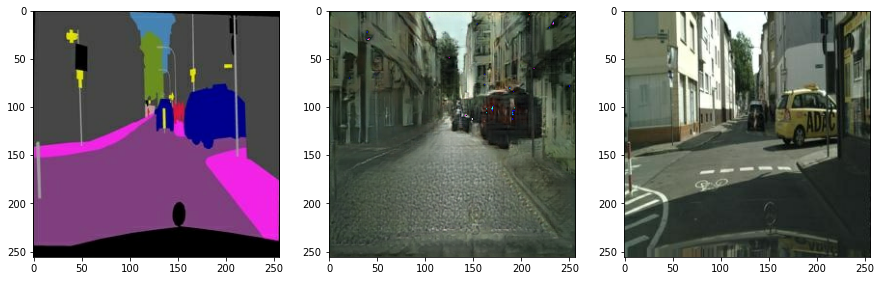

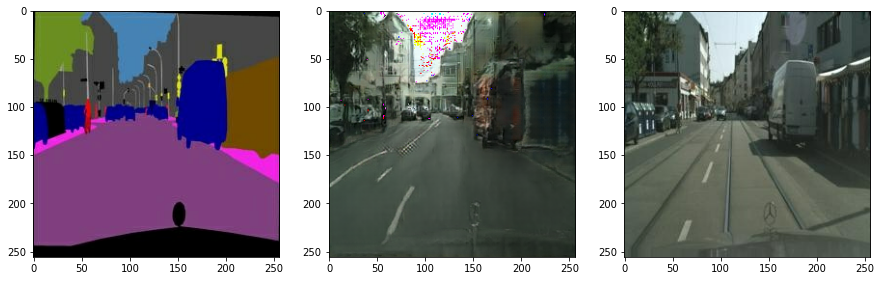

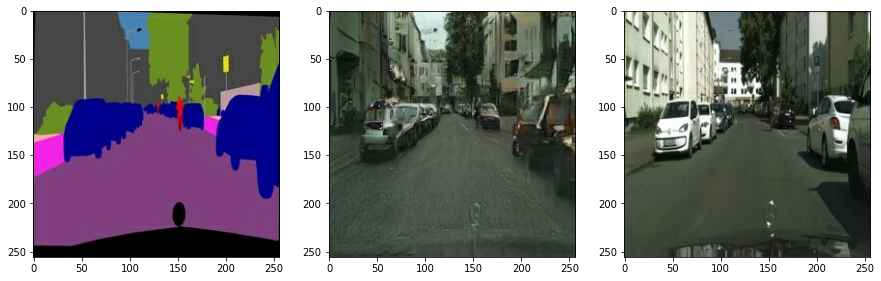

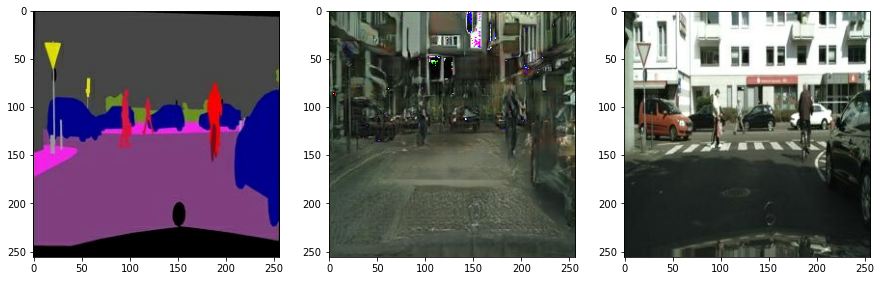

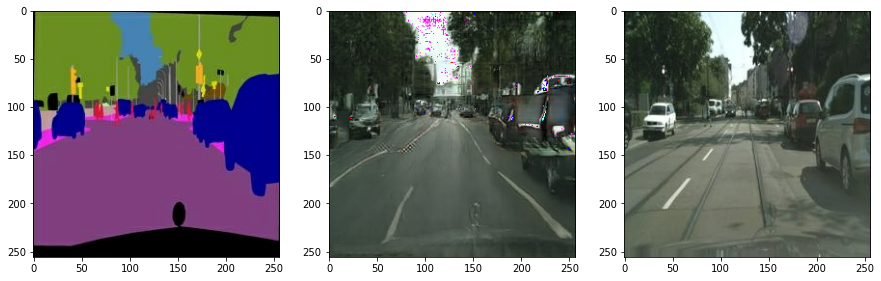

In [27]:
for test_ind in range(0,5):

    f = data_path2 + os.listdir(data_path2)[test_ind]
    print(f)
    sketch, colored = load_img(f)

    pred = generator(tf.expand_dims(sketch, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(15, 5))
    plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
    plt.subplot(1,3,2); plt.imshow(pred[0])
    plt.subplot(1,3,3); plt.imshow(denormalize(colored))

# 프로젝트 수행
프로젝트를 진행하면서 필수로 수행해야 할 사항은 다음과 같습니다.

1. 데이터에 한 가지 이상의 **augmentation 방법을 적용**하여 학습해 주세요.
(어떠한 방법을 사용했는지 적어주세요.)
2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 **U-Net Generator를 사용**해 주세요.
3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운로드했던 "val" 폴더 내 이미지를 사용해 주세요.
4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 **스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화**해 주세요.
5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 **중간 손실 값에 대한 로그**를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.


# 프로젝트 평가

| 평가문항 | 상세기준 | 수행 결과 |
|:---|:---|:---|
| 1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다. | 데이터 분석 과정 및 한 가지 이상의 augmentation을  <br> 포함한 데이터셋 구축 과정이 체계적으로 제시되었다. | 다섯 가지 적용 (1-4 부분 참고) |
| 2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다. | U-Net generator, discriminator 모델 구현이 완료되어  <br> train_step이 안정적으로 진행됨을 확인하였다. | U-Net generator 모델 구현 (2 부분 참고). <br> U-Net discriminator 모델 구현(3 부분 참고). <br> Train_step (4 부분 참고) |
| 3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다. | 10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서  <br> 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다. | 학습 과정 (4-4 부분 참고). <br> 테스트에 대한 시각화 결과 (5 부분 참고) |


### ▶ 프로젝트 코드 순서

1. 데이터 준비 및 전처리
  - 1-1. 데이터 준비 및 갯수 확인
  - 1-2. 데이터 시각화 및 이미지 크기 확인
  - 1-3. 이미지 분할
  - 1-4. 데이터 Augmentation
2. Pix2Pix Genaratot 구현
  - 2-1. Encode Block 구현
  - 2-2. Encoder 구현
  - 2-3. Encoder 모델 확인
  - 2-4. Decode Block 및 Decoder 구현
  - 2-5. Decoder 모델 확인
  - 2-6. Plain Generator 구현
  - 2-7. U-Net Genarator 구현
  - 2-8. U-Net Generator 모델 확인
3. Pix2Pix Discriminator 구현
  - 3-1. Discriminator Block 구현
  - 3-2. Discriminator 구현
  - 3-3. Discriminator 모델 확인
4. 모델 학습
  - 4-1. 손실함수 구현
  - 4-2. Optimizer 구현
  - 4-3. Train Step 구현
  - 4-4. 학습 실행
5. 모델 테스트

### ▶ Epoch 횟수에 따른 모델 테스트 결과

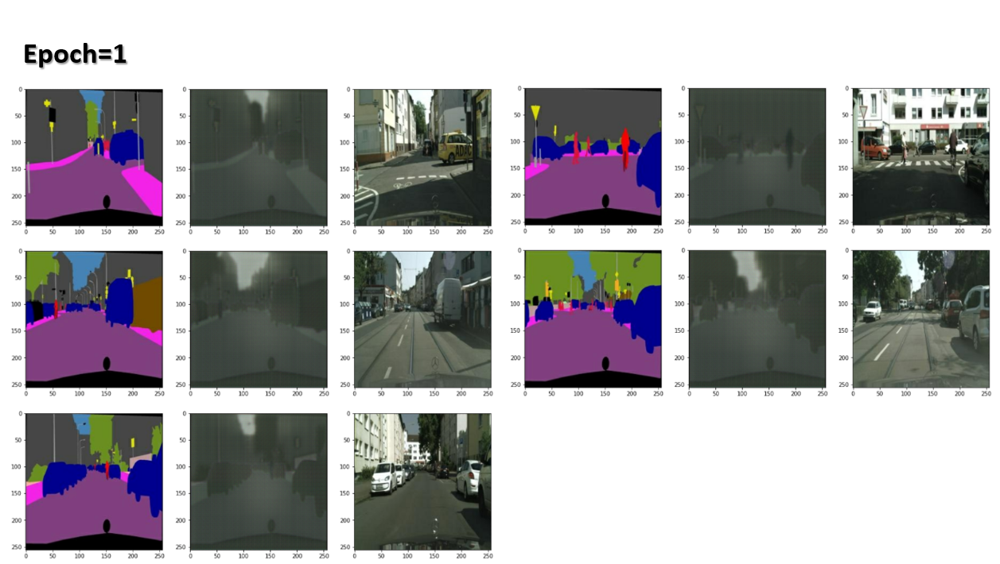
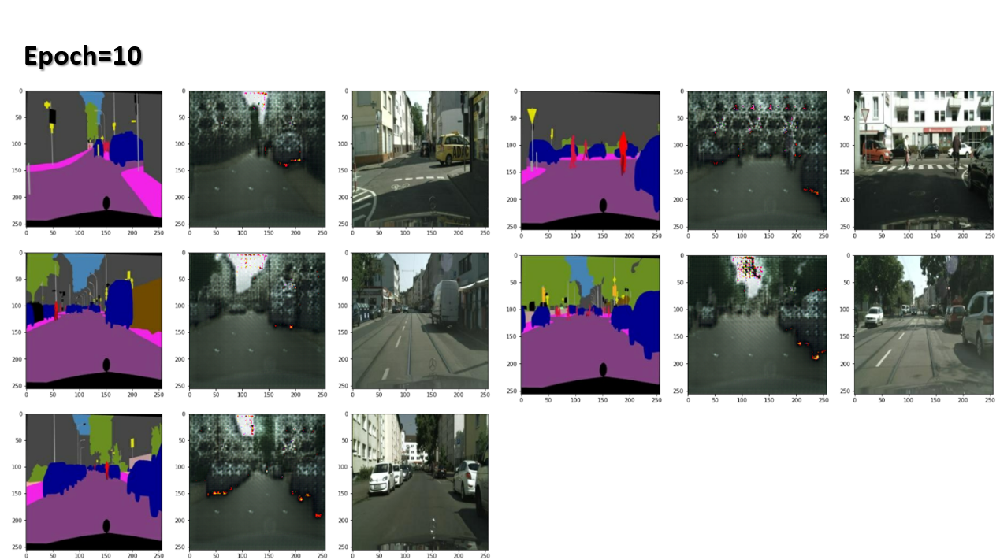
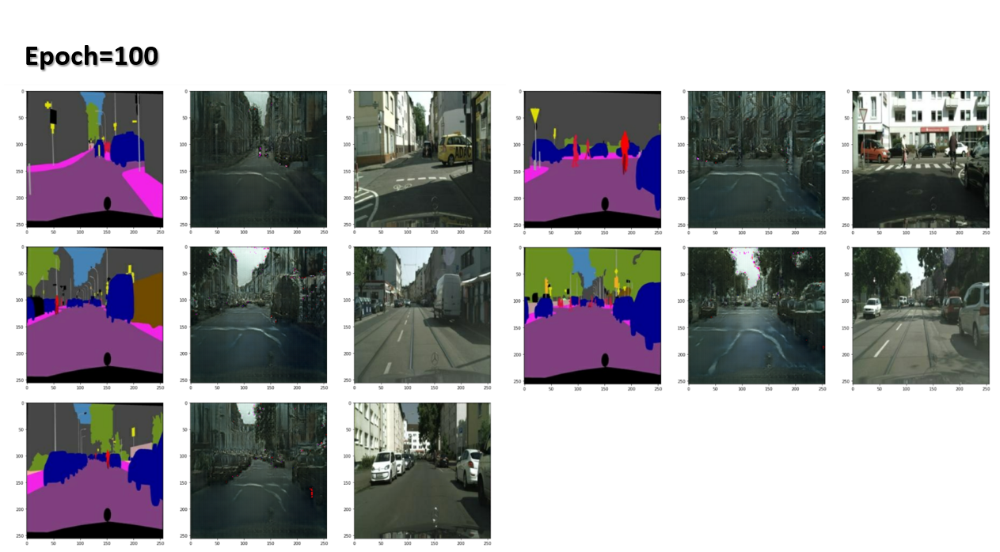
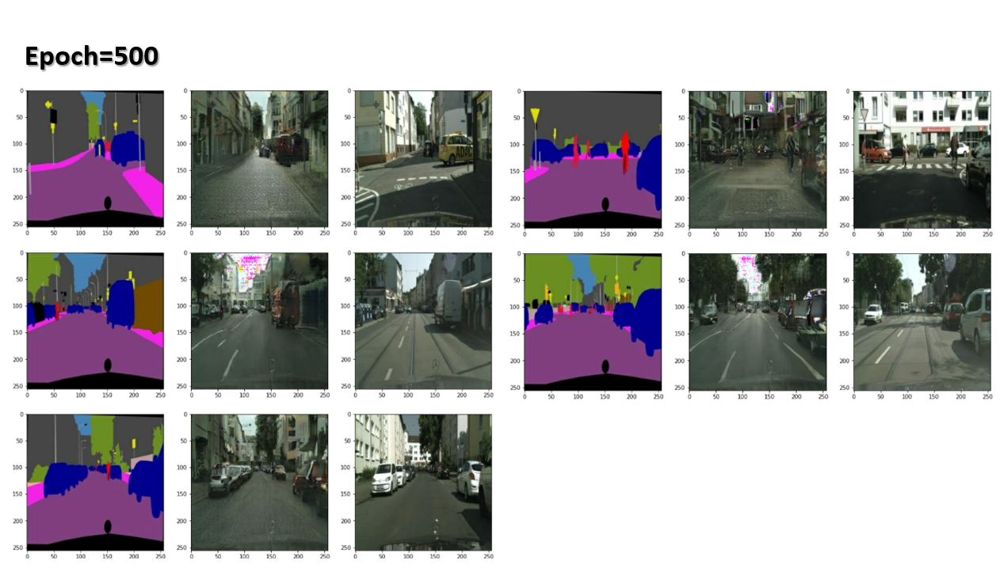

### ▶ 회고
1. 위에 보는 것처럼 학습 횟수(Epoch 수)가 증가할수록 결과(가운데 그림)가 좋아짐을 알 수 있다.
2. 인풋이 다르므로 직접적인 비교는 어려우나 Exp. \#10 (Deep Convolutional GAN) 보다 낮은 학습 횟수에서 더 좋은 품질의 결과가 나옴을 알 수 있다.
3. Exp. \#10에서도 느꼈지만, GAN을 기반으로 한 모델에서는 손실함수의 값이 생성된 이미지 품질을 짐작할 수 있게 하는 역할을 하지는 못하며 육안으로 이미지를 확인해야만 모델 성능 판단이 가능한 것으로 보인다. ([참고](https://yamalab.tistory.com/98))
4. GAN이라는 특정 모델에 대해 두 번의 노드(Exp #10, #17)에서 프로젝트를 진행하니 비교, 분석이 가능해서 좋았다.
5. 아직도 코드 Detail을 모르는 것이 많아서 자유롭게 모델 구성이나 변형 등을 의도대로 하기는 너무 어렵다.
  - 특히 Tensorflow의 각종 함수를 알려면 까마득하다~